In [1]:
!pip install tabpfn --no-index --find-links=file:///kaggle/input/pypi-iarc-packages/
!mkdir -p /opt/conda/lib/python3.10/site-packages/tabpfn/models_diff
!cp -r /kaggle/input/pypi-iarc-packages/prior_diff_real_checkpoint_n_0_epoch_100.cpkt/prior_diff_real_checkpoint_n_0_epoch_100.cpkt /opt/conda/lib/python3.10/site-packages/tabpfn/models_diff/

Looking in links: file:///kaggle/input/pypi-iarc-packages/
Processing /kaggle/input/pypi-iarc-packages/tabpfn-0.1.9-py3-none-any.whl


In [2]:
import numpy as np
import pandas as pd
import joblib
import optuna
from functools import partial

import xgboost as xgb
import lightgbm as lgb

# custom modules
from preproc import load_data,scale_data
#from calibration1 import (
#    calibrate_probs as calibrate_probs1,
#    optimize_calibration as optimize_calibration1
#)
from calibration2 import calibrate_probs,optimize_calibration

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
def balanced_logloss_(y_pred, y_true, eps=1e-7):
    n0 = np.sum(1-y_true)
    n1 = np.sum(y_true)
    p1 = np.clip(y_pred, eps, 1-eps)
    p0 = 1-p1
    log_loss0 = - np.sum((1-y_true) * np.log(p0)) / (n0+eps)
    log_loss1 = - np.sum(y_true * np.log(p1)) / (n1+eps)
    return (log_loss0 + log_loss1)/2


def compute_overall_metric(oof_dfs:list) -> float:
    all_metrics = [
        balanced_logloss_(oof.pred_proba.values, oof.Class.values)
        for oof in oof_dfs
    ]
    return np.mean(all_metrics)


def calibrate_oof(oof_dfs, calib_params):
    oof_dfs_calibrated = list()
    
    for oof in oof_dfs:
        oof = oof.copy(deep=True)
        calib_p1 = calibrate_probs(
            oof.pred_proba.values,
            **calib_params
        )
        oof["pred_proba"] = calib_p1
        oof_dfs_calibrated.append(oof)
        
    return oof_dfs_calibrated

In [4]:
# notebook parameter

CALIBRATE_FIRST = False

***
# load data and predictions

### 1. `lgbm-gbrt`

In [5]:
models_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/models.pkl")
calib_params_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/calib_params.pkl")
oof_dfs_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/oof_dataframes.pkl")

In [6]:
compute_overall_metric(oof_dfs_m01)

0.24033928714260183

In [7]:
oof_dfs_calib_m01 = calibrate_oof(oof_dfs_m01, calib_params_m01)
compute_overall_metric(oof_dfs_calib_m01)

0.22139398049564257

In [8]:
%%time
train,test,input_cols = load_data()

predicted_probs = [
    model.predict(test[input_cols]) 
    for model in models_m01
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m01)
predicted_probs_m01 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 234 ms, sys: 8.28 ms, total: 242 ms
Wall time: 236 ms


### 2. `lgbm-linear`

In [9]:
models_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/models.pkl")
calib_params_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/calib_params.pkl")
oof_dfs_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/oof_dataframes.pkl")

In [10]:
compute_overall_metric(oof_dfs_m02)

0.23776284612591142

In [11]:
oof_dfs_calib_m02 = calibrate_oof(oof_dfs_m02, calib_params_m02)
compute_overall_metric(oof_dfs_calib_m02)

0.21870748528950434

In [12]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(test[input_cols])
    for model in models_m02
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m02)
predicted_probs_m02 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 207 ms, sys: 18.8 ms, total: 226 ms
Wall time: 171 ms


### 3. `catboost`

In [13]:
models_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/models.pkl")
calib_params_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/calib_params.pkl")
oof_dfs_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/oof_dataframes.pkl")

In [14]:
compute_overall_metric(oof_dfs_m03)

0.2633244023340282

In [15]:
oof_dfs_calib_m03 = calibrate_oof(oof_dfs_m03, calib_params_m03)
compute_overall_metric(oof_dfs_calib_m03)

0.22835158860669114

In [16]:
%%time
train,test,input_cols = load_data()

predicted_probs = [
    model.predict(test[input_cols], prediction_type="Probability")[:,1]
    for model in models_m03
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m03)
predicted_probs_m03 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 308 ms, sys: 27.2 ms, total: 335 ms
Wall time: 321 ms


### 4. `tabpfn`

In [17]:
models_m04 = joblib.load("/kaggle/input/iarc-tabpfn/models.pkl")
calib_params_m04 = joblib.load("/kaggle/input/iarc-tabpfn/calib_params.pkl")
oof_dfs_m04 = joblib.load("/kaggle/input/iarc-tabpfn/oof_dataframes.pkl")

In [18]:
compute_overall_metric(oof_dfs_m04)

0.3900050155836857

In [19]:
oof_dfs_calib_m04 = calibrate_oof(oof_dfs_m04, calib_params_m04)
compute_overall_metric(oof_dfs_calib_m04)

0.28839025101520327

In [20]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols, impute_only=True)

predicted_probs = [
    model.predict_proba(test[input_cols])[:,1] 
    for model in models_m04
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m04)
predicted_probs_m04 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 2min 51s, sys: 3.59 s, total: 2min 54s
Wall time: 1min 46s


### 5. `multiout-mlp`

In [21]:
models_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/models.pkl")
calib_params_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/calib_params.pkl")
oof_dfs_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/oof_dataframes.pkl")

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [22]:
compute_overall_metric(oof_dfs_m05)

0.30563847176445524

In [23]:
oof_dfs_calib_m05 = calibrate_oof(oof_dfs_m05, calib_params_m05)
compute_overall_metric(oof_dfs_calib_m05)

0.2904142458122567

In [24]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(test[input_cols].values, verbose=0)[0][:,1:].sum(axis=1)
    for model in models_m05
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m05)
predicted_probs_m05 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 9.04 s, sys: 156 ms, total: 9.19 s
Wall time: 9.36 s


### 6. `xgb-gblinear`

In [25]:
models_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/models.pkl")
calib_params_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/calib_params.pkl")
oof_dfs_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/oof_dataframes.pkl")

[19:35:43] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[19:35:43] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[19:35:43] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, pl

In [26]:
compute_overall_metric(oof_dfs_m06)

0.37894304572238047

In [27]:
oof_dfs_calib_m06 = calibrate_oof(oof_dfs_m06, calib_params_m06)
compute_overall_metric(oof_dfs_calib_m06)

0.36502436920847003

In [28]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(xgb.DMatrix(test[input_cols]))
    for model in models_m06
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m06)
predicted_probs_m06 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 337 ms, sys: 4.91 ms, total: 342 ms
Wall time: 376 ms


### 7. xgb-gbtree

In [29]:
models_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/models.pkl")
calib_params_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/calib_params.pkl")
oof_dfs_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/oof_dataframes.pkl")

[19:35:44] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[19:35:44] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[19:35:45] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, pl

In [30]:
compute_overall_metric(oof_dfs_m07)

0.27239995042577647

In [31]:
oof_dfs_calib_m07 = calibrate_oof(oof_dfs_m07, calib_params_m07)
compute_overall_metric(oof_dfs_calib_m07)

0.22564184381208174

In [32]:
%%time
train,test,ianput_cols = load_data()

predicted_probs = [
    model.predict(xgb.DMatrix(test[input_cols]))
    for model in models_m07
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m07)
predicted_probs_m07 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 365 ms, sys: 3.88 ms, total: 369 ms
Wall time: 372 ms


***
# stacking model training

In [33]:
# models to consider

if not CALIBRATE_FIRST:
    print("using non calibrated")
    oof_all = [
        oof_dfs_m01,
        oof_dfs_m02,
        oof_dfs_m03,
        oof_dfs_m04,
        oof_dfs_m05,
        oof_dfs_m06,
        oof_dfs_m07,
    ]
else:
    print("using calibrated")
    oof_all = [
        oof_dfs_calib_m01,
        oof_dfs_calib_m02,
        oof_dfs_calib_m03,
        oof_dfs_calib_m04,
        oof_dfs_calib_m05,
        oof_dfs_calib_m06,
        oof_dfs_calib_m07,
    ]

for _oof_dfs in oof_all:
    print(compute_overall_metric(_oof_dfs))

using non calibrated
0.24033928714260183
0.23776284612591142
0.2633244023340282
0.3900050155836857
0.30563847176445524
0.37894304572238047
0.27239995042577647


In [34]:
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

In [35]:
repeated_cv_split = joblib.load("/kaggle/input/iarc-data-split/repeated_5fold_cv_split_4validation.pkl")
print(len(repeated_cv_split))

# number of repetitions to use
REPETITIONS = 10

10


In [36]:
pct = train.Class.value_counts(normalize=True)
scale_pos_weight = pct[0]/pct[1]
print("scale_pos_weight:", scale_pos_weight)

cnt = train.Class.value_counts(normalize=False)
neg_bagging_fraction = cnt[1]/cnt[0]
print("neg_bagging_fraction:", neg_bagging_fraction)

scale_pos_weight: 4.712962962962963
neg_bagging_fraction: 0.21218074656188604


In [37]:
model_params = {
    'objective': 'binary',
    'metric': 'None',
    'learning_rate': 0.005,
    'bagging_freq': 1,
    'seed': 2112,
    'first_metric_only': False,
    'feature_pre_filter': False,
    'verbosity': -1,
    'linear_tree': True,

    'pos_bagging_fraction': 1,
    'neg_bagging_fraction': 0.21218074656188604,
    'feature_fraction': 0.2,
    'lambda_l1': 9.680846523945732e-08,
    'lambda_l2': 74.9291423174379,
    'linear_lambda': 2.7495784244870075e-07,
    'min_data_in_leaf': 47,
    'min_gain_to_split': 1.618626990154026e-10,
    'num_iterations': 1450,
    'path_smooth': 5.916928003551623e-09,
    'max_bin': 7,
    'num_leaves': 7
}


In [38]:
def include_oof_preds(train, input_cols, oof_all, repeat_nbr):
    train = train.copy()
    input_cols = input_cols.tolist().copy()
    n_models = len(oof_all)
    
    for i in range(n_models):
        _oof = oof_all[i][repeat_nbr][["Id","pred_proba"]].rename({"pred_proba":f"pm{i+1}"}, axis=1)
        train = pd.merge(train, _oof)
        input_cols.append(f"pm{i+1}")
        
    return train,input_cols

In [39]:
def balanced_logloss(y_pred: np.ndarray, data: lgb.Dataset):
    y_true = data.get_label()
    return 'balanced_logloss', balanced_logloss_(y_pred, y_true), False 

import matplotlib.pyplot as plt

REPEAT NUMBER: 1/10
training model for fold: 1/5


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[100]	valid_0's balanced_logloss: 0.579441
[200]	valid_0's balanced_logloss: 0.445634
[300]	valid_0's balanced_logloss: 0.377124
[400]	valid_0's balanced_logloss: 0.33834
[500]	valid_0's balanced_logloss: 0.315515
[600]	valid_0's balanced_logloss: 0.306793
[700]	valid_0's balanced_logloss: 0.299699
[800]	valid_0's balanced_logloss: 0.293876
[900]	valid_0's balanced_logloss: 0.292086
[1000]	valid_0's balanced_logloss: 0.292449
[1100]	valid_0's balanced_logloss: 0.294701
[1200]	valid_0's balanced_logloss: 0.297214
[1300]	valid_0's balanced_logloss: 0.304543
[1400]	valid_0's balanced_logloss: 0.307243


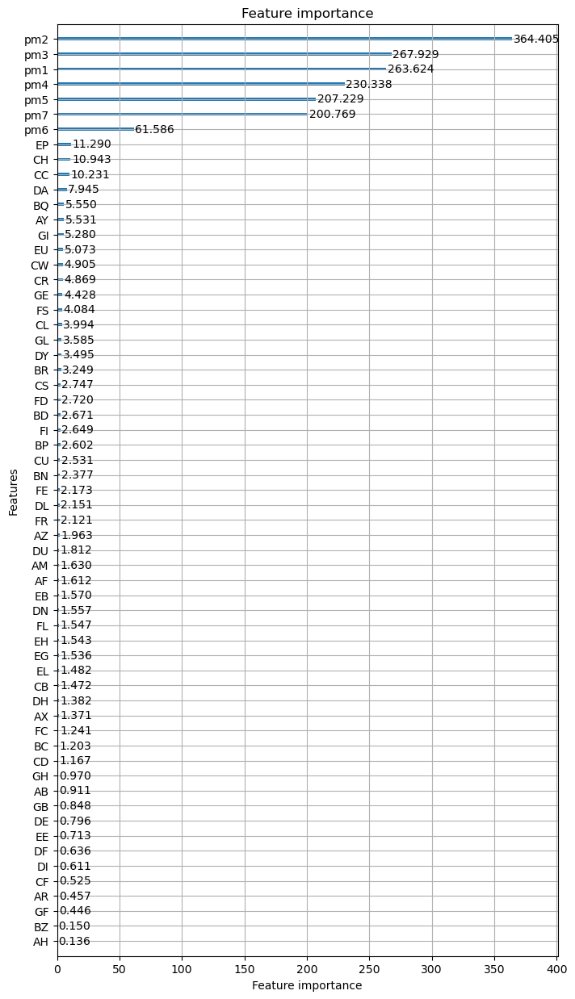

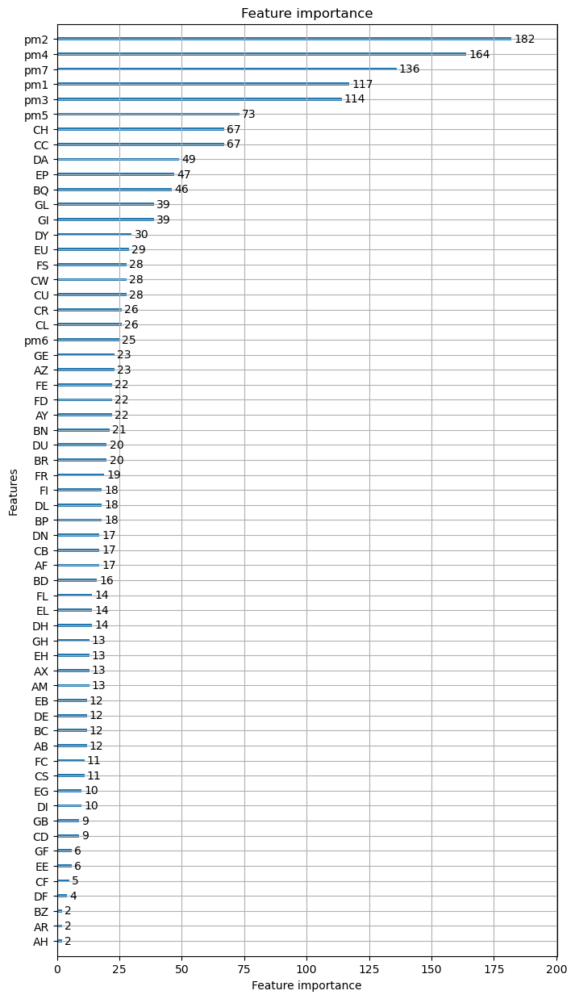

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.547276


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.40001
[300]	valid_0's balanced_logloss: 0.330487
[400]	valid_0's balanced_logloss: 0.293522
[500]	valid_0's balanced_logloss: 0.277221
[600]	valid_0's balanced_logloss: 0.269093
[700]	valid_0's balanced_logloss: 0.267375
[800]	valid_0's balanced_logloss: 0.268239
[900]	valid_0's balanced_logloss: 0.268313
[1000]	valid_0's balanced_logloss: 0.268456
[1100]	valid_0's balanced_logloss: 0.269931
[1200]	valid_0's balanced_logloss: 0.269947
[1300]	valid_0's balanced_logloss: 0.273591
[1400]	valid_0's balanced_logloss: 0.273728


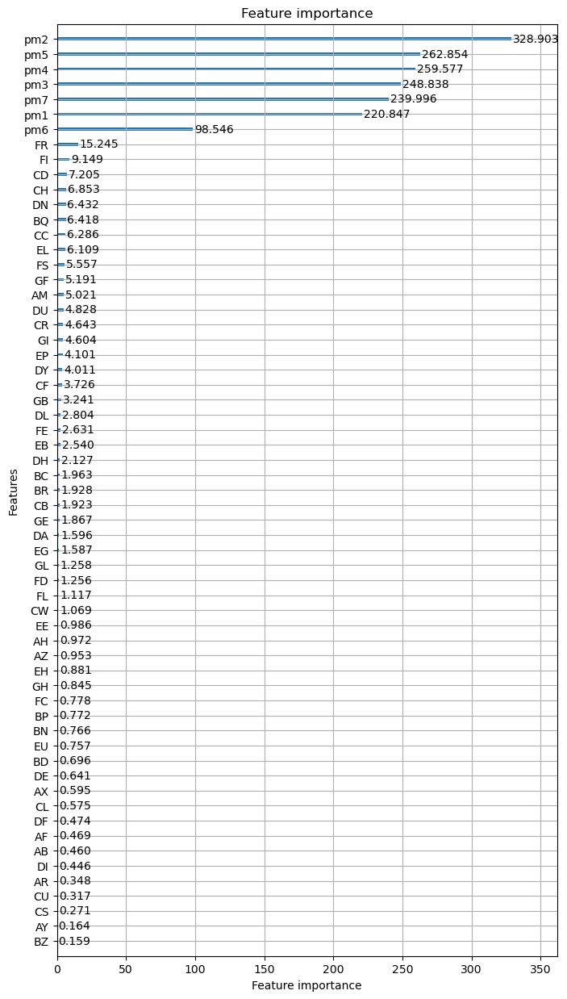

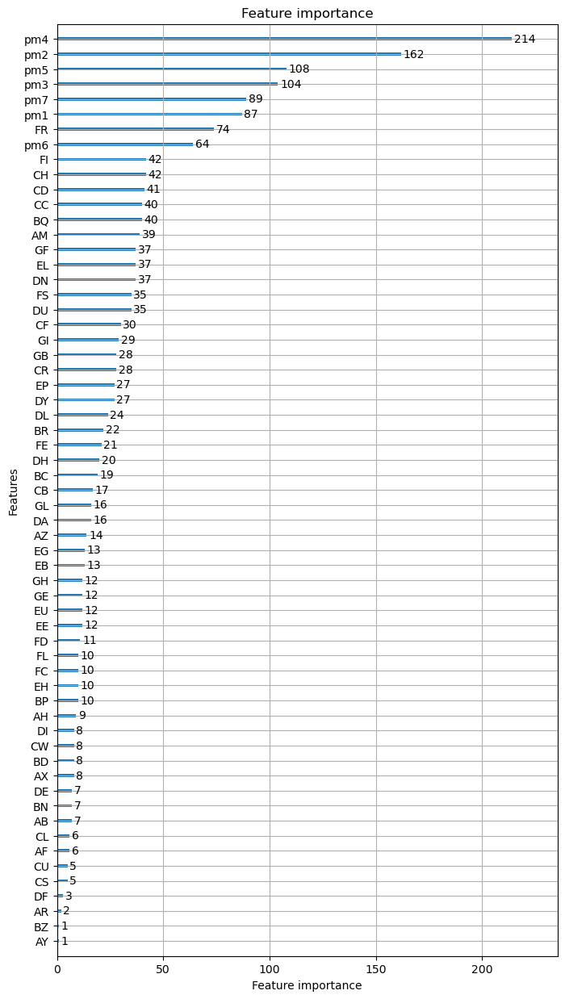

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.5417


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.385973
[300]	valid_0's balanced_logloss: 0.297855
[400]	valid_0's balanced_logloss: 0.244079
[500]	valid_0's balanced_logloss: 0.208086
[600]	valid_0's balanced_logloss: 0.18305
[700]	valid_0's balanced_logloss: 0.166401
[800]	valid_0's balanced_logloss: 0.154841
[900]	valid_0's balanced_logloss: 0.149498
[1000]	valid_0's balanced_logloss: 0.143423
[1100]	valid_0's balanced_logloss: 0.13965
[1200]	valid_0's balanced_logloss: 0.137349
[1300]	valid_0's balanced_logloss: 0.136164
[1400]	valid_0's balanced_logloss: 0.134393


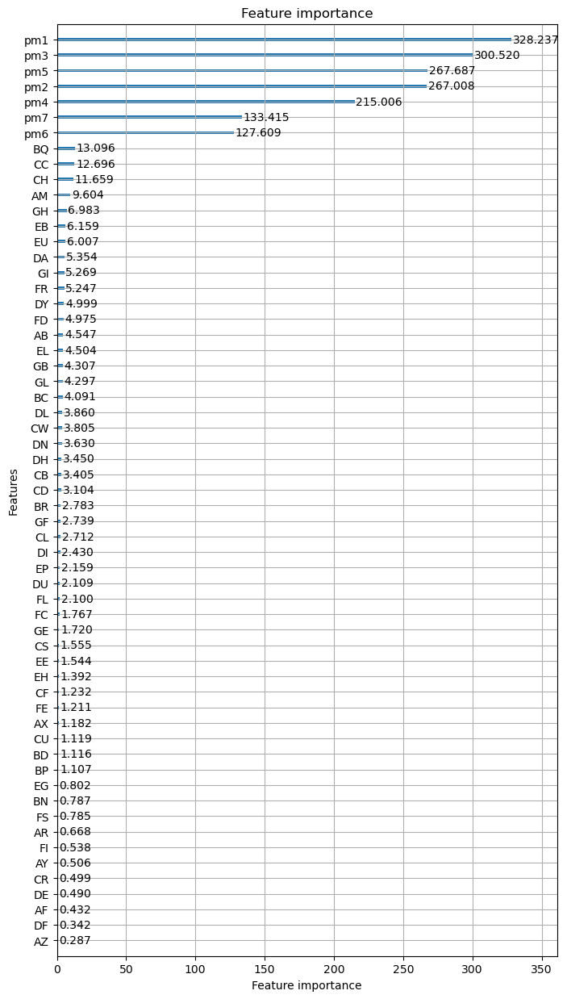

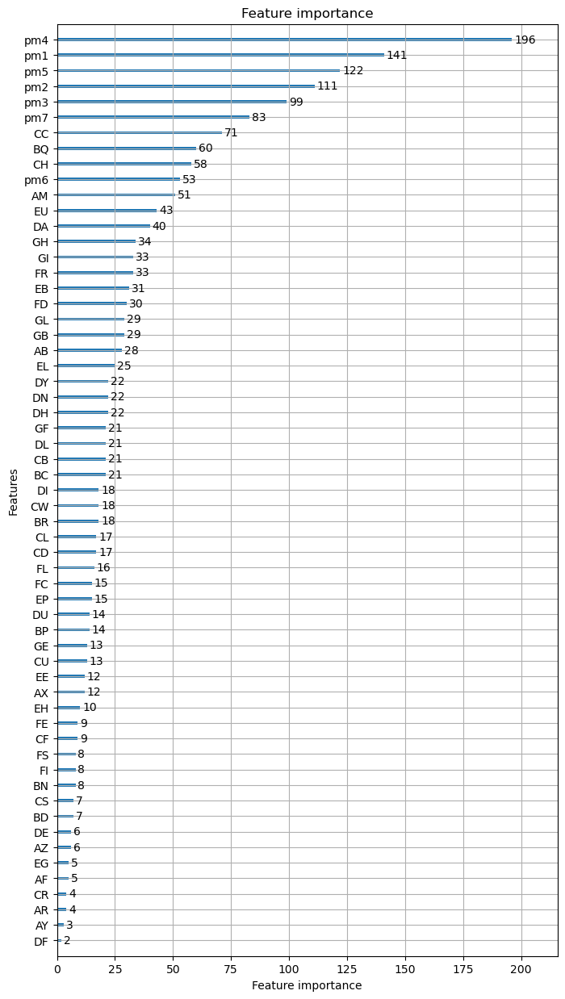

training model for fold: 4/5


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[100]	valid_0's balanced_logloss: 0.530824
[200]	valid_0's balanced_logloss: 0.376708
[300]	valid_0's balanced_logloss: 0.292599
[400]	valid_0's balanced_logloss: 0.23668
[500]	valid_0's balanced_logloss: 0.205465
[600]	valid_0's balanced_logloss: 0.187145
[700]	valid_0's balanced_logloss: 0.175449
[800]	valid_0's balanced_logloss: 0.166024
[900]	valid_0's balanced_logloss: 0.162816
[1000]	valid_0's balanced_logloss: 0.159891
[1100]	valid_0's balanced_logloss: 0.156446
[1200]	valid_0's balanced_logloss: 0.154824
[1300]	valid_0's balanced_logloss: 0.153417
[1400]	valid_0's balanced_logloss: 0.152453


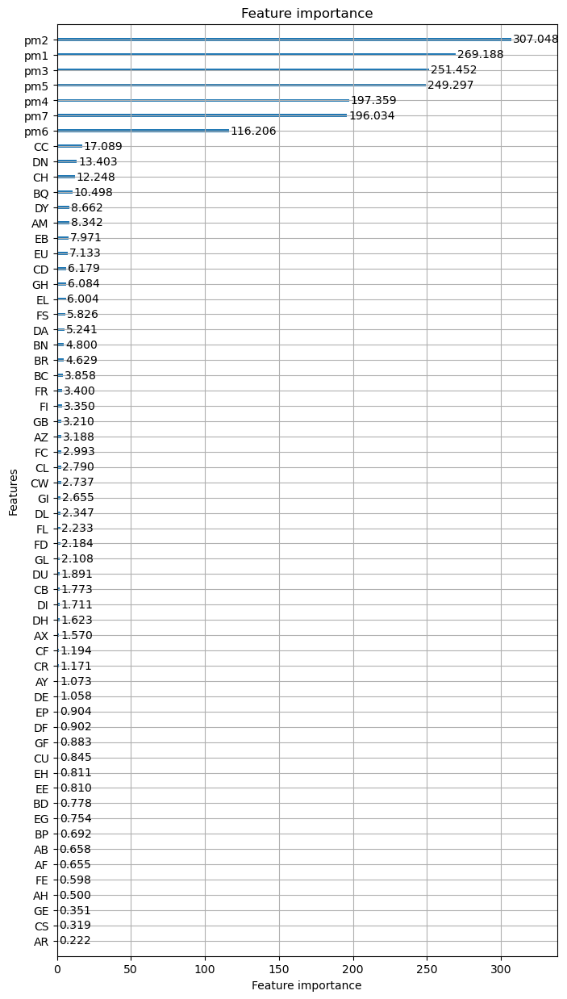

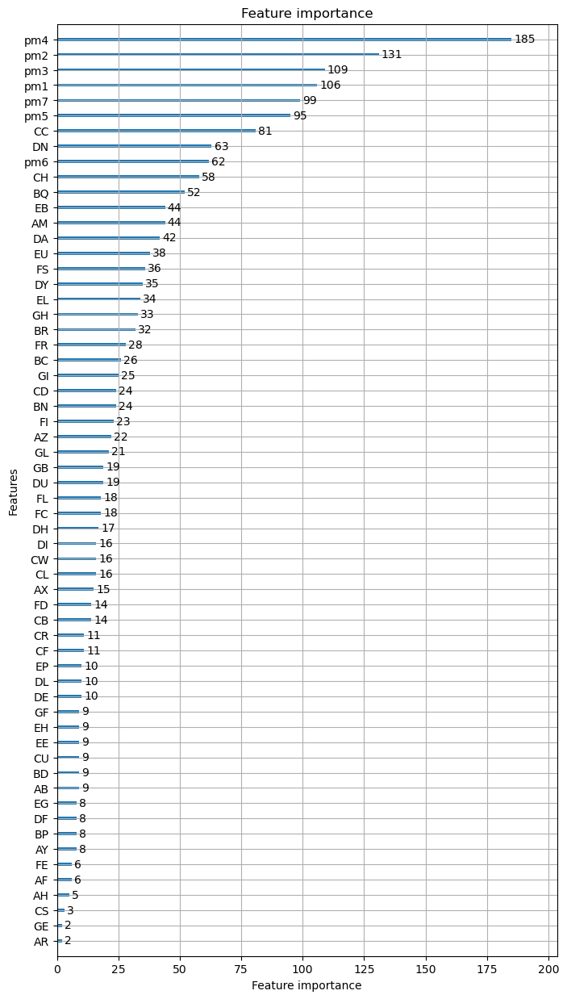

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.545374


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.39309
[300]	valid_0's balanced_logloss: 0.316715
[400]	valid_0's balanced_logloss: 0.276569
[500]	valid_0's balanced_logloss: 0.255509
[600]	valid_0's balanced_logloss: 0.243814
[700]	valid_0's balanced_logloss: 0.237896
[800]	valid_0's balanced_logloss: 0.237241
[900]	valid_0's balanced_logloss: 0.236399
[1000]	valid_0's balanced_logloss: 0.237741
[1100]	valid_0's balanced_logloss: 0.238527
[1200]	valid_0's balanced_logloss: 0.239979
[1300]	valid_0's balanced_logloss: 0.242136
[1400]	valid_0's balanced_logloss: 0.245253


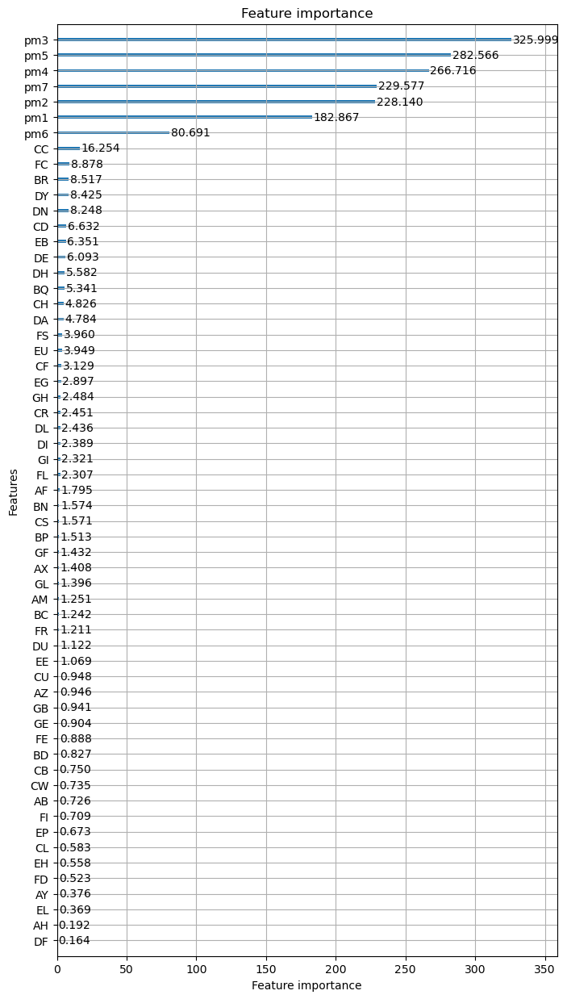

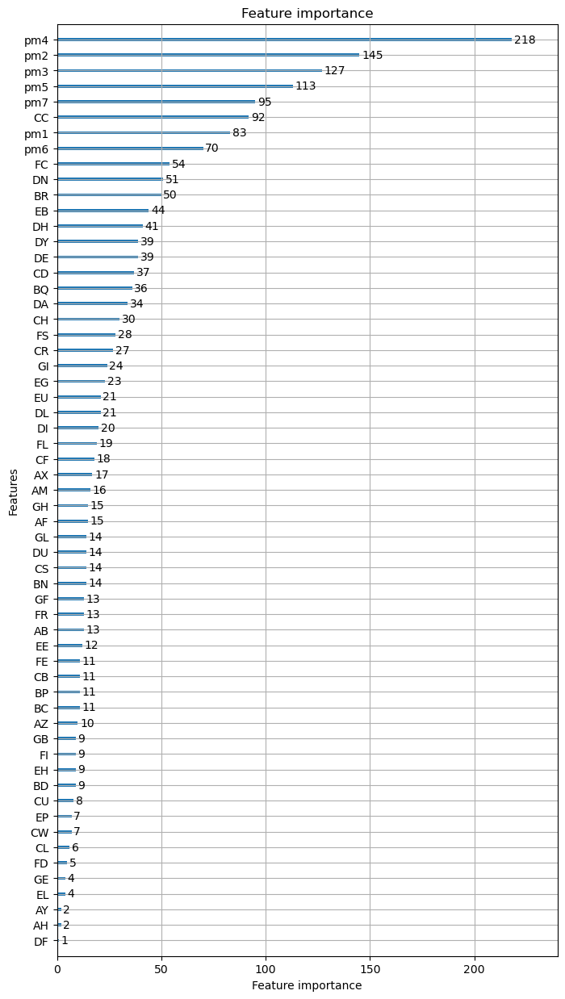

REPEAT NUMBER: 2/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.551965


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.392914
[300]	valid_0's balanced_logloss: 0.312524
[400]	valid_0's balanced_logloss: 0.262253
[500]	valid_0's balanced_logloss: 0.234211
[600]	valid_0's balanced_logloss: 0.21931
[700]	valid_0's balanced_logloss: 0.2088
[800]	valid_0's balanced_logloss: 0.204043
[900]	valid_0's balanced_logloss: 0.199775
[1000]	valid_0's balanced_logloss: 0.198961
[1100]	valid_0's balanced_logloss: 0.199658
[1200]	valid_0's balanced_logloss: 0.199148
[1300]	valid_0's balanced_logloss: 0.200485
[1400]	valid_0's balanced_logloss: 0.200332


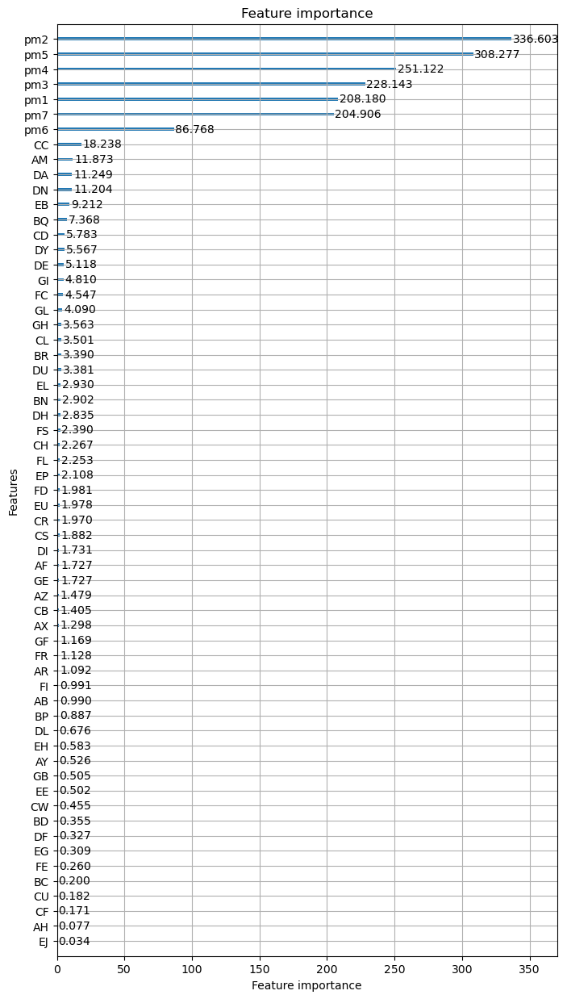

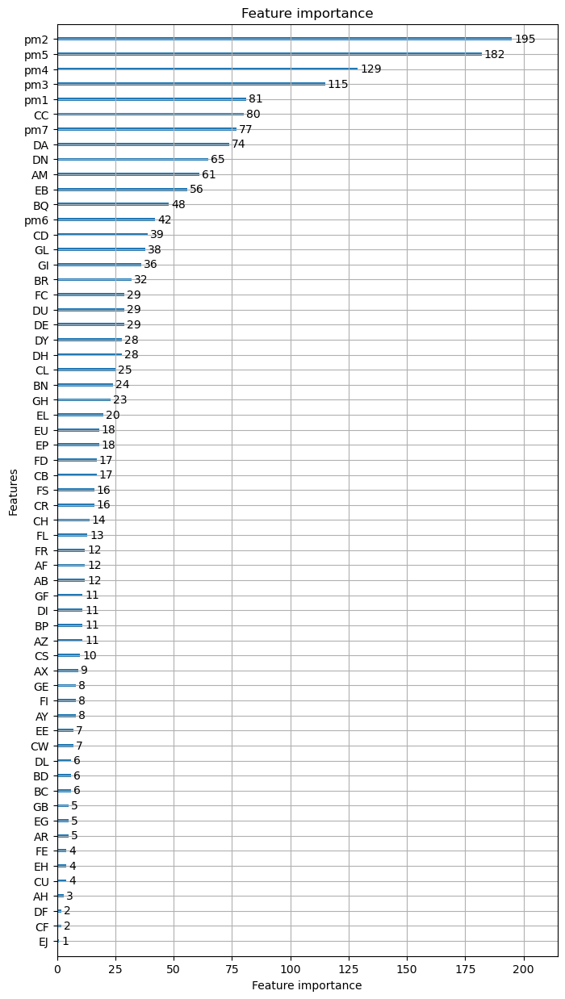

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.55322


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.391572
[300]	valid_0's balanced_logloss: 0.298374
[400]	valid_0's balanced_logloss: 0.240846
[500]	valid_0's balanced_logloss: 0.208737
[600]	valid_0's balanced_logloss: 0.189464
[700]	valid_0's balanced_logloss: 0.176358
[800]	valid_0's balanced_logloss: 0.169849
[900]	valid_0's balanced_logloss: 0.164884
[1000]	valid_0's balanced_logloss: 0.162267
[1100]	valid_0's balanced_logloss: 0.160479
[1200]	valid_0's balanced_logloss: 0.161526
[1300]	valid_0's balanced_logloss: 0.159534
[1400]	valid_0's balanced_logloss: 0.16023


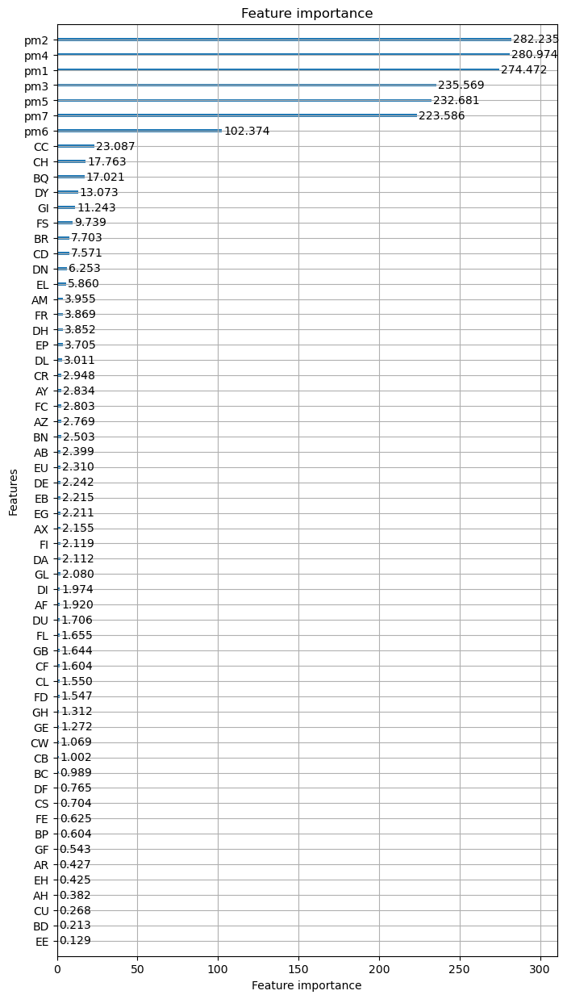

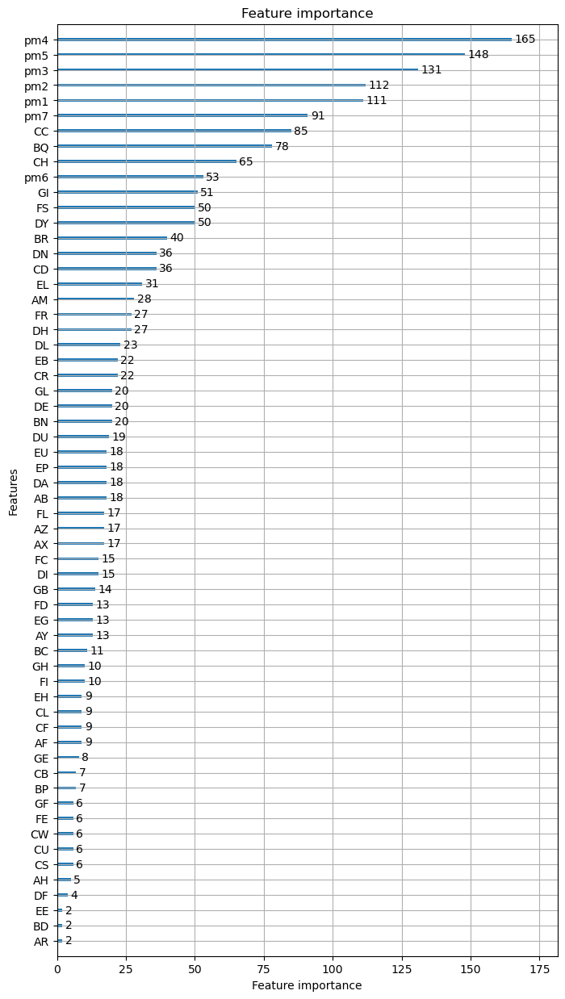

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.552517


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.405247
[300]	valid_0's balanced_logloss: 0.332125
[400]	valid_0's balanced_logloss: 0.289575
[500]	valid_0's balanced_logloss: 0.271141
[600]	valid_0's balanced_logloss: 0.26149
[700]	valid_0's balanced_logloss: 0.258772
[800]	valid_0's balanced_logloss: 0.256179
[900]	valid_0's balanced_logloss: 0.253651
[1000]	valid_0's balanced_logloss: 0.254117
[1100]	valid_0's balanced_logloss: 0.254949
[1200]	valid_0's balanced_logloss: 0.25681
[1300]	valid_0's balanced_logloss: 0.260397
[1400]	valid_0's balanced_logloss: 0.262351


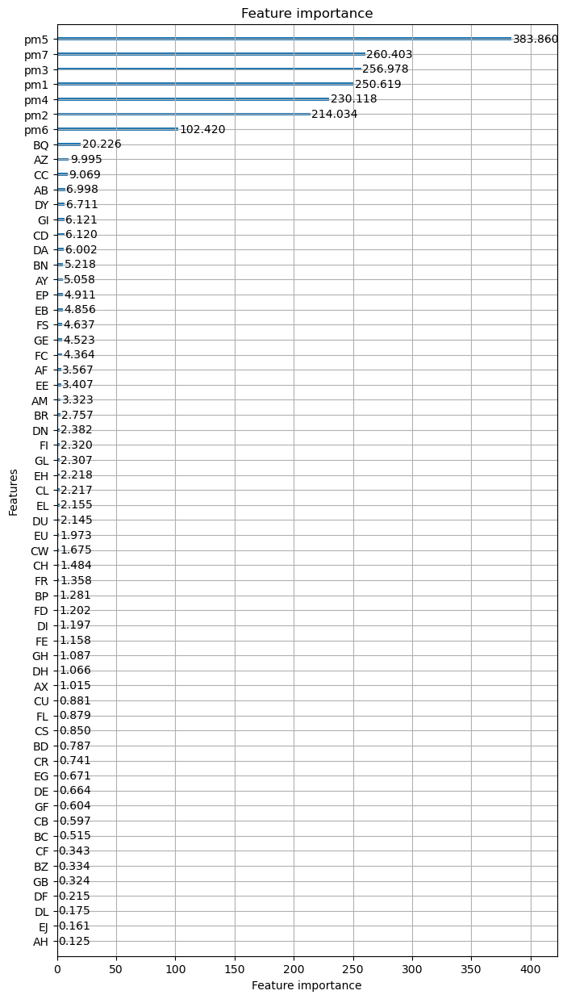

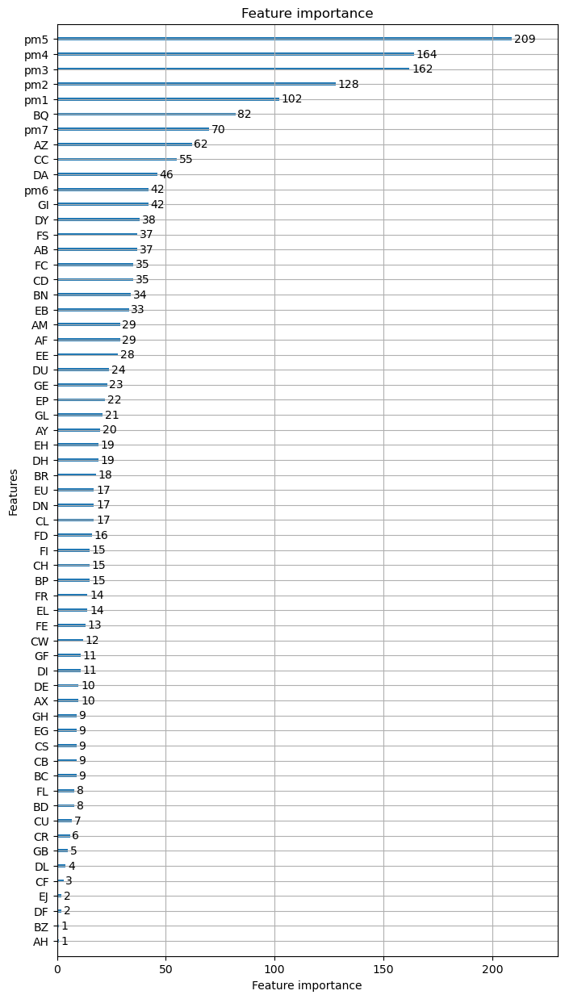

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.524913


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.356219
[300]	valid_0's balanced_logloss: 0.273339
[400]	valid_0's balanced_logloss: 0.225066
[500]	valid_0's balanced_logloss: 0.198327
[600]	valid_0's balanced_logloss: 0.183092
[700]	valid_0's balanced_logloss: 0.175609
[800]	valid_0's balanced_logloss: 0.172737
[900]	valid_0's balanced_logloss: 0.17384
[1000]	valid_0's balanced_logloss: 0.173851
[1100]	valid_0's balanced_logloss: 0.173712
[1200]	valid_0's balanced_logloss: 0.174198
[1300]	valid_0's balanced_logloss: 0.173448
[1400]	valid_0's balanced_logloss: 0.173549


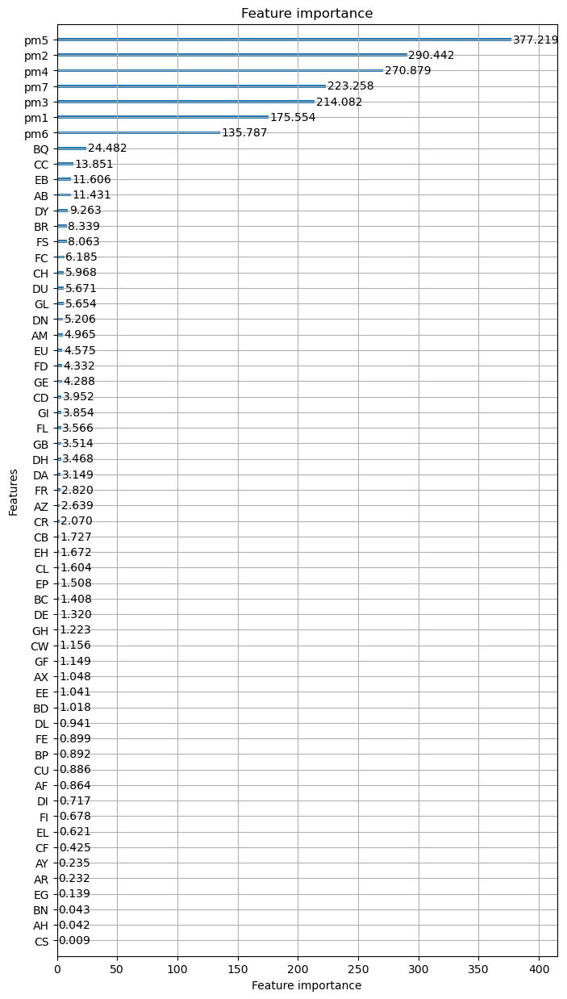

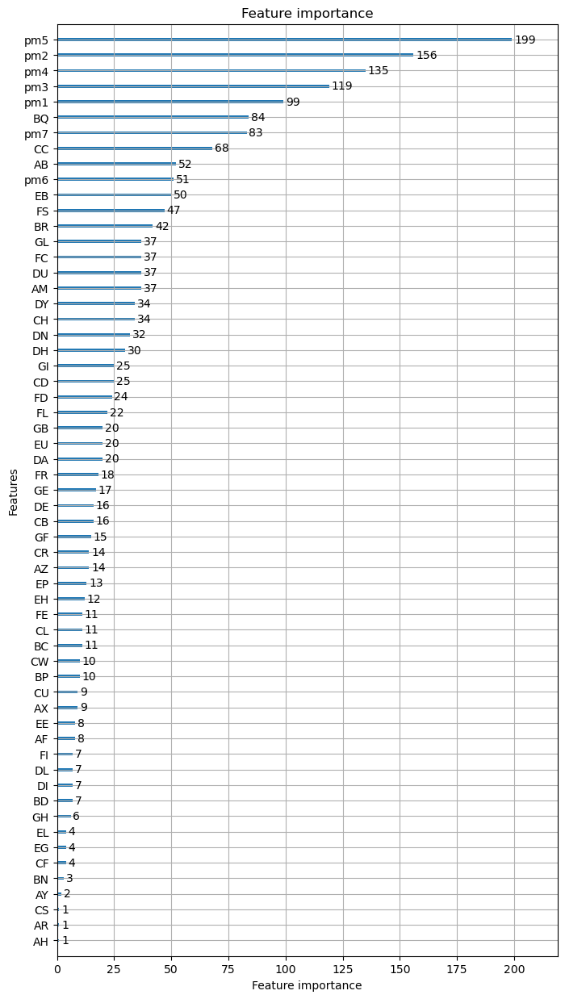

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.572474


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.435545
[300]	valid_0's balanced_logloss: 0.372955
[400]	valid_0's balanced_logloss: 0.340406
[500]	valid_0's balanced_logloss: 0.326981
[600]	valid_0's balanced_logloss: 0.319346
[700]	valid_0's balanced_logloss: 0.317068
[800]	valid_0's balanced_logloss: 0.317757
[900]	valid_0's balanced_logloss: 0.319153
[1000]	valid_0's balanced_logloss: 0.319986
[1100]	valid_0's balanced_logloss: 0.325736
[1200]	valid_0's balanced_logloss: 0.330735
[1300]	valid_0's balanced_logloss: 0.332586
[1400]	valid_0's balanced_logloss: 0.33755


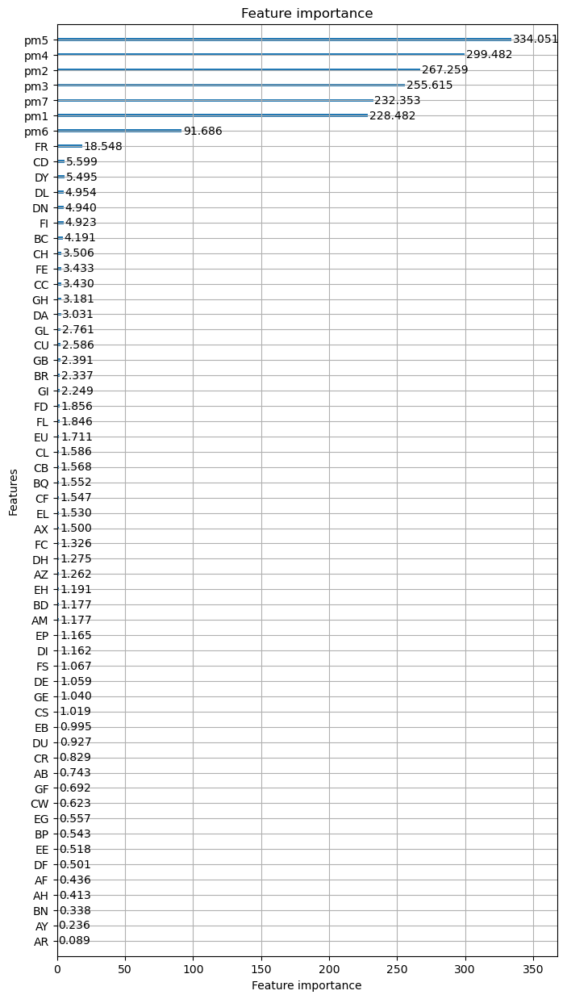

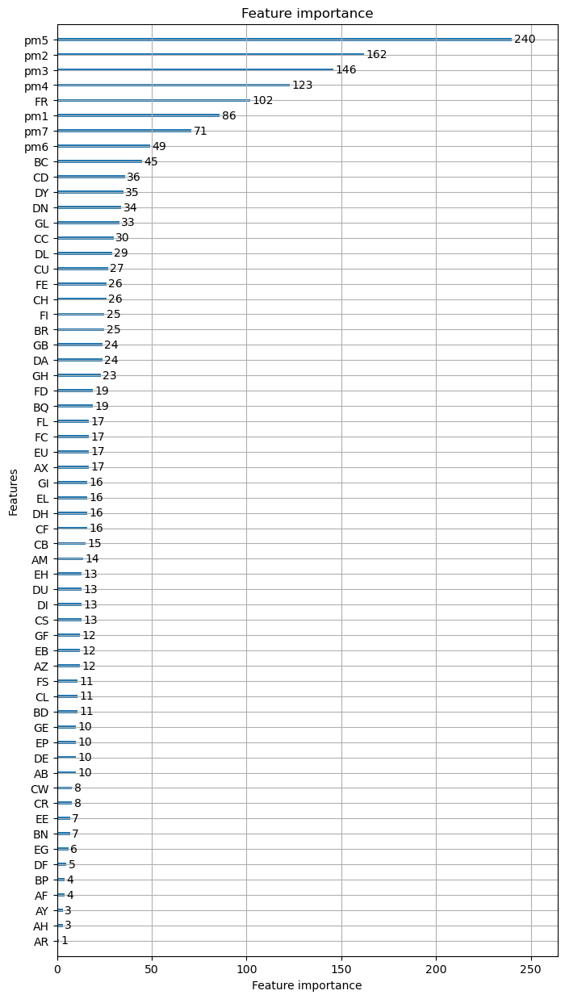

REPEAT NUMBER: 3/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.545032


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.38747
[300]	valid_0's balanced_logloss: 0.310468
[400]	valid_0's balanced_logloss: 0.2673
[500]	valid_0's balanced_logloss: 0.243301
[600]	valid_0's balanced_logloss: 0.227253
[700]	valid_0's balanced_logloss: 0.222146
[800]	valid_0's balanced_logloss: 0.219279
[900]	valid_0's balanced_logloss: 0.217532
[1000]	valid_0's balanced_logloss: 0.215029
[1100]	valid_0's balanced_logloss: 0.212061
[1200]	valid_0's balanced_logloss: 0.212407
[1300]	valid_0's balanced_logloss: 0.211559
[1400]	valid_0's balanced_logloss: 0.210286


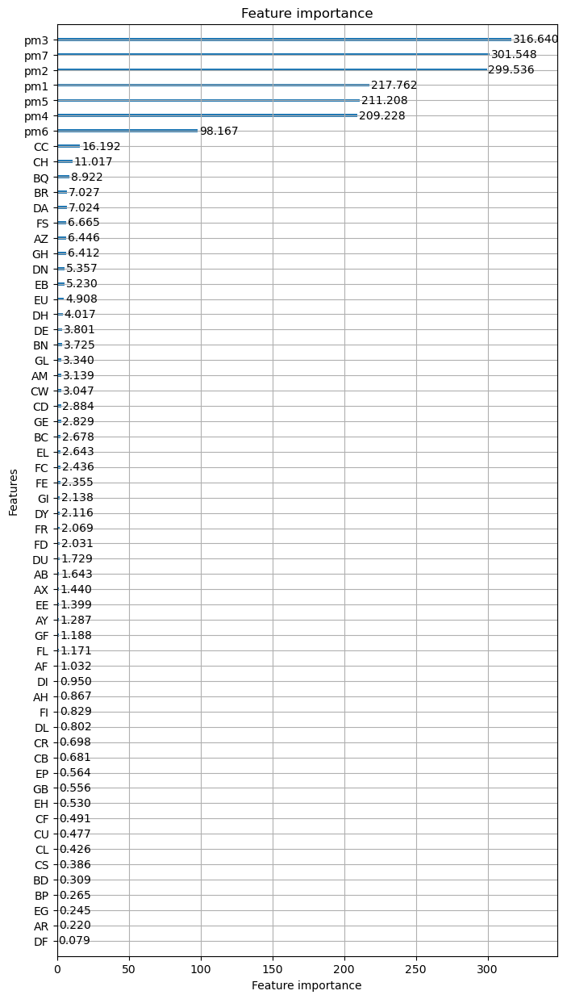

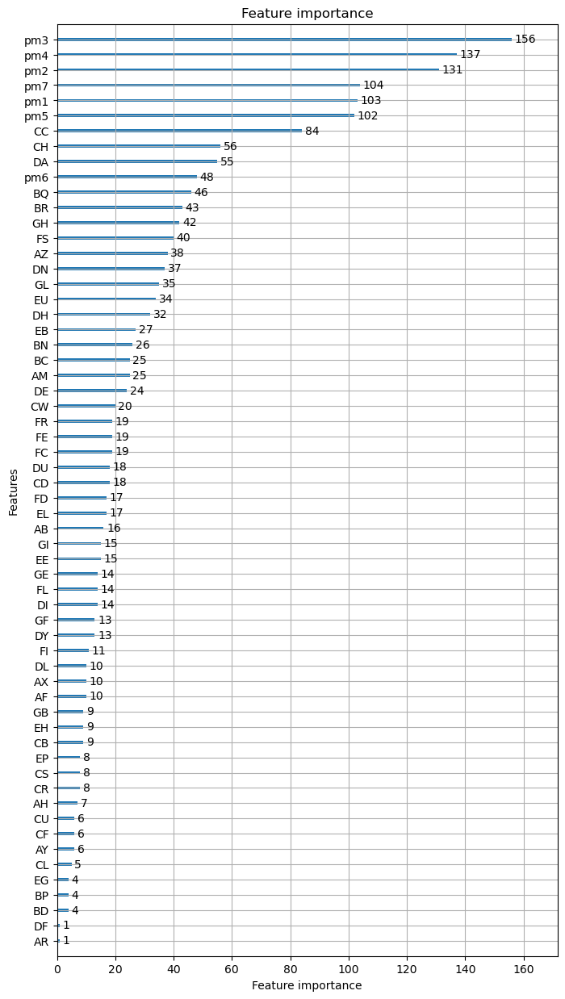

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.572926


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.422595
[300]	valid_0's balanced_logloss: 0.346412
[400]	valid_0's balanced_logloss: 0.301283
[500]	valid_0's balanced_logloss: 0.273284
[600]	valid_0's balanced_logloss: 0.258569
[700]	valid_0's balanced_logloss: 0.254375
[800]	valid_0's balanced_logloss: 0.252042
[900]	valid_0's balanced_logloss: 0.250864
[1000]	valid_0's balanced_logloss: 0.254479
[1100]	valid_0's balanced_logloss: 0.25781
[1200]	valid_0's balanced_logloss: 0.261954
[1300]	valid_0's balanced_logloss: 0.267823
[1400]	valid_0's balanced_logloss: 0.274765


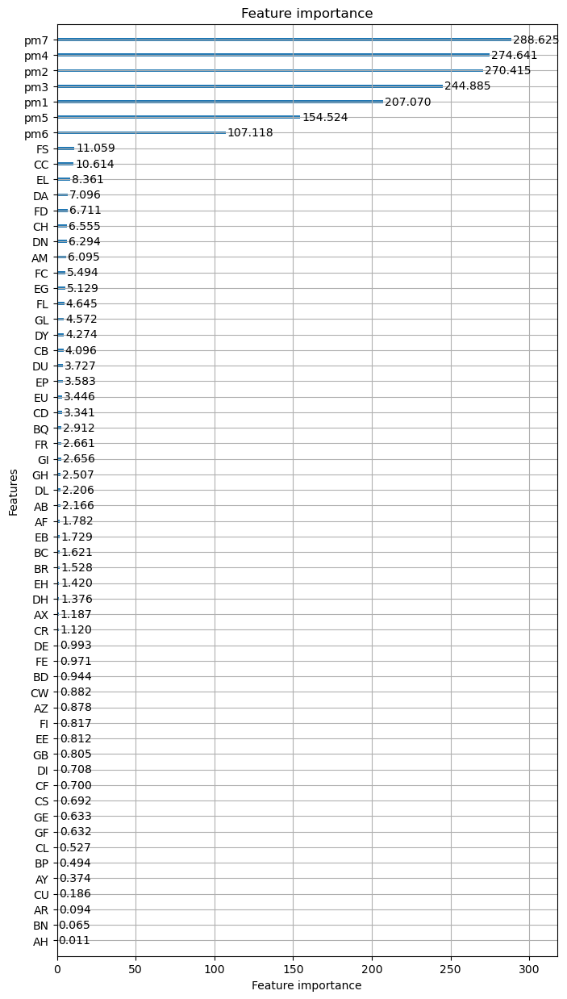

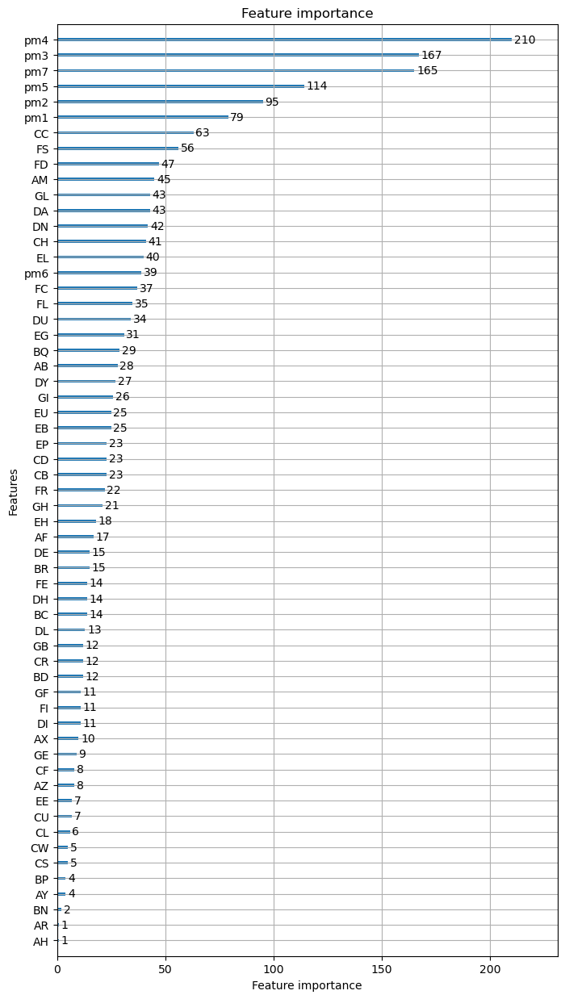

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.538976


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.389738
[300]	valid_0's balanced_logloss: 0.309959
[400]	valid_0's balanced_logloss: 0.262137
[500]	valid_0's balanced_logloss: 0.233674
[600]	valid_0's balanced_logloss: 0.213711
[700]	valid_0's balanced_logloss: 0.201975
[800]	valid_0's balanced_logloss: 0.195293
[900]	valid_0's balanced_logloss: 0.190238
[1000]	valid_0's balanced_logloss: 0.187226
[1100]	valid_0's balanced_logloss: 0.185856
[1200]	valid_0's balanced_logloss: 0.184232
[1300]	valid_0's balanced_logloss: 0.182307
[1400]	valid_0's balanced_logloss: 0.1834


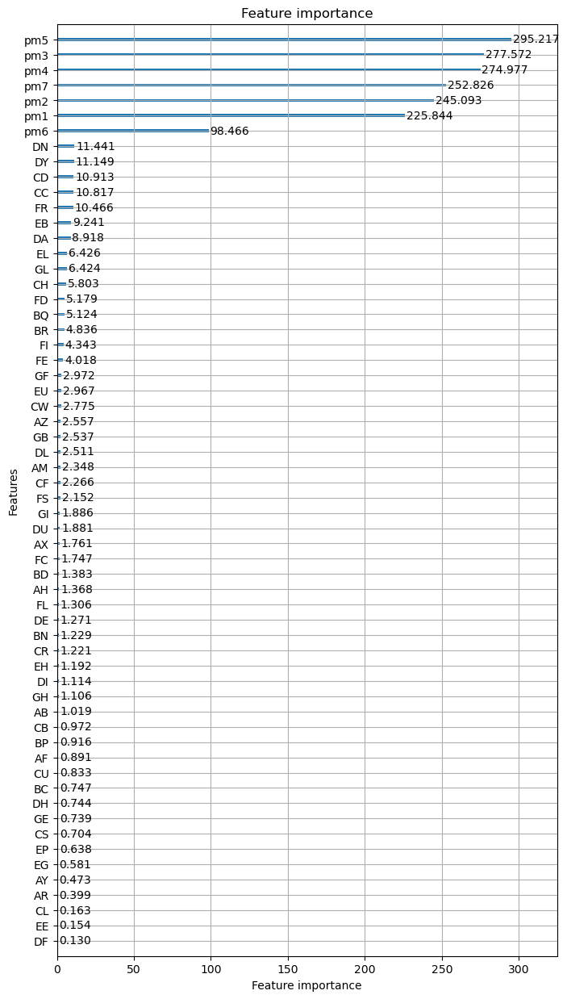

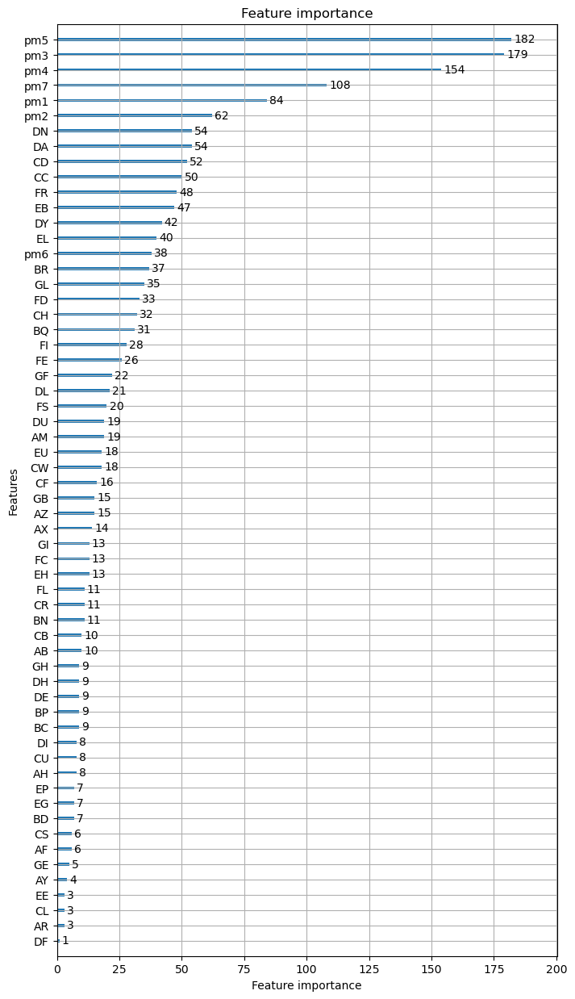

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.55657


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.406211
[300]	valid_0's balanced_logloss: 0.326005
[400]	valid_0's balanced_logloss: 0.273217
[500]	valid_0's balanced_logloss: 0.23787
[600]	valid_0's balanced_logloss: 0.211849
[700]	valid_0's balanced_logloss: 0.197418
[800]	valid_0's balanced_logloss: 0.186302
[900]	valid_0's balanced_logloss: 0.179357
[1000]	valid_0's balanced_logloss: 0.174718
[1100]	valid_0's balanced_logloss: 0.170359
[1200]	valid_0's balanced_logloss: 0.167537
[1300]	valid_0's balanced_logloss: 0.164324
[1400]	valid_0's balanced_logloss: 0.16089


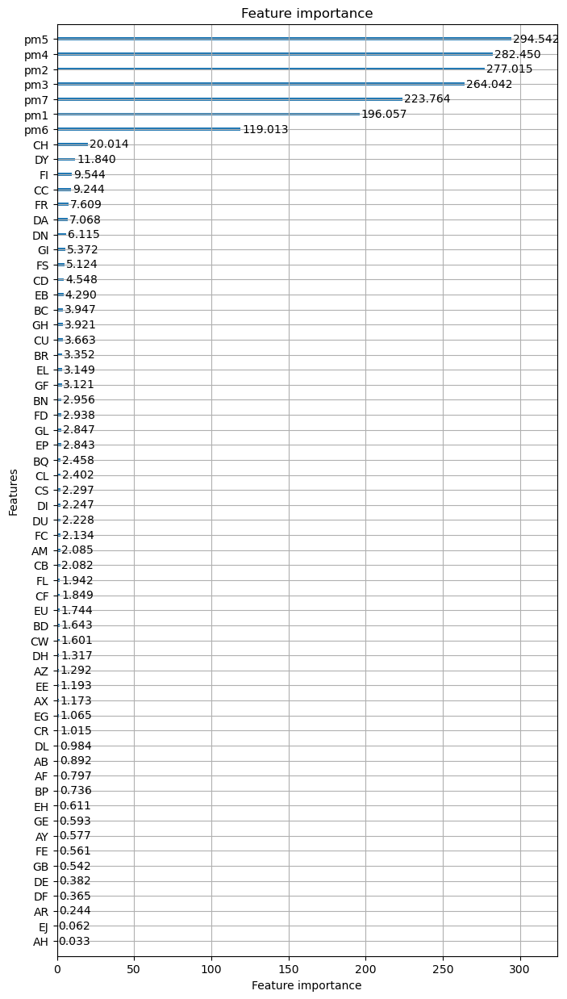

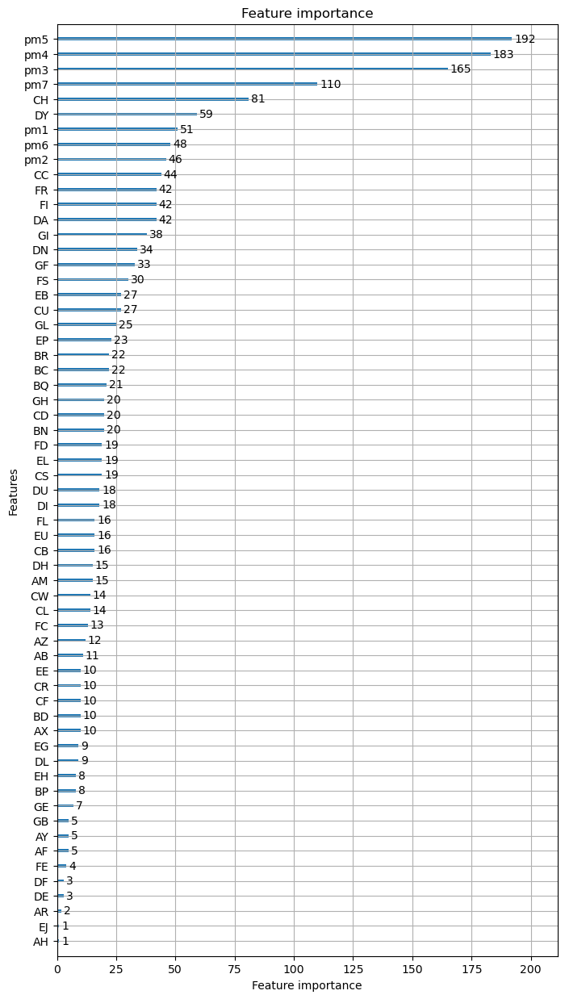

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.557825


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.407142
[300]	valid_0's balanced_logloss: 0.331307
[400]	valid_0's balanced_logloss: 0.289111
[500]	valid_0's balanced_logloss: 0.270082
[600]	valid_0's balanced_logloss: 0.260404
[700]	valid_0's balanced_logloss: 0.254974
[800]	valid_0's balanced_logloss: 0.254676
[900]	valid_0's balanced_logloss: 0.253308
[1000]	valid_0's balanced_logloss: 0.253912
[1100]	valid_0's balanced_logloss: 0.254301
[1200]	valid_0's balanced_logloss: 0.254518
[1300]	valid_0's balanced_logloss: 0.25457
[1400]	valid_0's balanced_logloss: 0.254762


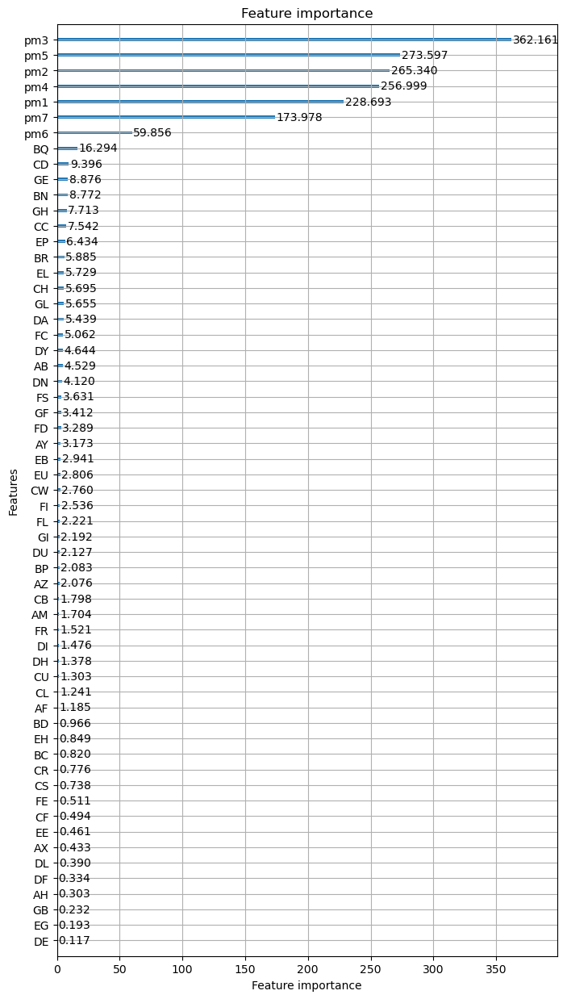

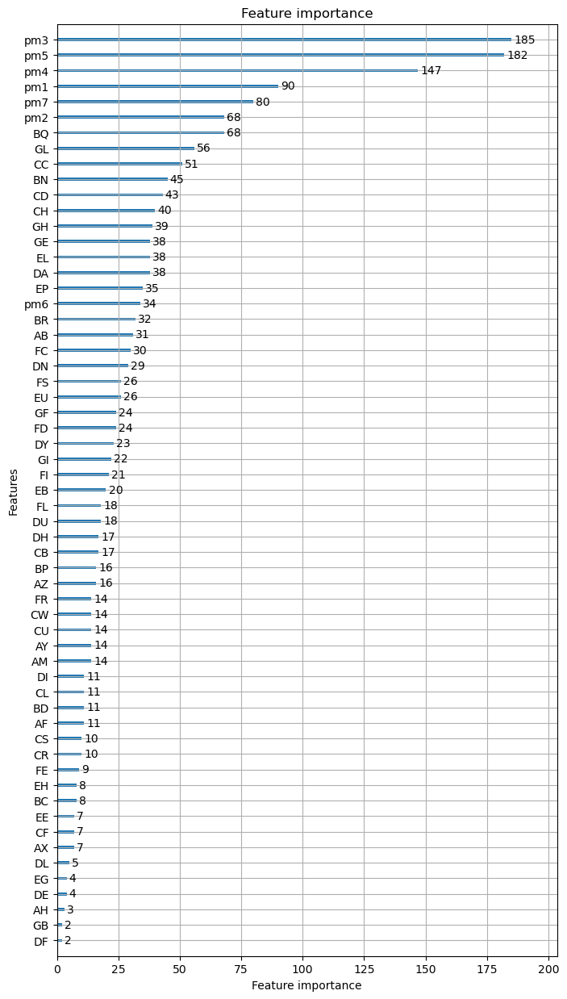

REPEAT NUMBER: 4/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.546434


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.392465
[300]	valid_0's balanced_logloss: 0.320231
[400]	valid_0's balanced_logloss: 0.27692
[500]	valid_0's balanced_logloss: 0.24746
[600]	valid_0's balanced_logloss: 0.231038
[700]	valid_0's balanced_logloss: 0.221474
[800]	valid_0's balanced_logloss: 0.213426
[900]	valid_0's balanced_logloss: 0.210146
[1000]	valid_0's balanced_logloss: 0.205576
[1100]	valid_0's balanced_logloss: 0.202851
[1200]	valid_0's balanced_logloss: 0.198725
[1300]	valid_0's balanced_logloss: 0.196976
[1400]	valid_0's balanced_logloss: 0.193239


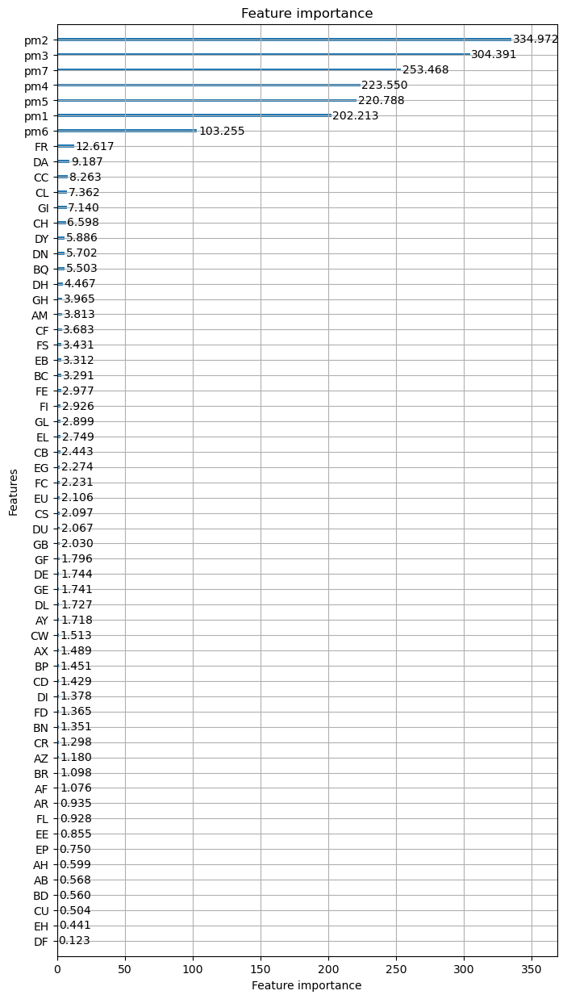

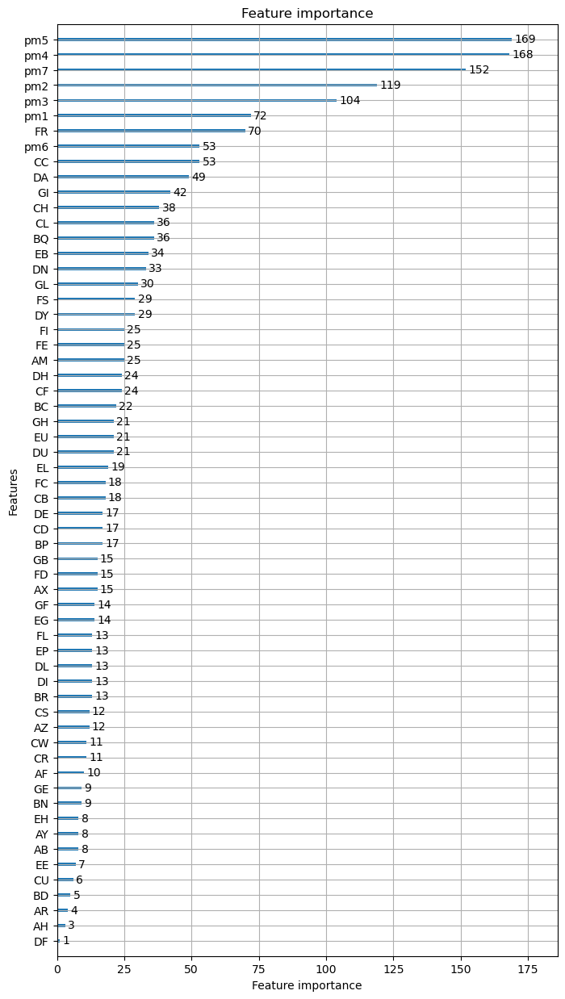

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.595824


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.445805
[300]	valid_0's balanced_logloss: 0.368909
[400]	valid_0's balanced_logloss: 0.313197
[500]	valid_0's balanced_logloss: 0.281963
[600]	valid_0's balanced_logloss: 0.261857
[700]	valid_0's balanced_logloss: 0.24969
[800]	valid_0's balanced_logloss: 0.242233
[900]	valid_0's balanced_logloss: 0.239275
[1000]	valid_0's balanced_logloss: 0.237769
[1100]	valid_0's balanced_logloss: 0.237405
[1200]	valid_0's balanced_logloss: 0.240129
[1300]	valid_0's balanced_logloss: 0.24013
[1400]	valid_0's balanced_logloss: 0.244496


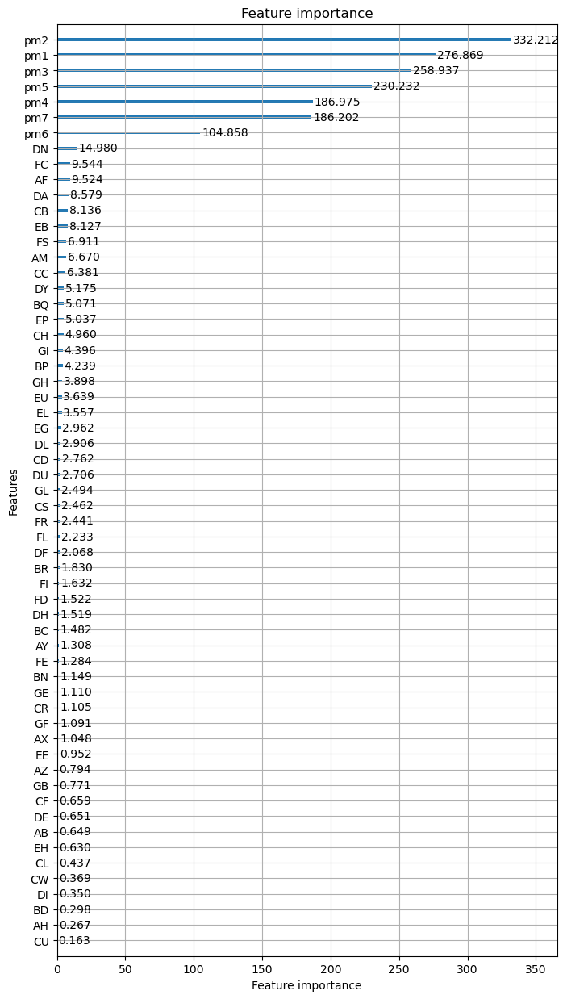

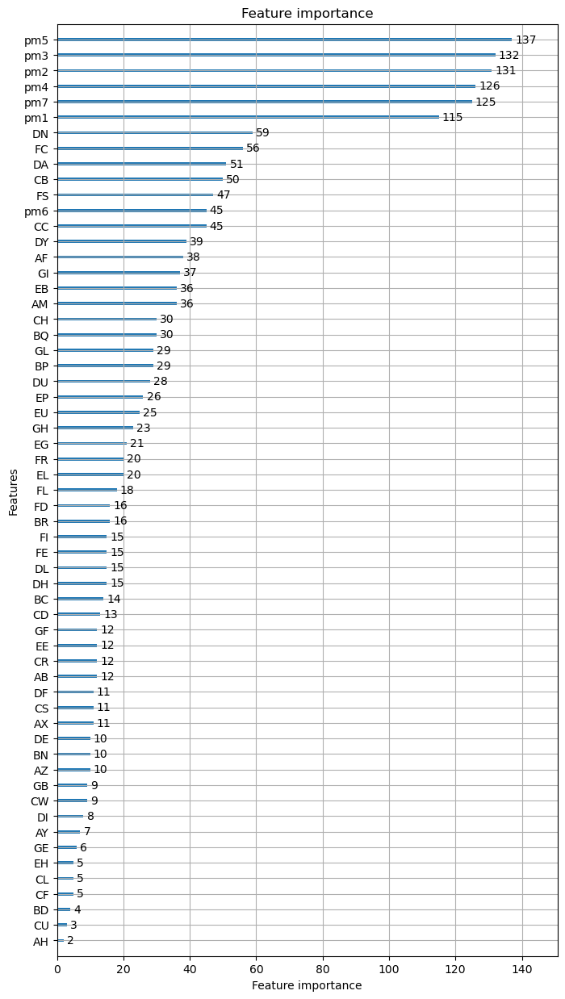

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.568508


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.431772
[300]	valid_0's balanced_logloss: 0.363841
[400]	valid_0's balanced_logloss: 0.322132
[500]	valid_0's balanced_logloss: 0.304589
[600]	valid_0's balanced_logloss: 0.295847
[700]	valid_0's balanced_logloss: 0.294097
[800]	valid_0's balanced_logloss: 0.294996
[900]	valid_0's balanced_logloss: 0.297863
[1000]	valid_0's balanced_logloss: 0.300929
[1100]	valid_0's balanced_logloss: 0.303055
[1200]	valid_0's balanced_logloss: 0.306694
[1300]	valid_0's balanced_logloss: 0.310569
[1400]	valid_0's balanced_logloss: 0.312029


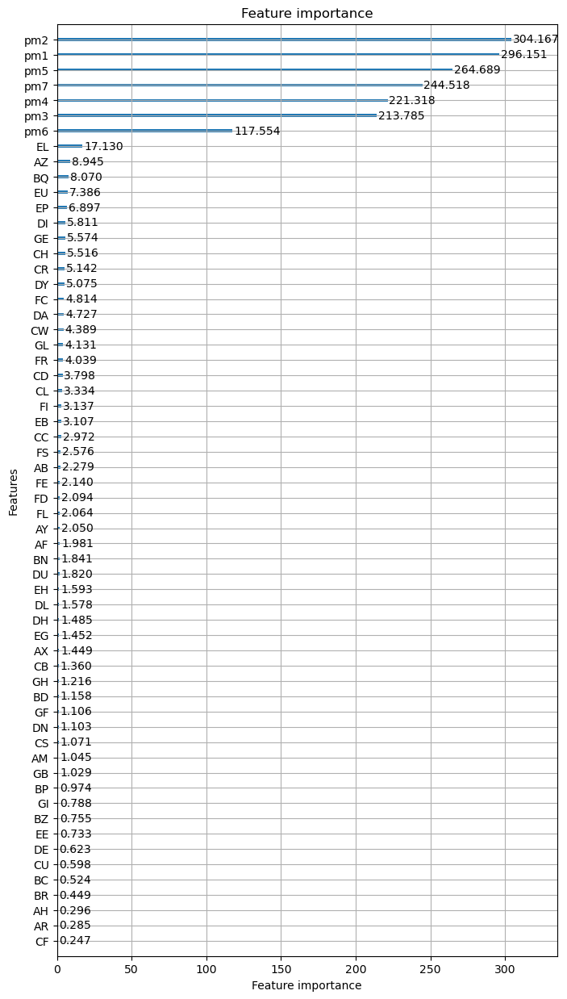

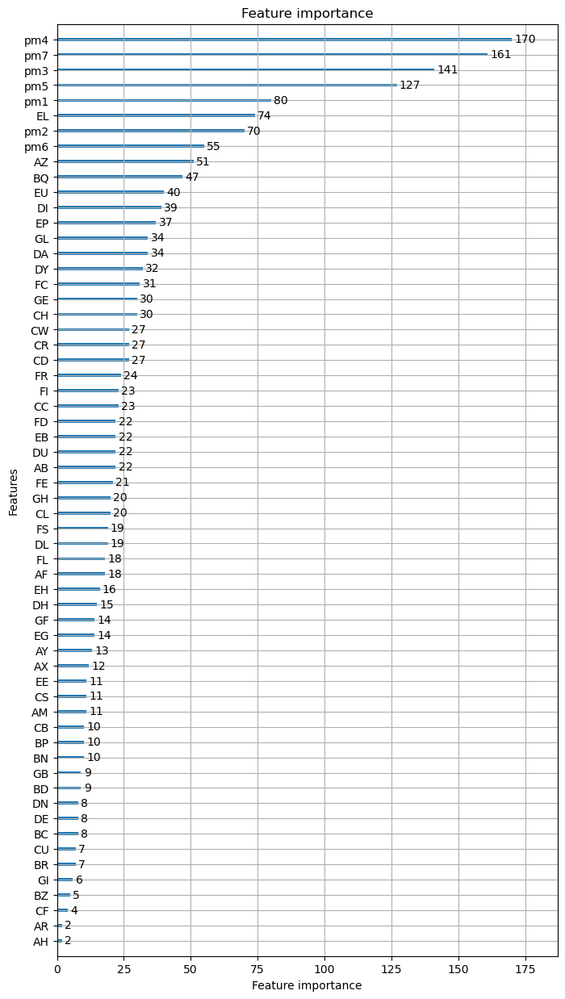

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.536631


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.386495
[300]	valid_0's balanced_logloss: 0.308914
[400]	valid_0's balanced_logloss: 0.264196
[500]	valid_0's balanced_logloss: 0.240114
[600]	valid_0's balanced_logloss: 0.224564
[700]	valid_0's balanced_logloss: 0.217806
[800]	valid_0's balanced_logloss: 0.214591
[900]	valid_0's balanced_logloss: 0.214204
[1000]	valid_0's balanced_logloss: 0.21304
[1100]	valid_0's balanced_logloss: 0.210659
[1200]	valid_0's balanced_logloss: 0.210472
[1300]	valid_0's balanced_logloss: 0.209988
[1400]	valid_0's balanced_logloss: 0.210051


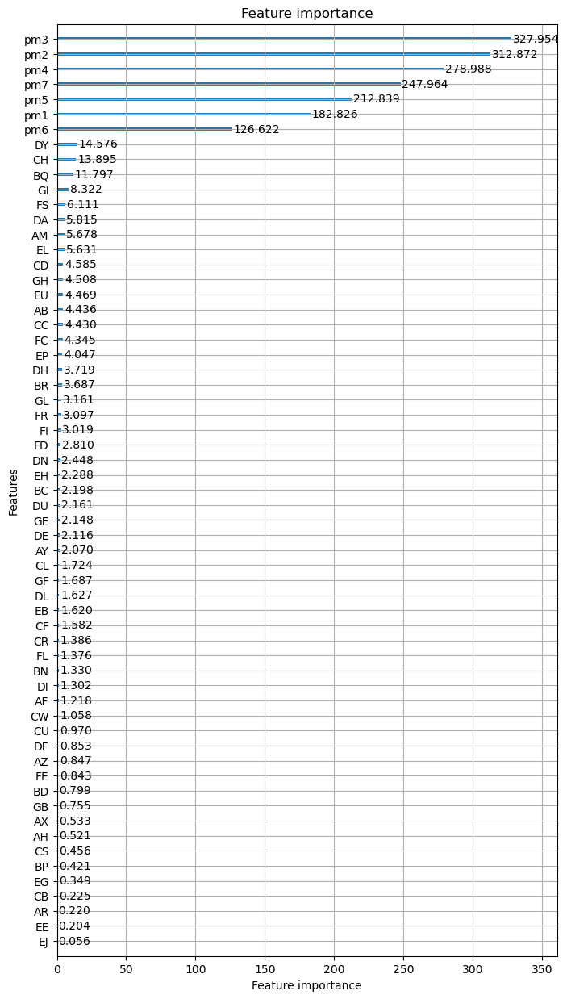

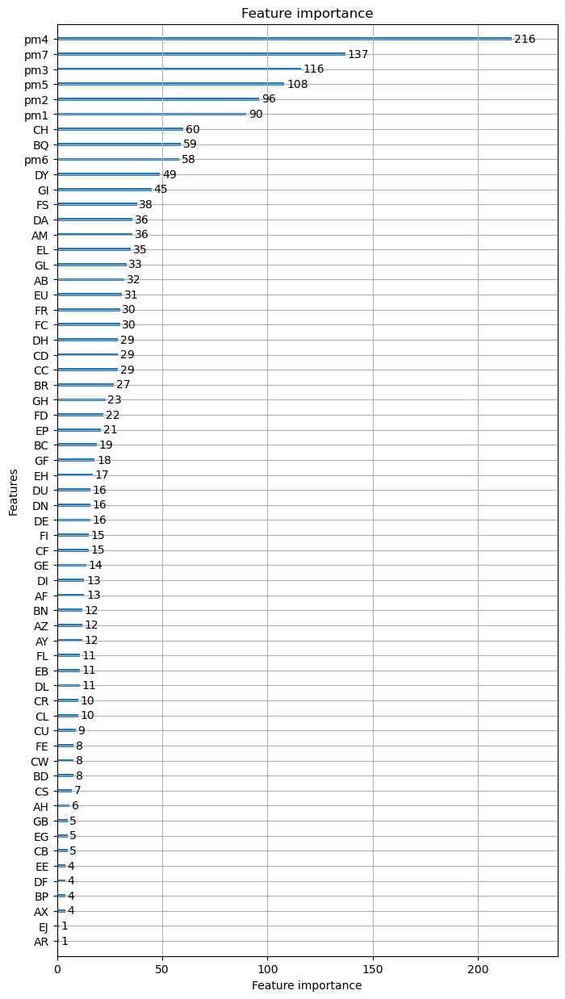

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.540654


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.384387
[300]	valid_0's balanced_logloss: 0.298184
[400]	valid_0's balanced_logloss: 0.245994
[500]	valid_0's balanced_logloss: 0.219898
[600]	valid_0's balanced_logloss: 0.204545
[700]	valid_0's balanced_logloss: 0.194276
[800]	valid_0's balanced_logloss: 0.188744
[900]	valid_0's balanced_logloss: 0.184792
[1000]	valid_0's balanced_logloss: 0.1819
[1100]	valid_0's balanced_logloss: 0.178508
[1200]	valid_0's balanced_logloss: 0.177524
[1300]	valid_0's balanced_logloss: 0.175683
[1400]	valid_0's balanced_logloss: 0.172481


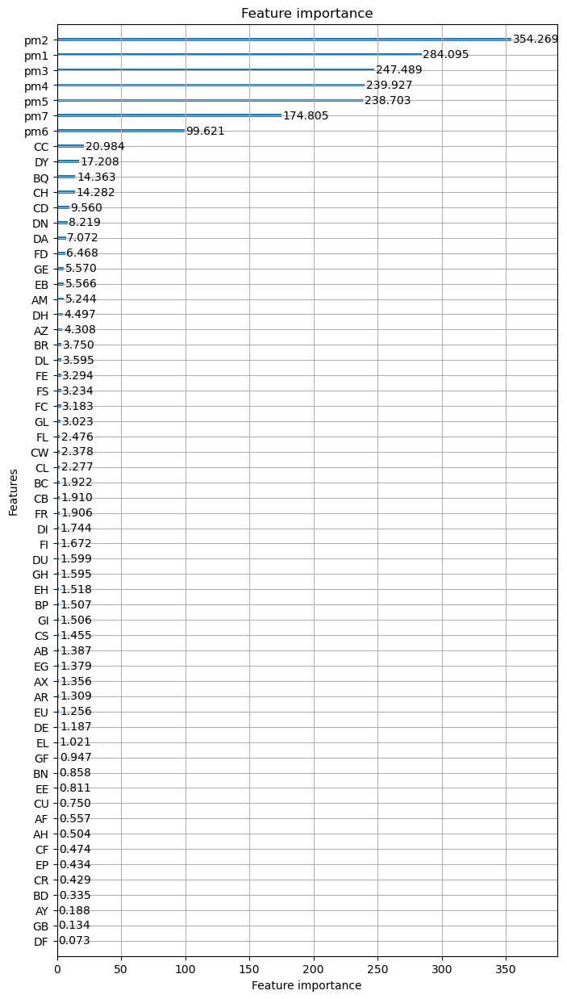

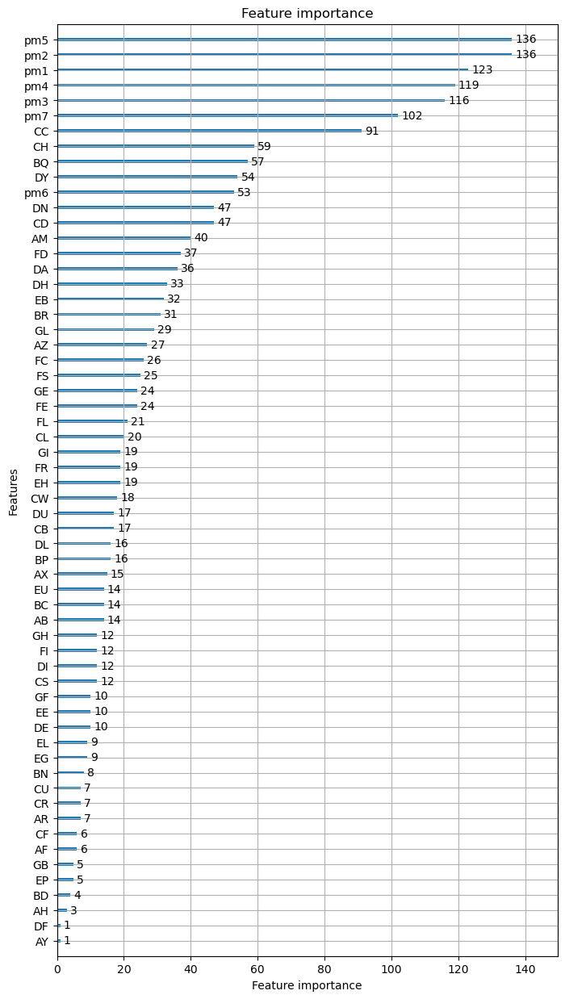

REPEAT NUMBER: 5/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.543275


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.392536
[300]	valid_0's balanced_logloss: 0.320726
[400]	valid_0's balanced_logloss: 0.279666
[500]	valid_0's balanced_logloss: 0.257474
[600]	valid_0's balanced_logloss: 0.244057
[700]	valid_0's balanced_logloss: 0.237961
[800]	valid_0's balanced_logloss: 0.234945
[900]	valid_0's balanced_logloss: 0.234826
[1000]	valid_0's balanced_logloss: 0.233466
[1100]	valid_0's balanced_logloss: 0.231424
[1200]	valid_0's balanced_logloss: 0.229988
[1300]	valid_0's balanced_logloss: 0.233182
[1400]	valid_0's balanced_logloss: 0.23002


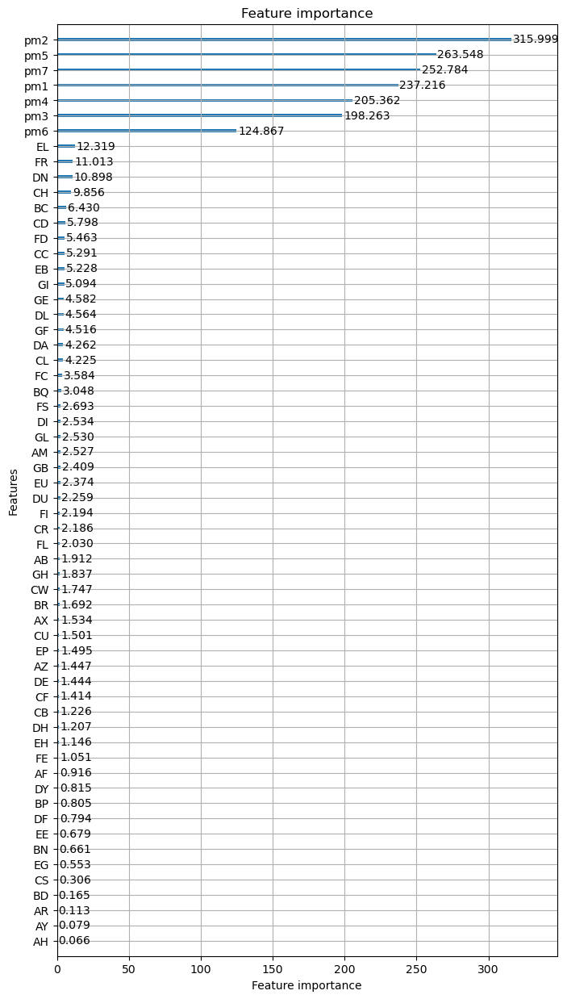

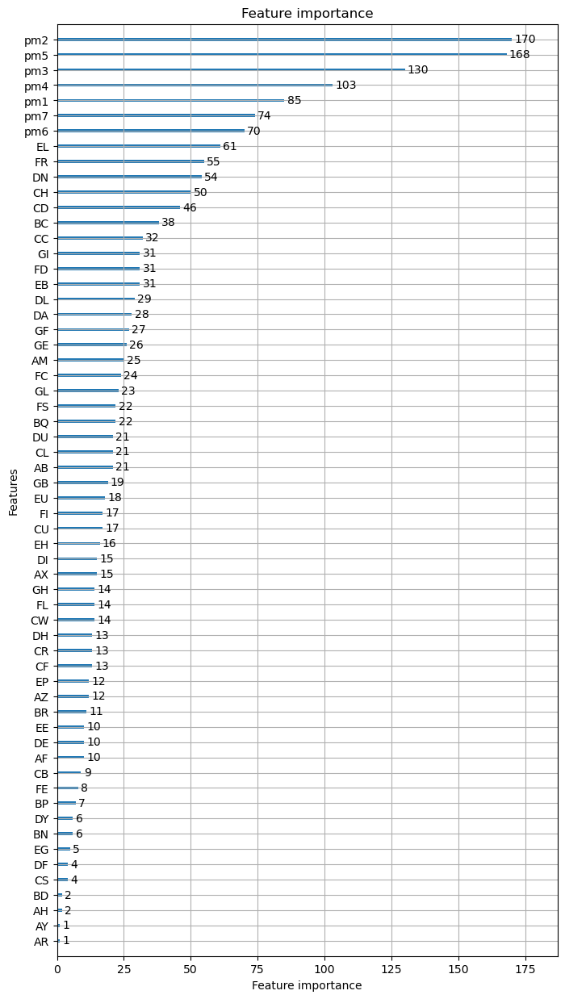

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.528152


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.366936
[300]	valid_0's balanced_logloss: 0.289669
[400]	valid_0's balanced_logloss: 0.238228
[500]	valid_0's balanced_logloss: 0.210674
[600]	valid_0's balanced_logloss: 0.19679
[700]	valid_0's balanced_logloss: 0.187783
[800]	valid_0's balanced_logloss: 0.181009
[900]	valid_0's balanced_logloss: 0.178849
[1000]	valid_0's balanced_logloss: 0.176329
[1100]	valid_0's balanced_logloss: 0.176329
[1200]	valid_0's balanced_logloss: 0.175497
[1300]	valid_0's balanced_logloss: 0.175631
[1400]	valid_0's balanced_logloss: 0.175911


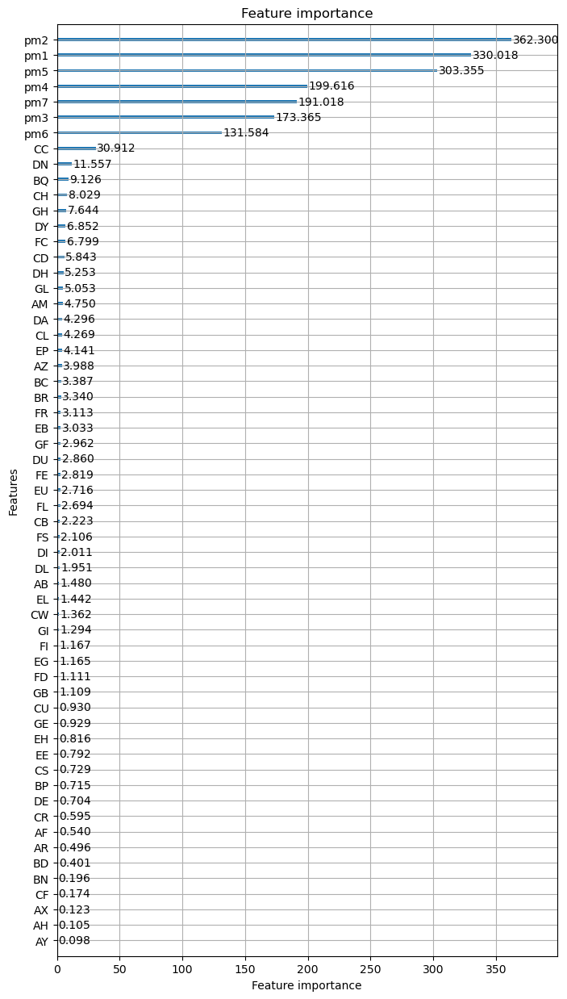

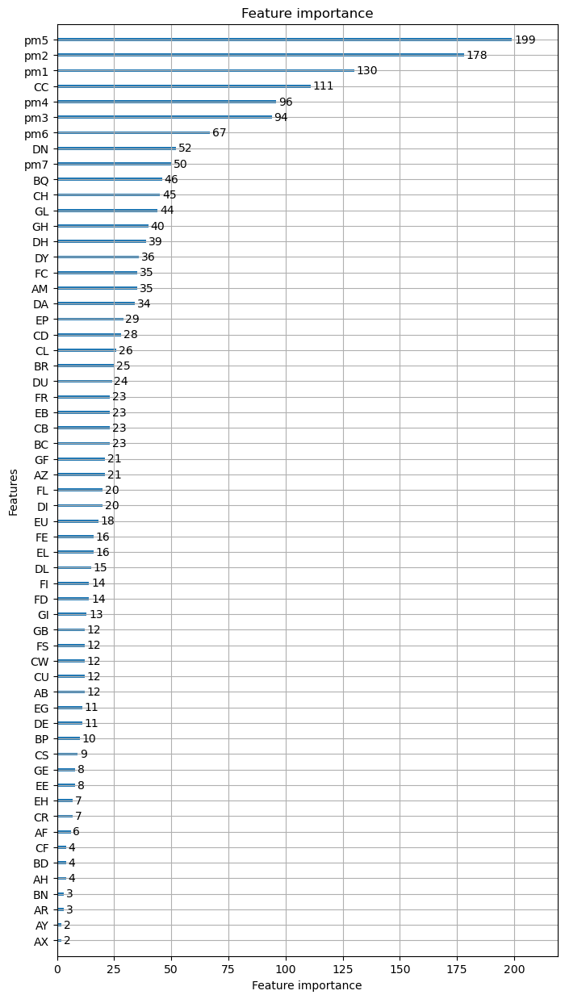

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.542928


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.384385
[300]	valid_0's balanced_logloss: 0.303325
[400]	valid_0's balanced_logloss: 0.25199
[500]	valid_0's balanced_logloss: 0.225687
[600]	valid_0's balanced_logloss: 0.208663
[700]	valid_0's balanced_logloss: 0.199926
[800]	valid_0's balanced_logloss: 0.194546
[900]	valid_0's balanced_logloss: 0.192177
[1000]	valid_0's balanced_logloss: 0.191394
[1100]	valid_0's balanced_logloss: 0.192834
[1200]	valid_0's balanced_logloss: 0.194601
[1300]	valid_0's balanced_logloss: 0.197629
[1400]	valid_0's balanced_logloss: 0.19919


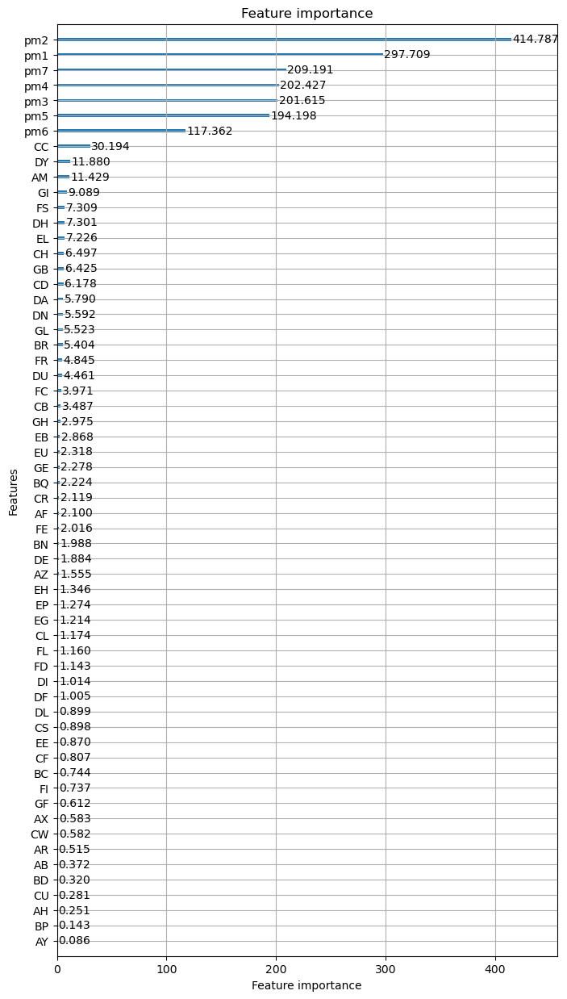

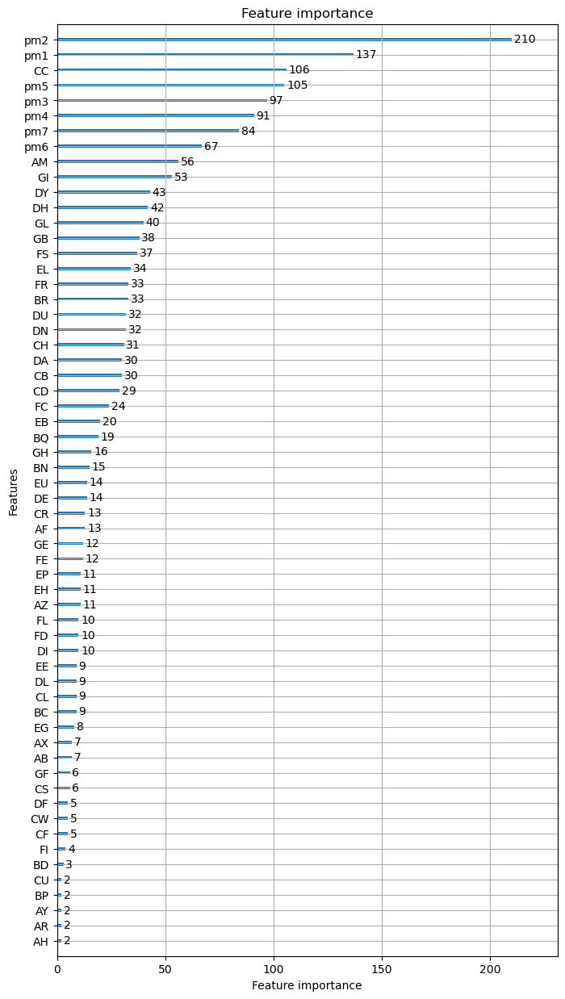

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.526052


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.371158
[300]	valid_0's balanced_logloss: 0.29208
[400]	valid_0's balanced_logloss: 0.233026
[500]	valid_0's balanced_logloss: 0.201317
[600]	valid_0's balanced_logloss: 0.18172
[700]	valid_0's balanced_logloss: 0.167689
[800]	valid_0's balanced_logloss: 0.15965
[900]	valid_0's balanced_logloss: 0.155429
[1000]	valid_0's balanced_logloss: 0.152591
[1100]	valid_0's balanced_logloss: 0.150418
[1200]	valid_0's balanced_logloss: 0.148751
[1300]	valid_0's balanced_logloss: 0.148496
[1400]	valid_0's balanced_logloss: 0.149006


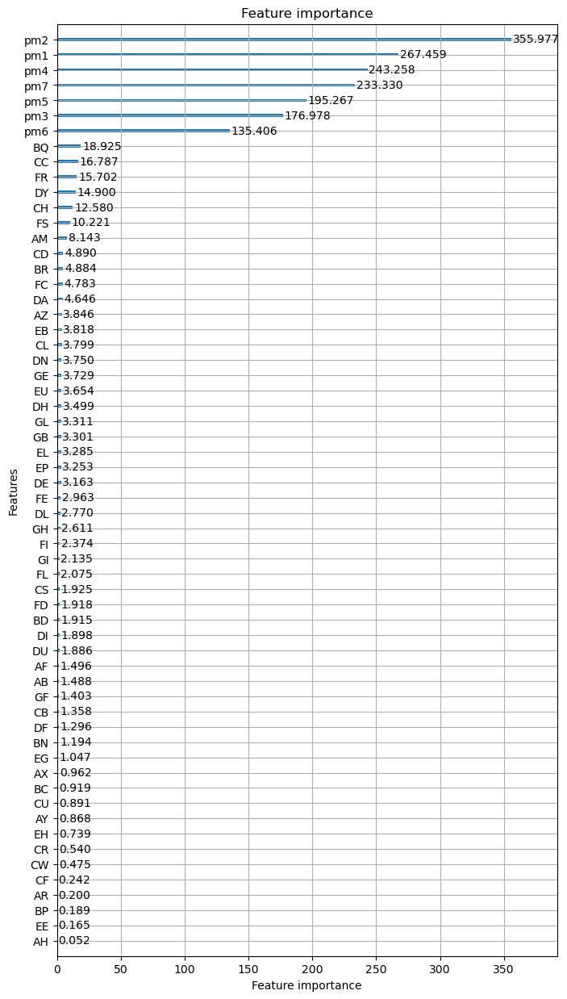

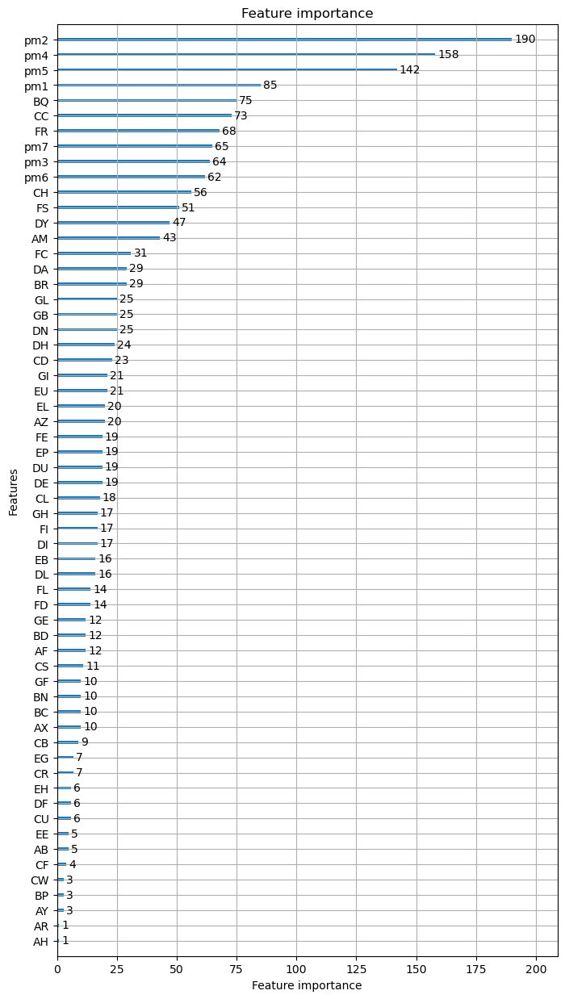

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.627291


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.502725
[300]	valid_0's balanced_logloss: 0.447213
[400]	valid_0's balanced_logloss: 0.422013
[500]	valid_0's balanced_logloss: 0.410686
[600]	valid_0's balanced_logloss: 0.409094
[700]	valid_0's balanced_logloss: 0.410944
[800]	valid_0's balanced_logloss: 0.413654
[900]	valid_0's balanced_logloss: 0.417005
[1000]	valid_0's balanced_logloss: 0.424271
[1100]	valid_0's balanced_logloss: 0.433031
[1200]	valid_0's balanced_logloss: 0.44271
[1300]	valid_0's balanced_logloss: 0.452937
[1400]	valid_0's balanced_logloss: 0.462836


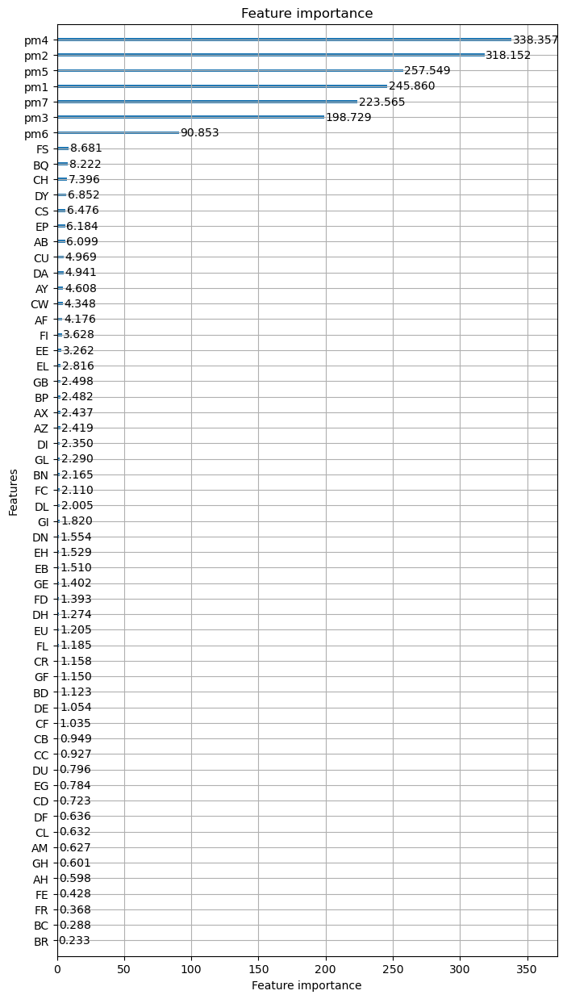

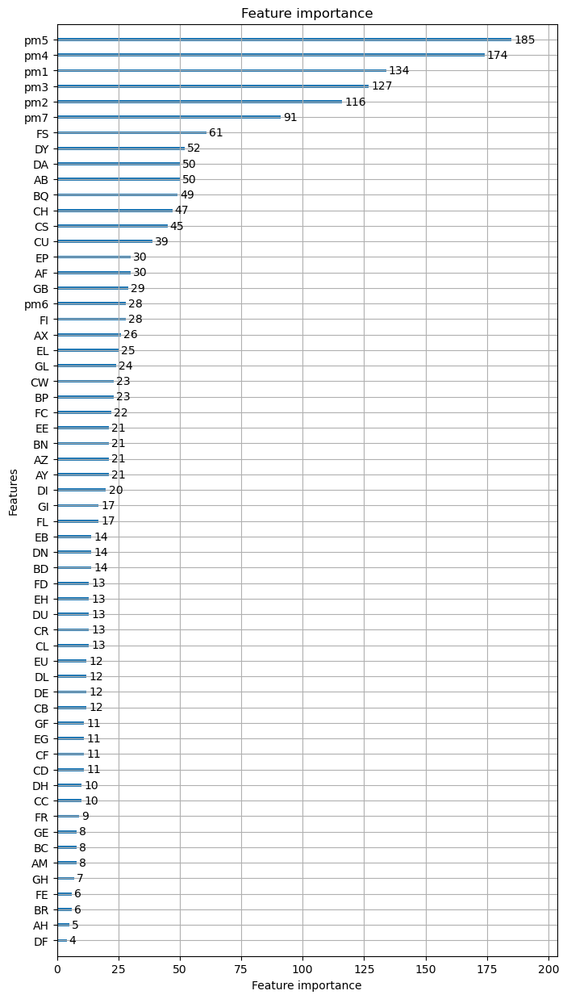

REPEAT NUMBER: 6/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.538125


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.372757
[300]	valid_0's balanced_logloss: 0.285945
[400]	valid_0's balanced_logloss: 0.234985
[500]	valid_0's balanced_logloss: 0.20516
[600]	valid_0's balanced_logloss: 0.185835
[700]	valid_0's balanced_logloss: 0.175511
[800]	valid_0's balanced_logloss: 0.166705
[900]	valid_0's balanced_logloss: 0.162157
[1000]	valid_0's balanced_logloss: 0.159168
[1100]	valid_0's balanced_logloss: 0.154779
[1200]	valid_0's balanced_logloss: 0.151625
[1300]	valid_0's balanced_logloss: 0.150477
[1400]	valid_0's balanced_logloss: 0.148489


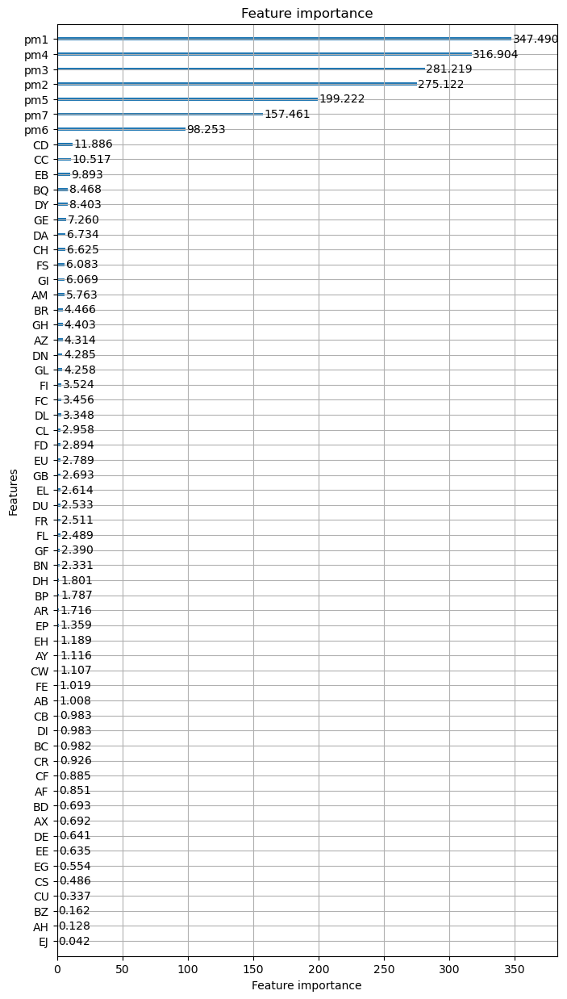

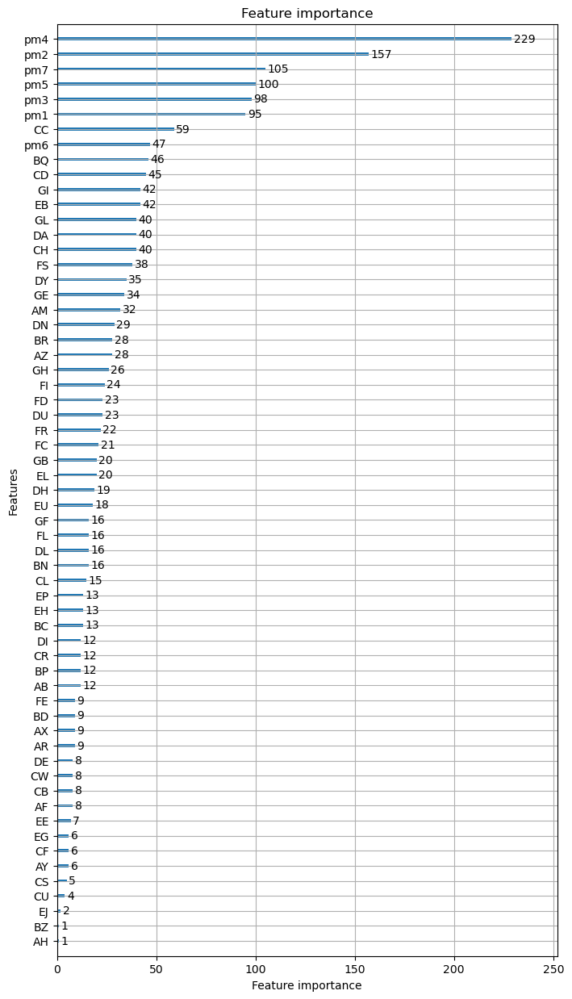

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.541172


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.381413
[300]	valid_0's balanced_logloss: 0.299685
[400]	valid_0's balanced_logloss: 0.248685
[500]	valid_0's balanced_logloss: 0.217542
[600]	valid_0's balanced_logloss: 0.193992
[700]	valid_0's balanced_logloss: 0.182899
[800]	valid_0's balanced_logloss: 0.175607
[900]	valid_0's balanced_logloss: 0.169988
[1000]	valid_0's balanced_logloss: 0.163048
[1100]	valid_0's balanced_logloss: 0.159556
[1200]	valid_0's balanced_logloss: 0.157872
[1300]	valid_0's balanced_logloss: 0.155656
[1400]	valid_0's balanced_logloss: 0.154177


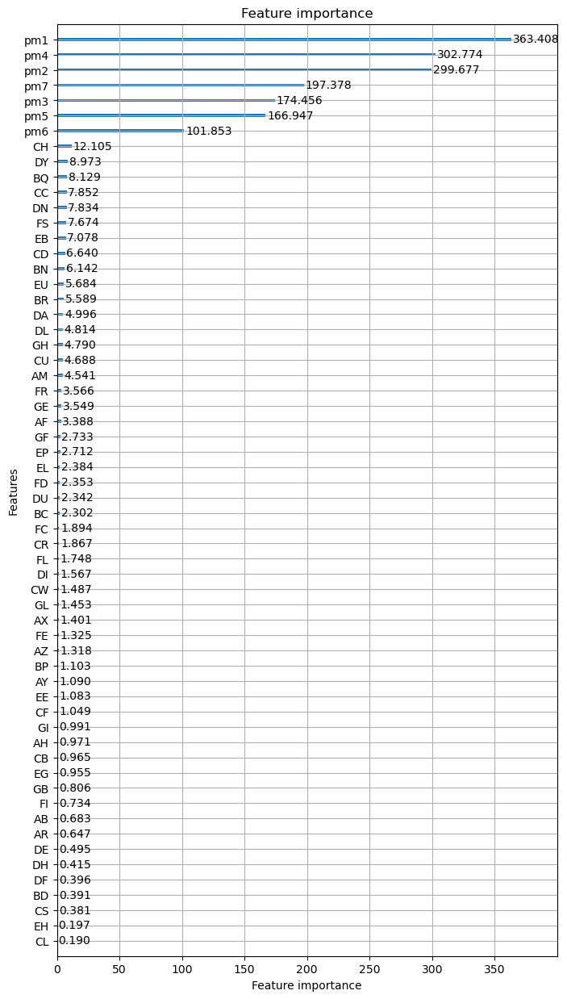

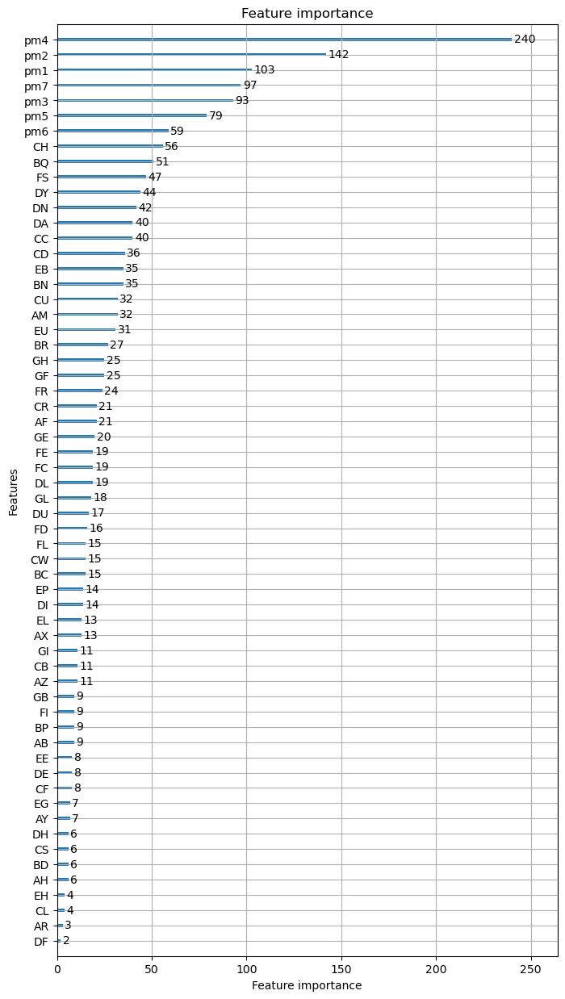

training model for fold: 3/5


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[100]	valid_0's balanced_logloss: 0.54876
[200]	valid_0's balanced_logloss: 0.399195
[300]	valid_0's balanced_logloss: 0.324954
[400]	valid_0's balanced_logloss: 0.280767
[500]	valid_0's balanced_logloss: 0.25783
[600]	valid_0's balanced_logloss: 0.245139
[700]	valid_0's balanced_logloss: 0.237801
[800]	valid_0's balanced_logloss: 0.232573
[900]	valid_0's balanced_logloss: 0.230145
[1000]	valid_0's balanced_logloss: 0.2293
[1100]	valid_0's balanced_logloss: 0.227705
[1200]	valid_0's balanced_logloss: 0.228251
[1300]	valid_0's balanced_logloss: 0.228231
[1400]	valid_0's balanced_logloss: 0.228246


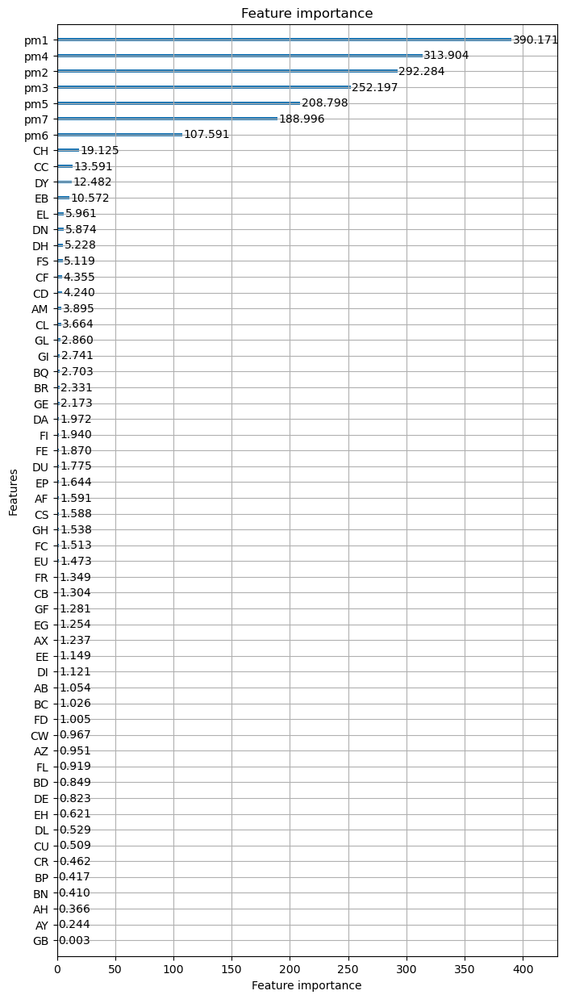

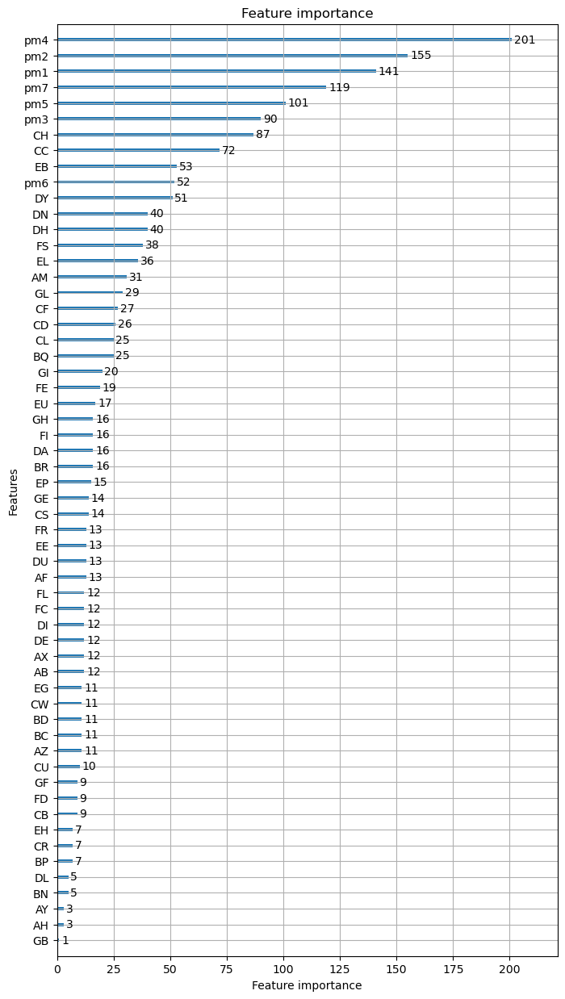

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.575219


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.424862
[300]	valid_0's balanced_logloss: 0.348485
[400]	valid_0's balanced_logloss: 0.304937
[500]	valid_0's balanced_logloss: 0.286183
[600]	valid_0's balanced_logloss: 0.27577
[700]	valid_0's balanced_logloss: 0.273999
[800]	valid_0's balanced_logloss: 0.275281
[900]	valid_0's balanced_logloss: 0.279593
[1000]	valid_0's balanced_logloss: 0.286138
[1100]	valid_0's balanced_logloss: 0.29228
[1200]	valid_0's balanced_logloss: 0.297524
[1300]	valid_0's balanced_logloss: 0.303724
[1400]	valid_0's balanced_logloss: 0.312441


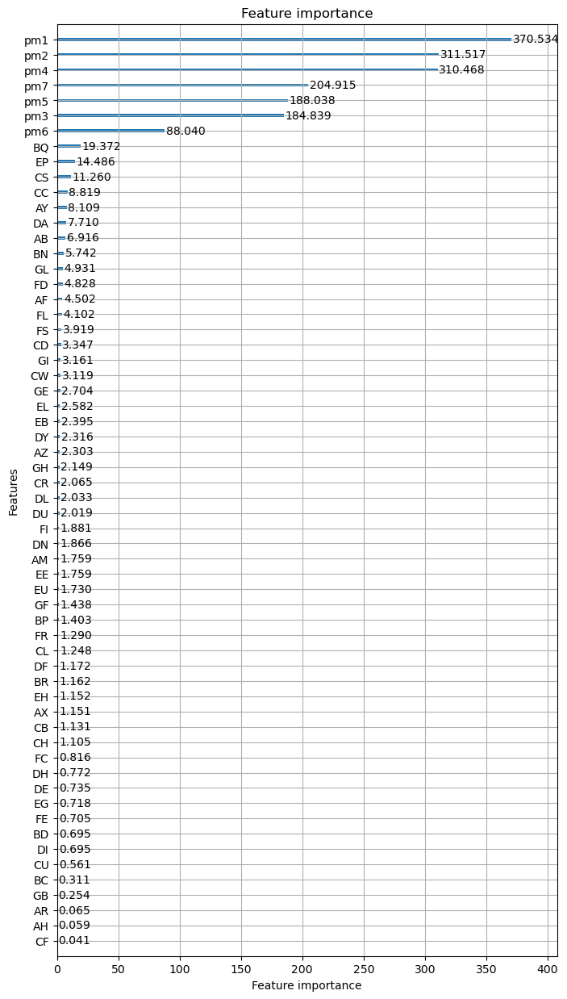

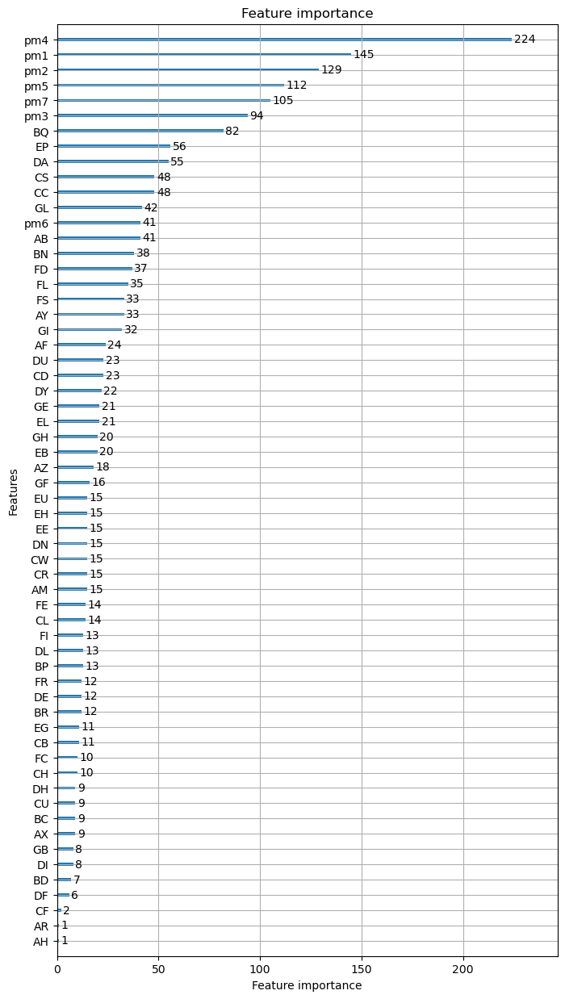

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.549872


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.401438
[300]	valid_0's balanced_logloss: 0.326362
[400]	valid_0's balanced_logloss: 0.279083
[500]	valid_0's balanced_logloss: 0.256257
[600]	valid_0's balanced_logloss: 0.239601
[700]	valid_0's balanced_logloss: 0.232269
[800]	valid_0's balanced_logloss: 0.226272
[900]	valid_0's balanced_logloss: 0.224364
[1000]	valid_0's balanced_logloss: 0.222895
[1100]	valid_0's balanced_logloss: 0.223012
[1200]	valid_0's balanced_logloss: 0.225672
[1300]	valid_0's balanced_logloss: 0.226943
[1400]	valid_0's balanced_logloss: 0.229495


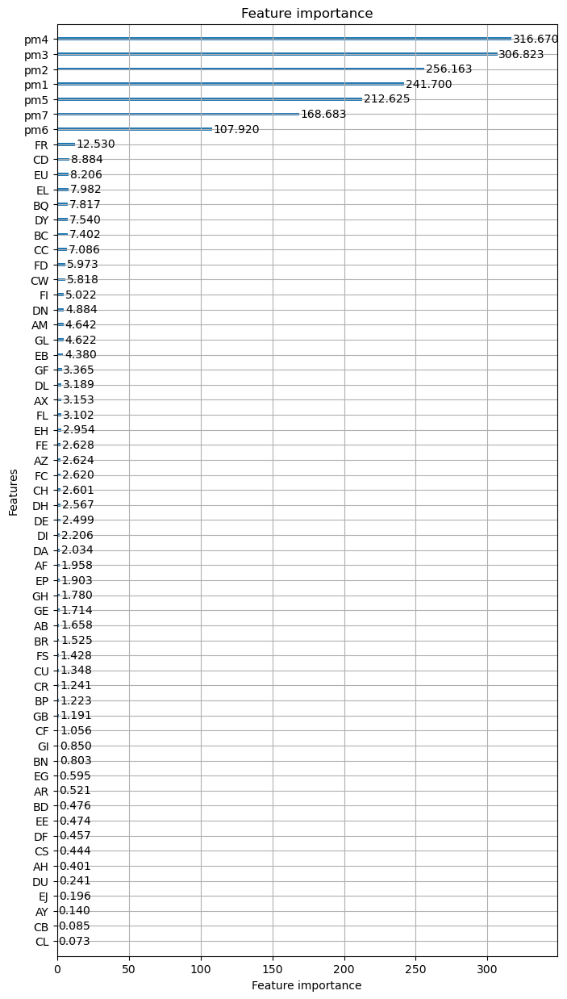

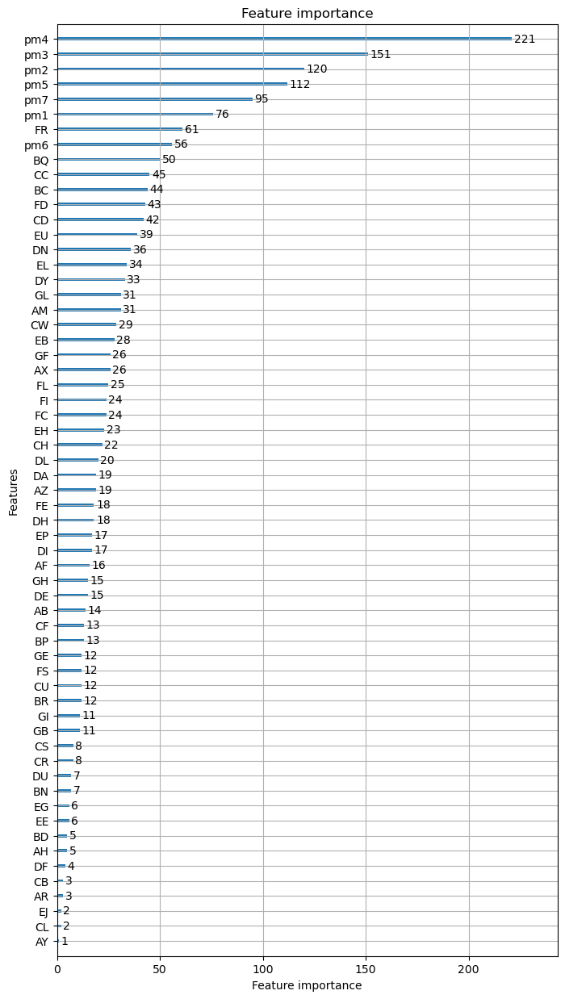

REPEAT NUMBER: 7/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.616574


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.485149
[300]	valid_0's balanced_logloss: 0.420345
[400]	valid_0's balanced_logloss: 0.386122
[500]	valid_0's balanced_logloss: 0.36768
[600]	valid_0's balanced_logloss: 0.359354
[700]	valid_0's balanced_logloss: 0.35594
[800]	valid_0's balanced_logloss: 0.355437
[900]	valid_0's balanced_logloss: 0.354783
[1000]	valid_0's balanced_logloss: 0.358628
[1100]	valid_0's balanced_logloss: 0.363066
[1200]	valid_0's balanced_logloss: 0.368115
[1300]	valid_0's balanced_logloss: 0.371553
[1400]	valid_0's balanced_logloss: 0.375967


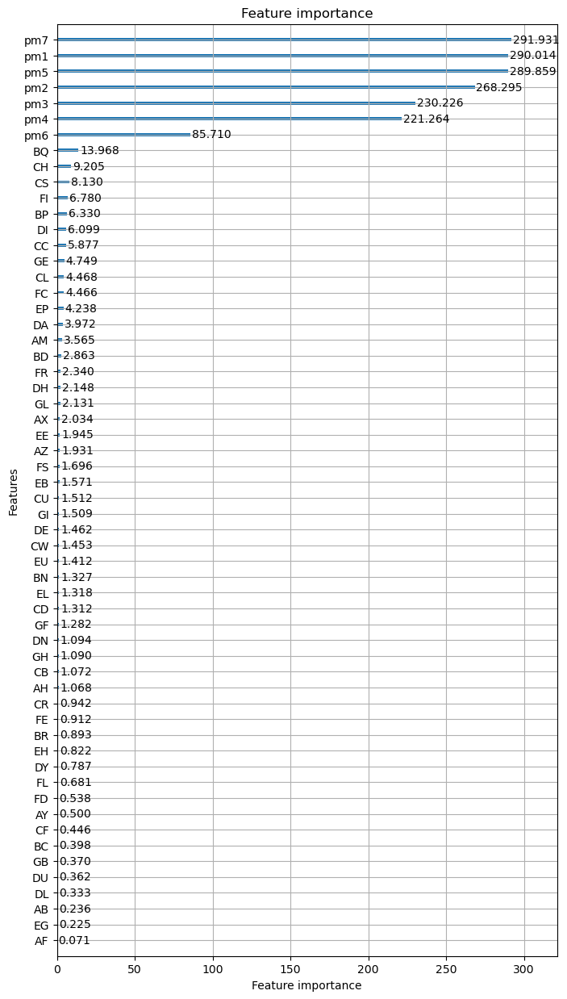

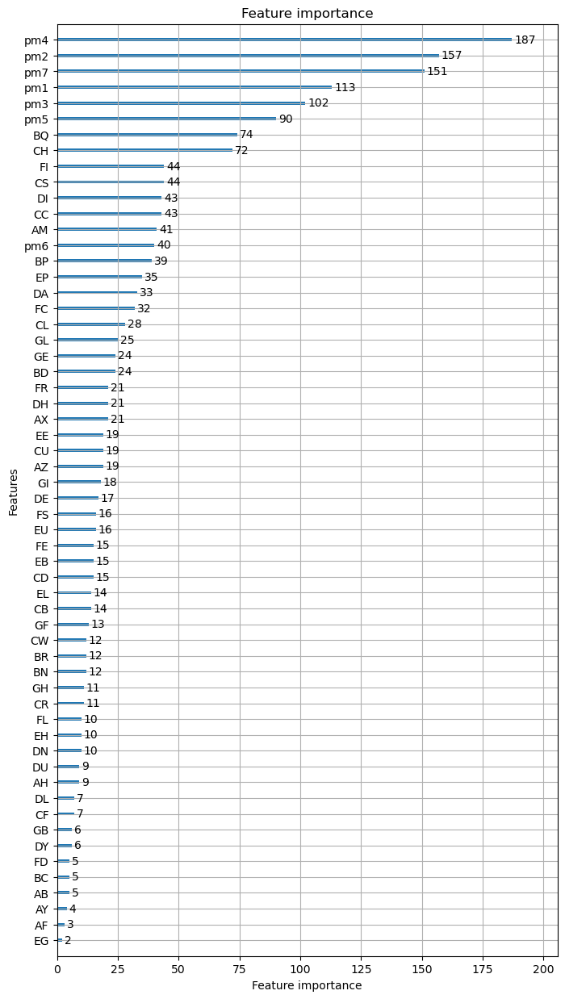

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.545853


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.385647
[300]	valid_0's balanced_logloss: 0.299237
[400]	valid_0's balanced_logloss: 0.249538
[500]	valid_0's balanced_logloss: 0.221132
[600]	valid_0's balanced_logloss: 0.2038
[700]	valid_0's balanced_logloss: 0.195075
[800]	valid_0's balanced_logloss: 0.187329
[900]	valid_0's balanced_logloss: 0.184624
[1000]	valid_0's balanced_logloss: 0.182373
[1100]	valid_0's balanced_logloss: 0.181433
[1200]	valid_0's balanced_logloss: 0.181999
[1300]	valid_0's balanced_logloss: 0.182155
[1400]	valid_0's balanced_logloss: 0.18314


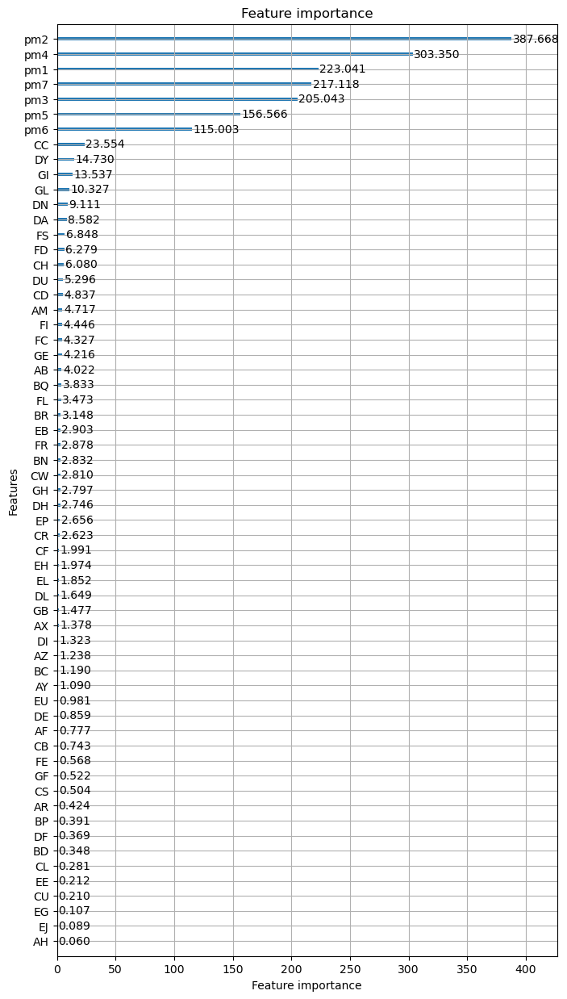

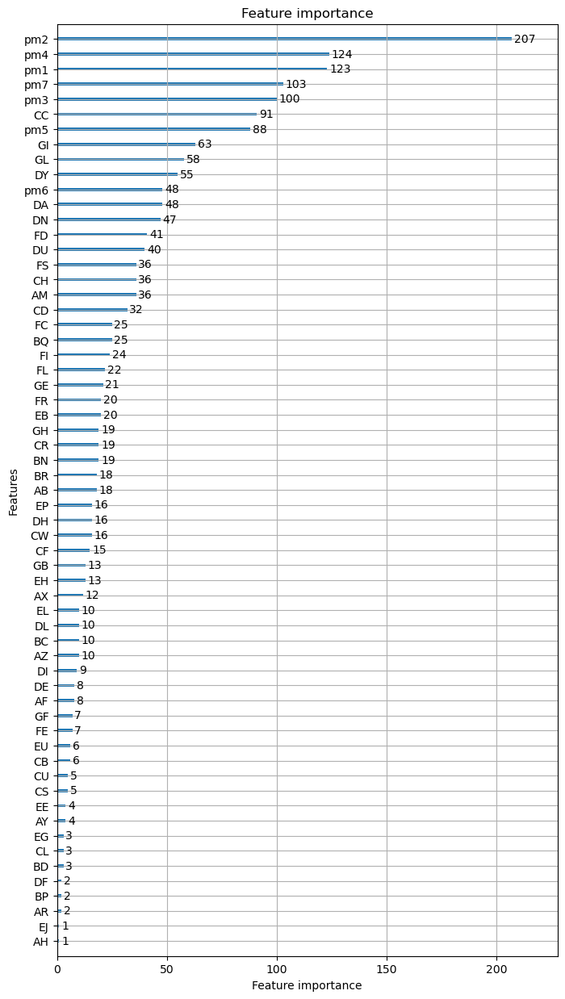

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.515546


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.358596
[300]	valid_0's balanced_logloss: 0.281103
[400]	valid_0's balanced_logloss: 0.232029
[500]	valid_0's balanced_logloss: 0.208638
[600]	valid_0's balanced_logloss: 0.192539
[700]	valid_0's balanced_logloss: 0.186548
[800]	valid_0's balanced_logloss: 0.180414
[900]	valid_0's balanced_logloss: 0.177011
[1000]	valid_0's balanced_logloss: 0.172911
[1100]	valid_0's balanced_logloss: 0.167141
[1200]	valid_0's balanced_logloss: 0.164268
[1300]	valid_0's balanced_logloss: 0.162891
[1400]	valid_0's balanced_logloss: 0.160725


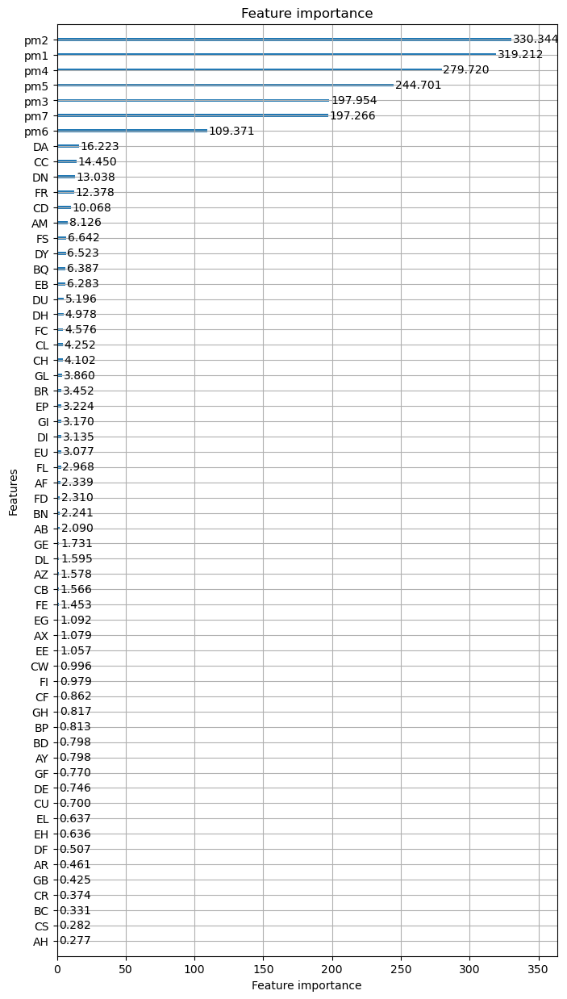

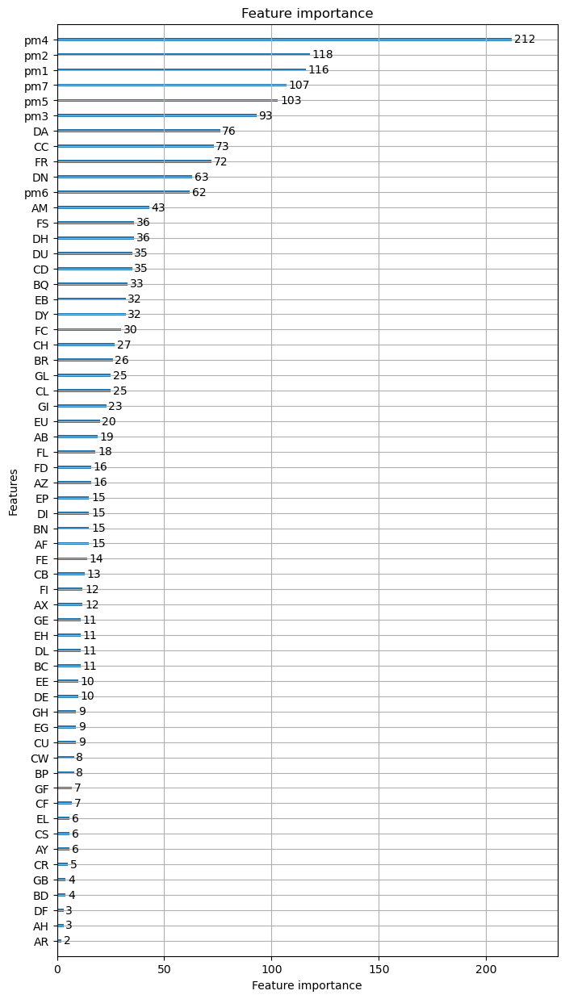

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.564965


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.421376
[300]	valid_0's balanced_logloss: 0.345227
[400]	valid_0's balanced_logloss: 0.300337
[500]	valid_0's balanced_logloss: 0.275108
[600]	valid_0's balanced_logloss: 0.258859
[700]	valid_0's balanced_logloss: 0.250615
[800]	valid_0's balanced_logloss: 0.244628
[900]	valid_0's balanced_logloss: 0.240249
[1000]	valid_0's balanced_logloss: 0.240146
[1100]	valid_0's balanced_logloss: 0.239909
[1200]	valid_0's balanced_logloss: 0.240033
[1300]	valid_0's balanced_logloss: 0.240267
[1400]	valid_0's balanced_logloss: 0.242473


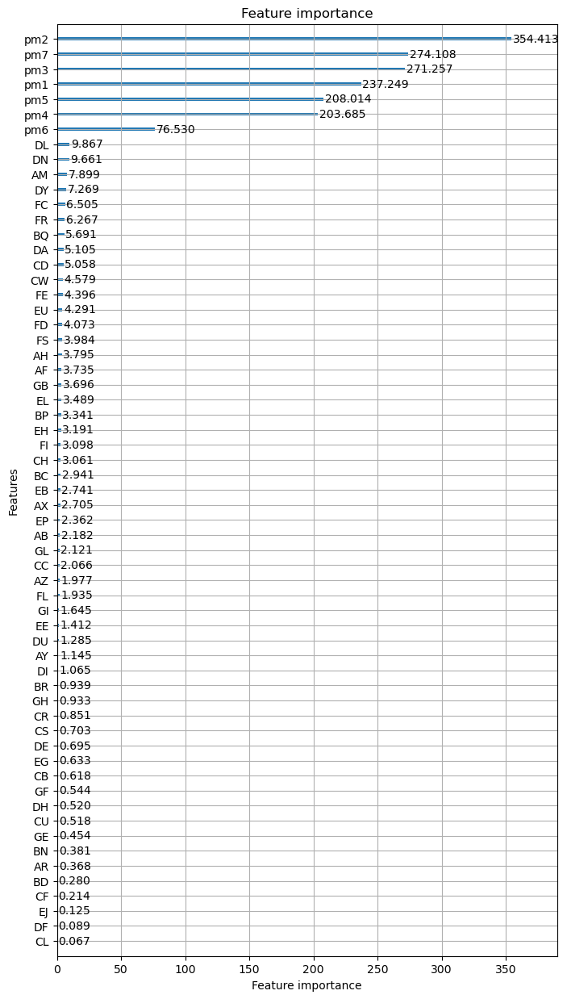

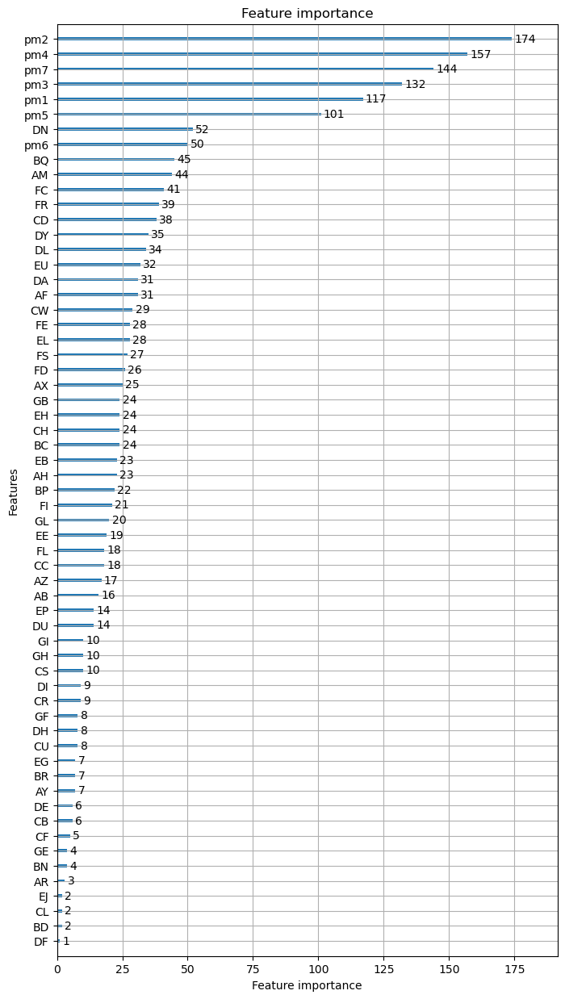

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.518406


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.35469
[300]	valid_0's balanced_logloss: 0.269024
[400]	valid_0's balanced_logloss: 0.214576
[500]	valid_0's balanced_logloss: 0.184563
[600]	valid_0's balanced_logloss: 0.164897
[700]	valid_0's balanced_logloss: 0.156155
[800]	valid_0's balanced_logloss: 0.150395
[900]	valid_0's balanced_logloss: 0.147592
[1000]	valid_0's balanced_logloss: 0.145012
[1100]	valid_0's balanced_logloss: 0.143577
[1200]	valid_0's balanced_logloss: 0.141985
[1300]	valid_0's balanced_logloss: 0.141276
[1400]	valid_0's balanced_logloss: 0.139546


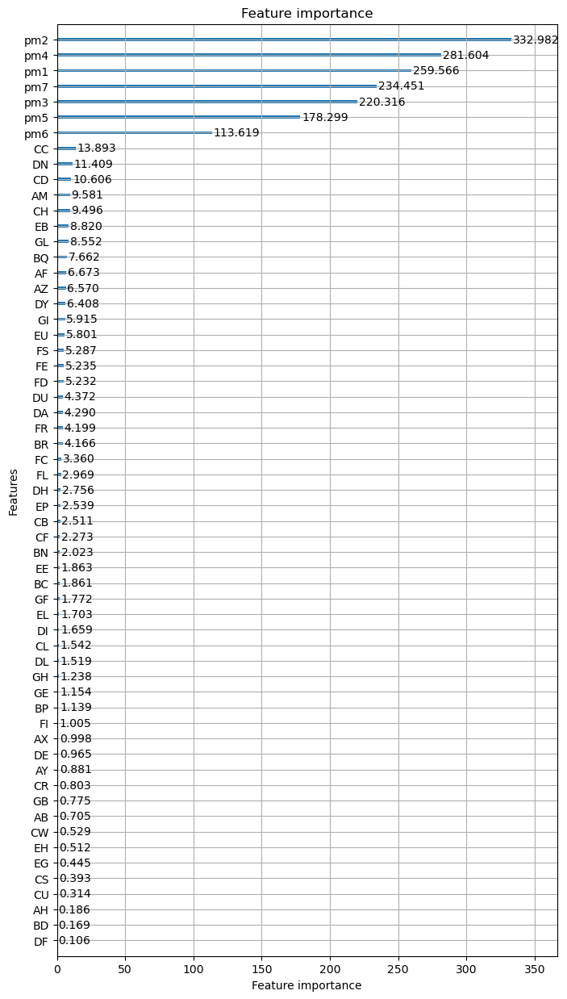

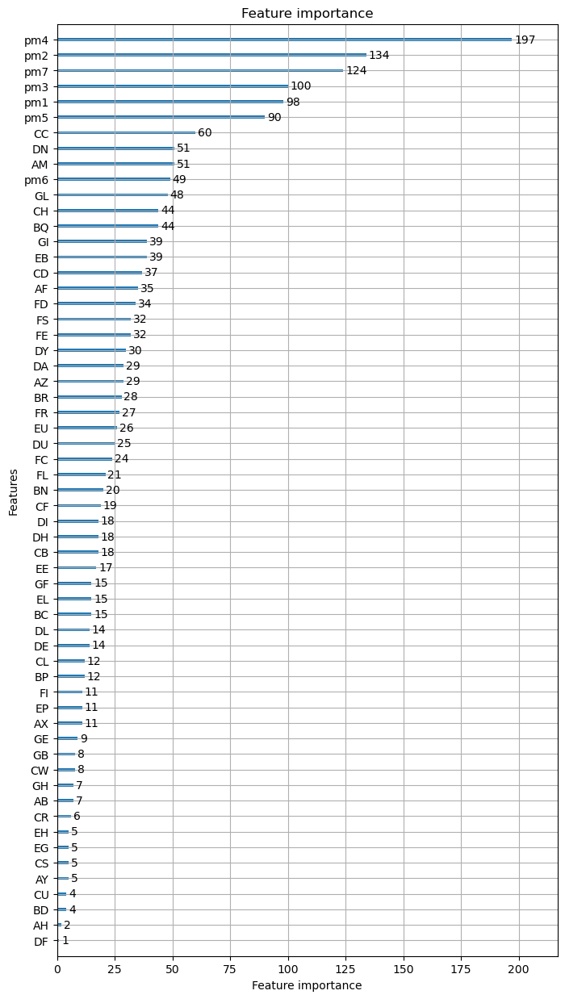

REPEAT NUMBER: 8/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.574873


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.437643
[300]	valid_0's balanced_logloss: 0.366305
[400]	valid_0's balanced_logloss: 0.324859
[500]	valid_0's balanced_logloss: 0.303837
[600]	valid_0's balanced_logloss: 0.29241
[700]	valid_0's balanced_logloss: 0.289915
[800]	valid_0's balanced_logloss: 0.288348
[900]	valid_0's balanced_logloss: 0.288424
[1000]	valid_0's balanced_logloss: 0.290204
[1100]	valid_0's balanced_logloss: 0.294077
[1200]	valid_0's balanced_logloss: 0.298577
[1300]	valid_0's balanced_logloss: 0.3029
[1400]	valid_0's balanced_logloss: 0.306184


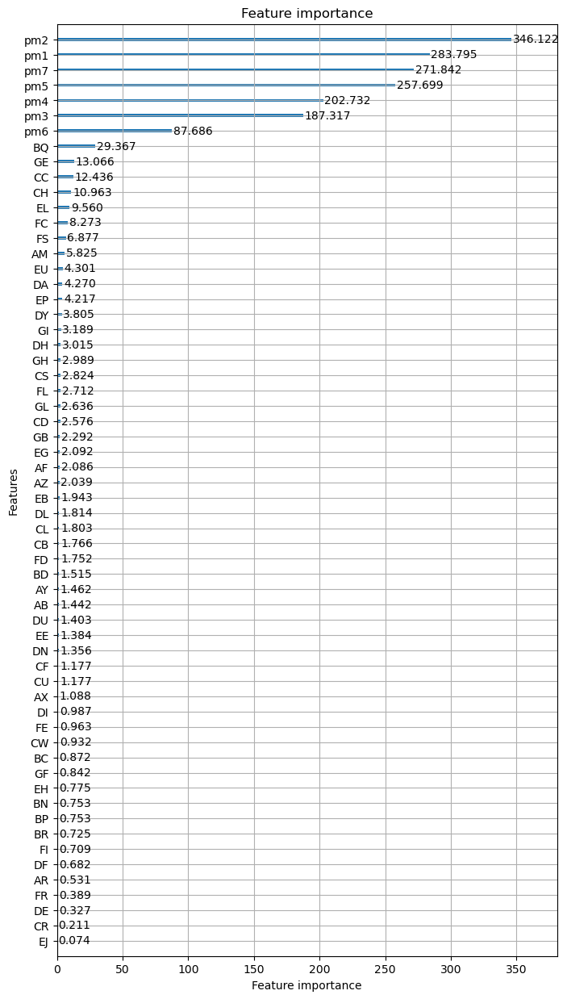

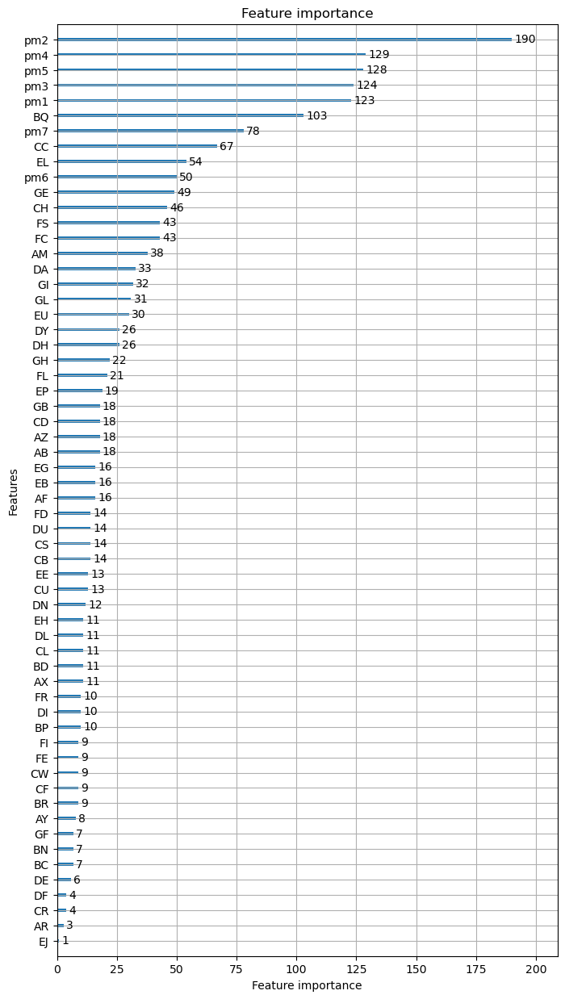

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.543008


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.383821
[300]	valid_0's balanced_logloss: 0.30064
[400]	valid_0's balanced_logloss: 0.2492
[500]	valid_0's balanced_logloss: 0.219776
[600]	valid_0's balanced_logloss: 0.200776
[700]	valid_0's balanced_logloss: 0.187926
[800]	valid_0's balanced_logloss: 0.182085
[900]	valid_0's balanced_logloss: 0.177551
[1000]	valid_0's balanced_logloss: 0.17313
[1100]	valid_0's balanced_logloss: 0.171491
[1200]	valid_0's balanced_logloss: 0.170431
[1300]	valid_0's balanced_logloss: 0.168887
[1400]	valid_0's balanced_logloss: 0.167084


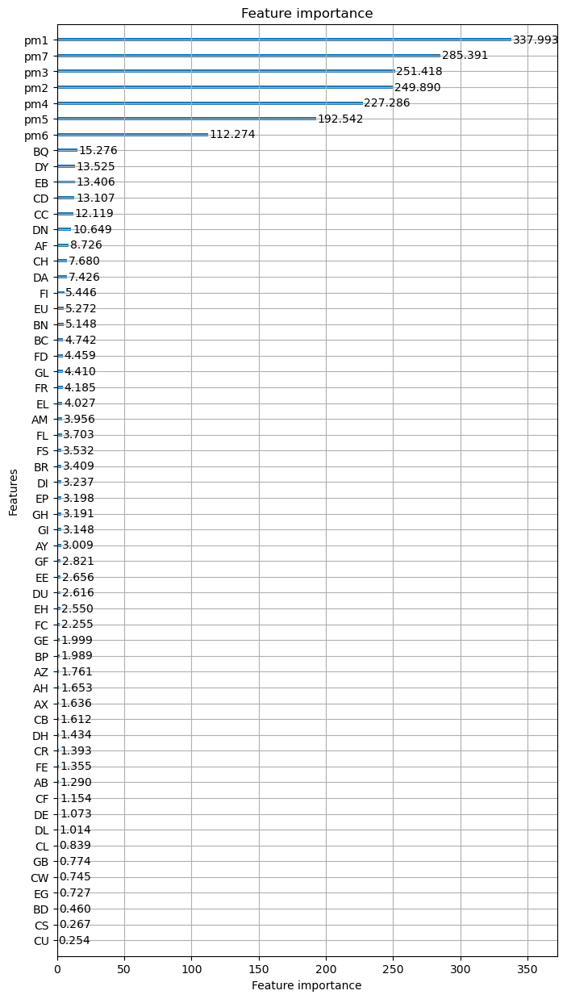

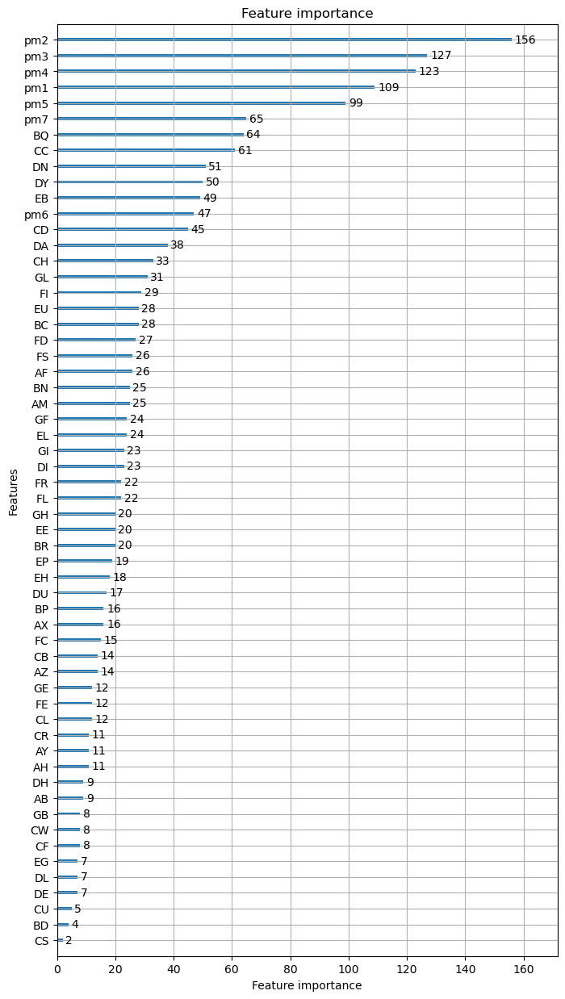

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.558465


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.415011
[300]	valid_0's balanced_logloss: 0.34867
[400]	valid_0's balanced_logloss: 0.307842
[500]	valid_0's balanced_logloss: 0.287336
[600]	valid_0's balanced_logloss: 0.275296
[700]	valid_0's balanced_logloss: 0.268147
[800]	valid_0's balanced_logloss: 0.26564
[900]	valid_0's balanced_logloss: 0.263041
[1000]	valid_0's balanced_logloss: 0.263308
[1100]	valid_0's balanced_logloss: 0.264368
[1200]	valid_0's balanced_logloss: 0.264201
[1300]	valid_0's balanced_logloss: 0.263218
[1400]	valid_0's balanced_logloss: 0.265063


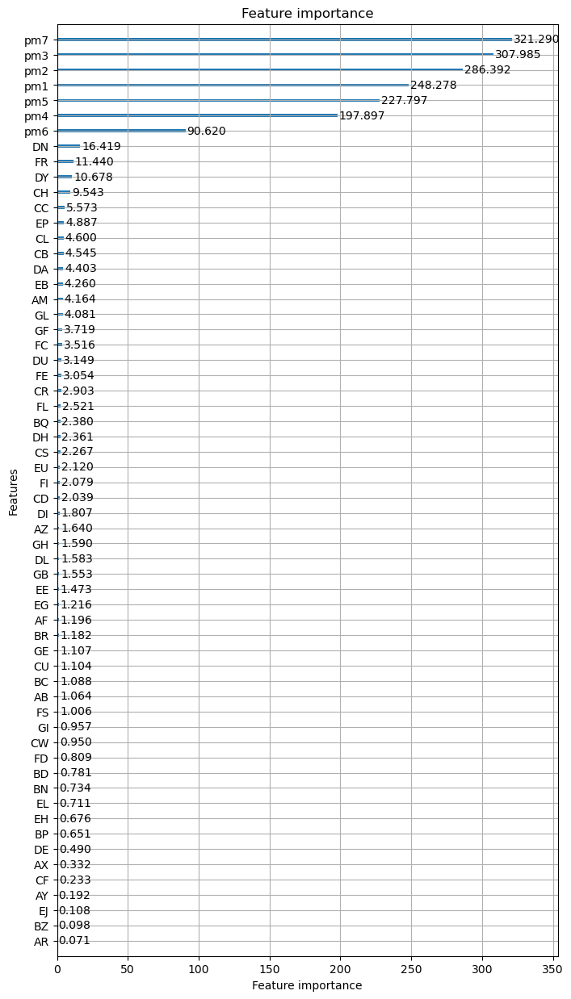

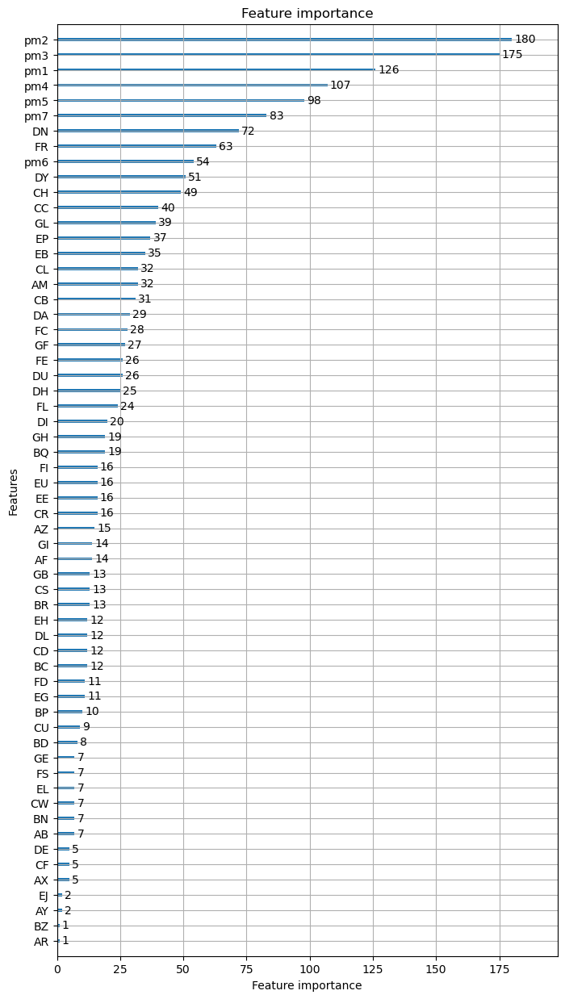

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.540038


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.385423
[300]	valid_0's balanced_logloss: 0.301736
[400]	valid_0's balanced_logloss: 0.255296
[500]	valid_0's balanced_logloss: 0.227741
[600]	valid_0's balanced_logloss: 0.209334
[700]	valid_0's balanced_logloss: 0.1978
[800]	valid_0's balanced_logloss: 0.190044
[900]	valid_0's balanced_logloss: 0.185661
[1000]	valid_0's balanced_logloss: 0.182501
[1100]	valid_0's balanced_logloss: 0.178769
[1200]	valid_0's balanced_logloss: 0.178013
[1300]	valid_0's balanced_logloss: 0.173831
[1400]	valid_0's balanced_logloss: 0.173472


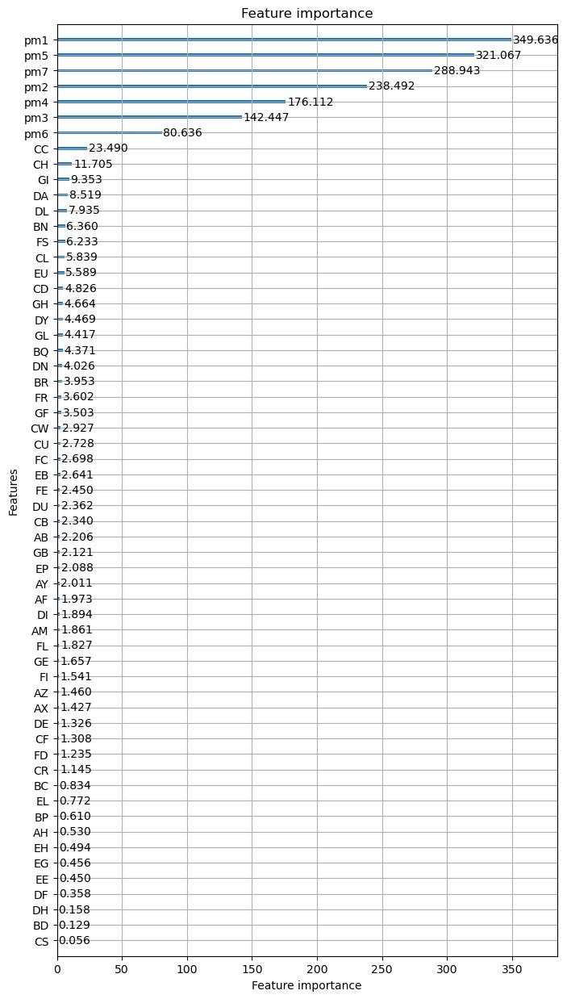

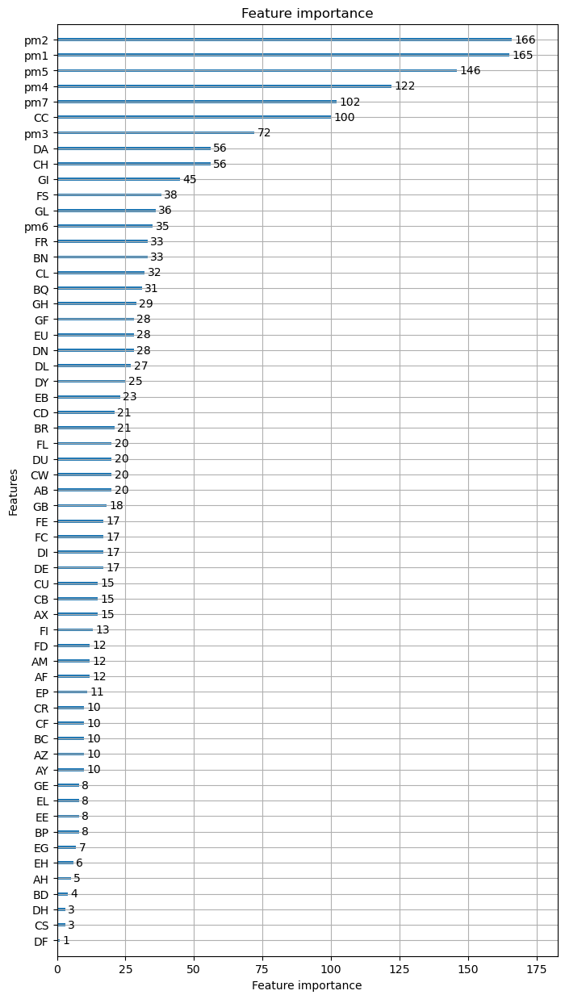

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.551953


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.40067
[300]	valid_0's balanced_logloss: 0.320791
[400]	valid_0's balanced_logloss: 0.270327
[500]	valid_0's balanced_logloss: 0.241499
[600]	valid_0's balanced_logloss: 0.220506
[700]	valid_0's balanced_logloss: 0.209382
[800]	valid_0's balanced_logloss: 0.20209
[900]	valid_0's balanced_logloss: 0.197001
[1000]	valid_0's balanced_logloss: 0.195064
[1100]	valid_0's balanced_logloss: 0.193408
[1200]	valid_0's balanced_logloss: 0.192593
[1300]	valid_0's balanced_logloss: 0.191884
[1400]	valid_0's balanced_logloss: 0.19031


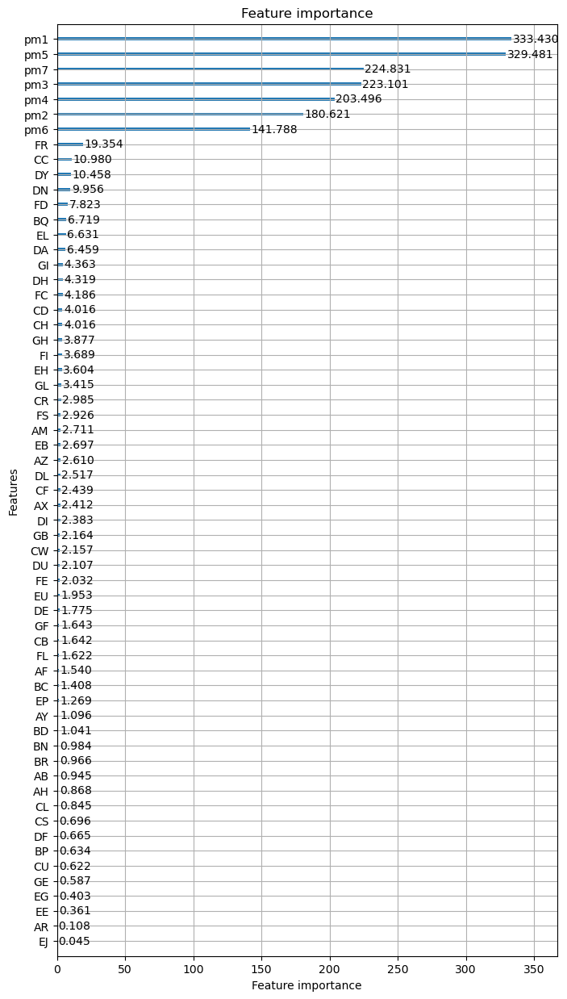

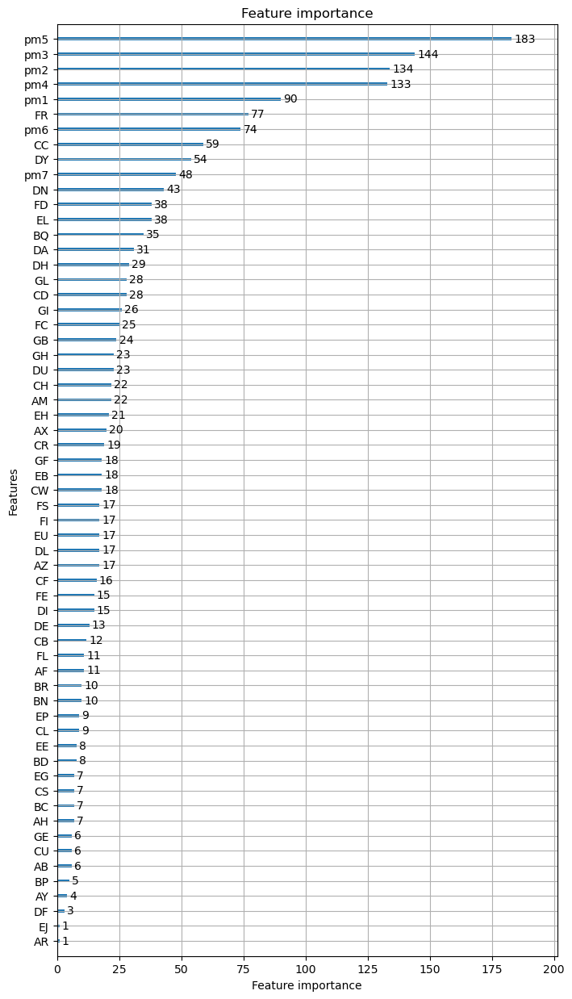

REPEAT NUMBER: 9/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.534873


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.37775
[300]	valid_0's balanced_logloss: 0.299406
[400]	valid_0's balanced_logloss: 0.248057
[500]	valid_0's balanced_logloss: 0.222272
[600]	valid_0's balanced_logloss: 0.205679
[700]	valid_0's balanced_logloss: 0.198826
[800]	valid_0's balanced_logloss: 0.192867
[900]	valid_0's balanced_logloss: 0.187924
[1000]	valid_0's balanced_logloss: 0.186294
[1100]	valid_0's balanced_logloss: 0.186037
[1200]	valid_0's balanced_logloss: 0.184979
[1300]	valid_0's balanced_logloss: 0.185112
[1400]	valid_0's balanced_logloss: 0.186404


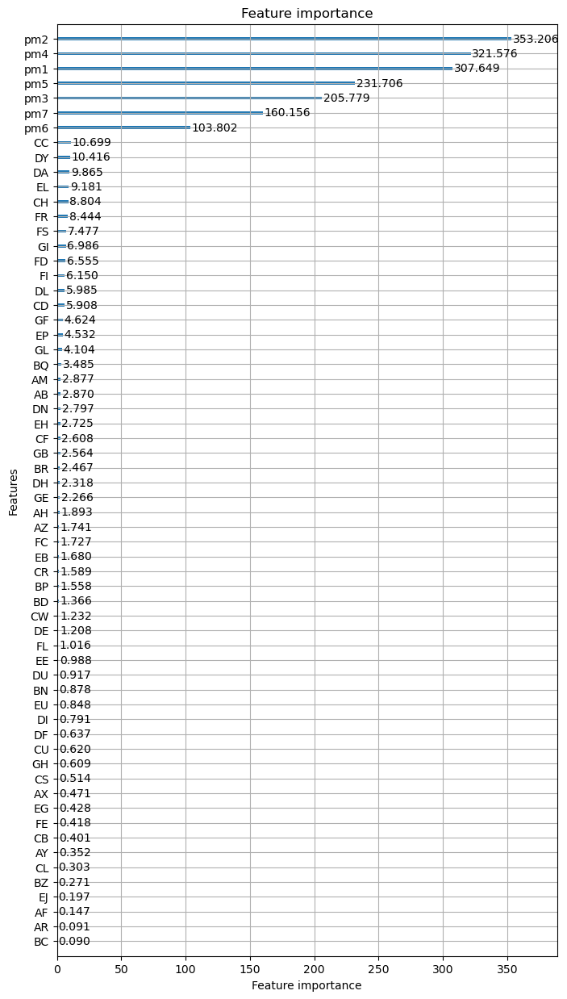

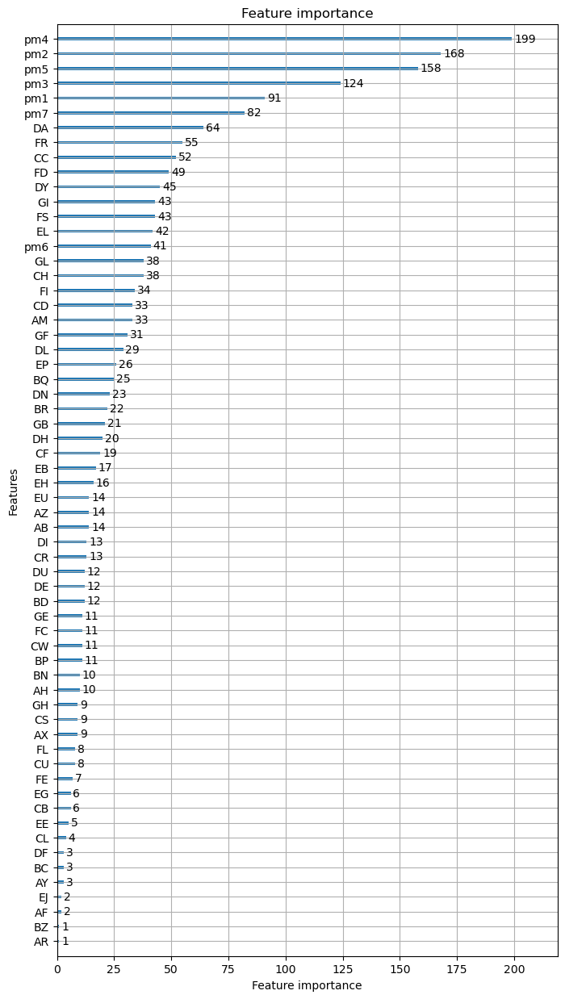

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.514967


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.355273
[300]	valid_0's balanced_logloss: 0.270254
[400]	valid_0's balanced_logloss: 0.219133
[500]	valid_0's balanced_logloss: 0.191983
[600]	valid_0's balanced_logloss: 0.174082
[700]	valid_0's balanced_logloss: 0.162637
[800]	valid_0's balanced_logloss: 0.155561
[900]	valid_0's balanced_logloss: 0.150096
[1000]	valid_0's balanced_logloss: 0.145894
[1100]	valid_0's balanced_logloss: 0.141806
[1200]	valid_0's balanced_logloss: 0.136645
[1300]	valid_0's balanced_logloss: 0.133985
[1400]	valid_0's balanced_logloss: 0.130499


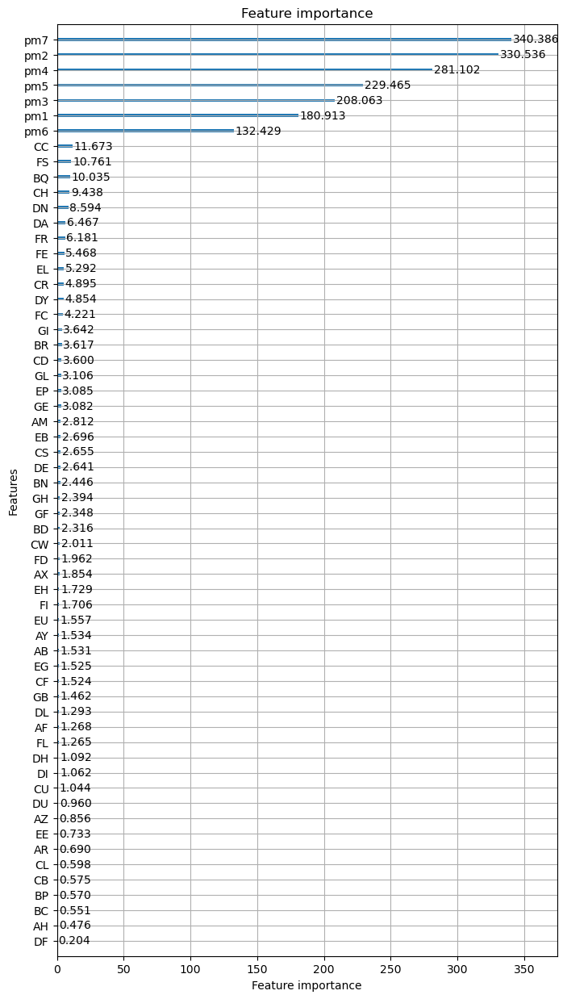

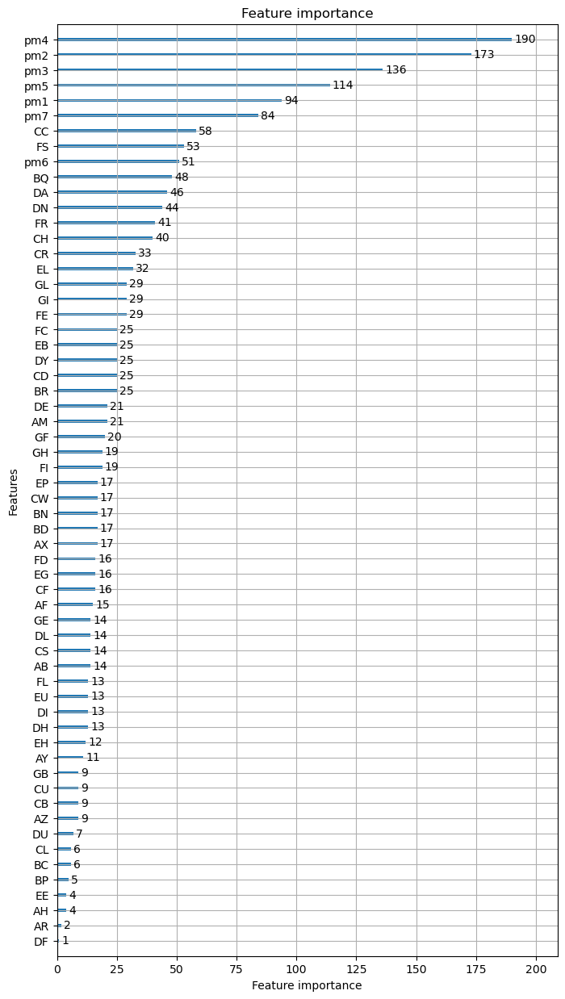

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.583719


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.429314
[300]	valid_0's balanced_logloss: 0.344529
[400]	valid_0's balanced_logloss: 0.295775
[500]	valid_0's balanced_logloss: 0.269199
[600]	valid_0's balanced_logloss: 0.254805
[700]	valid_0's balanced_logloss: 0.24396
[800]	valid_0's balanced_logloss: 0.237874
[900]	valid_0's balanced_logloss: 0.234987
[1000]	valid_0's balanced_logloss: 0.232131
[1100]	valid_0's balanced_logloss: 0.23141
[1200]	valid_0's balanced_logloss: 0.230216
[1300]	valid_0's balanced_logloss: 0.229141
[1400]	valid_0's balanced_logloss: 0.229983


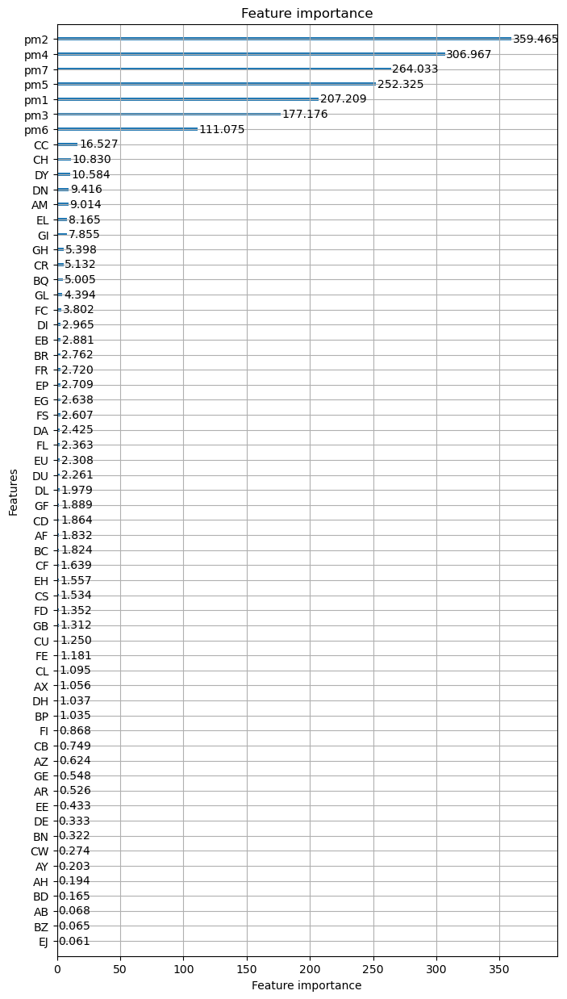

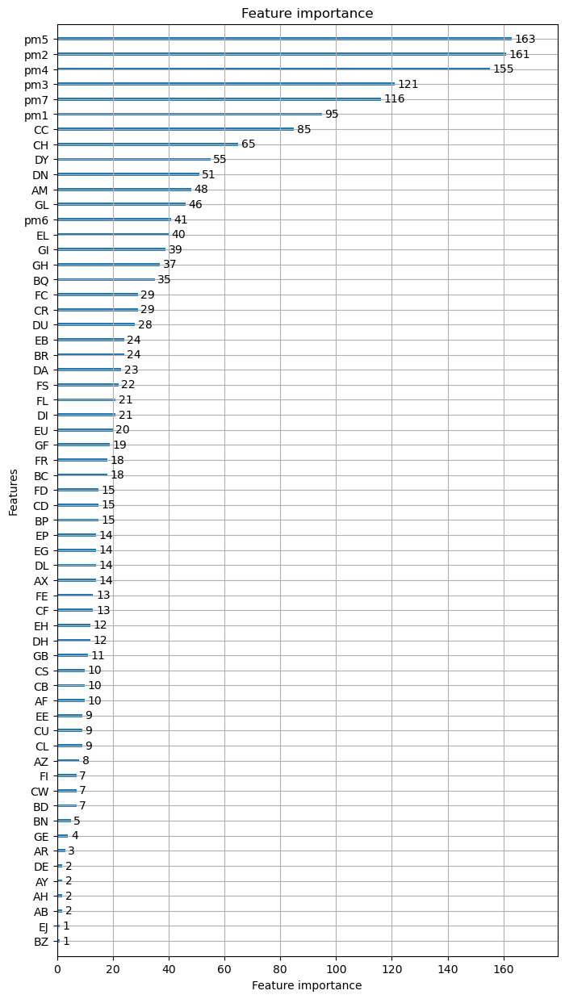

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.552834


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.401565
[300]	valid_0's balanced_logloss: 0.323169
[400]	valid_0's balanced_logloss: 0.275639
[500]	valid_0's balanced_logloss: 0.252045
[600]	valid_0's balanced_logloss: 0.237225
[700]	valid_0's balanced_logloss: 0.229467
[800]	valid_0's balanced_logloss: 0.225602
[900]	valid_0's balanced_logloss: 0.222563
[1000]	valid_0's balanced_logloss: 0.220883
[1100]	valid_0's balanced_logloss: 0.221028
[1200]	valid_0's balanced_logloss: 0.220287
[1300]	valid_0's balanced_logloss: 0.220482
[1400]	valid_0's balanced_logloss: 0.221048


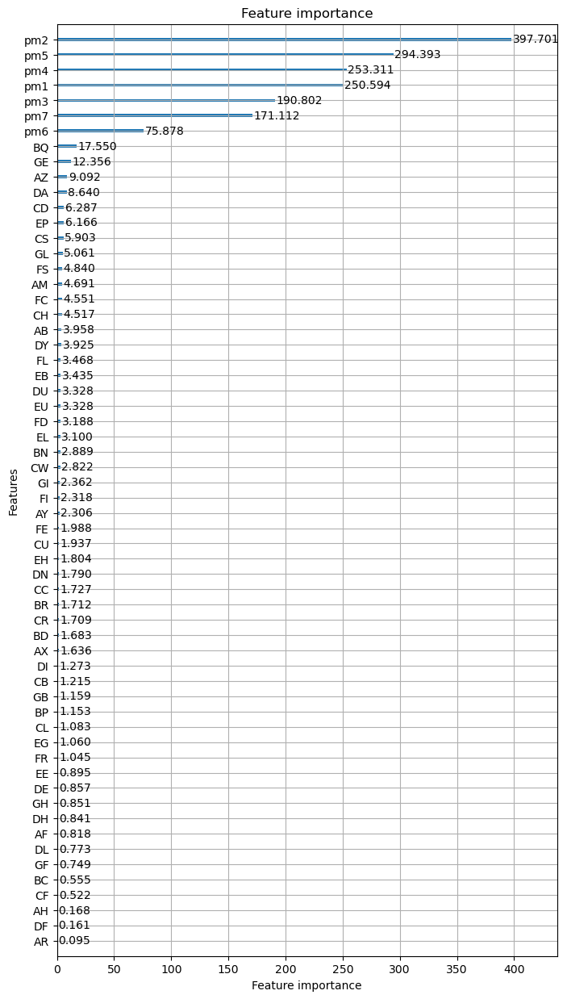

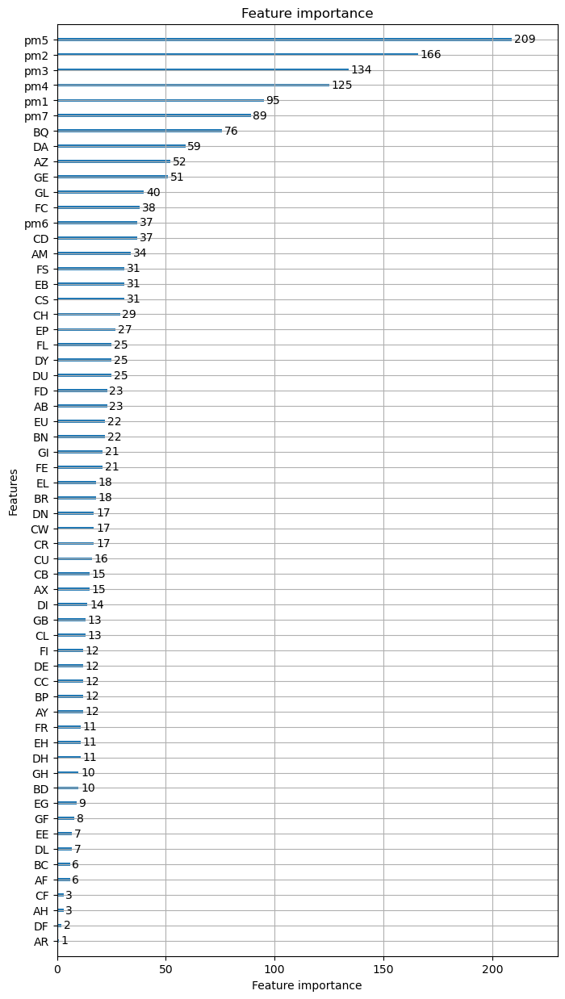

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.5322


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.380516
[300]	valid_0's balanced_logloss: 0.306662
[400]	valid_0's balanced_logloss: 0.266236
[500]	valid_0's balanced_logloss: 0.247147
[600]	valid_0's balanced_logloss: 0.237272
[700]	valid_0's balanced_logloss: 0.233675
[800]	valid_0's balanced_logloss: 0.231739
[900]	valid_0's balanced_logloss: 0.230271
[1000]	valid_0's balanced_logloss: 0.228331
[1100]	valid_0's balanced_logloss: 0.228572
[1200]	valid_0's balanced_logloss: 0.229493
[1300]	valid_0's balanced_logloss: 0.228745
[1400]	valid_0's balanced_logloss: 0.228024


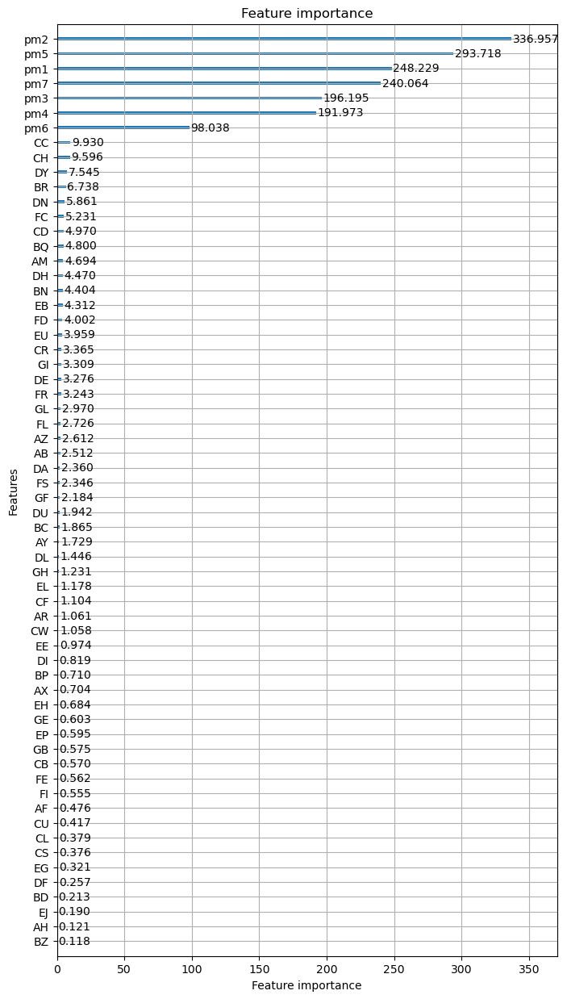

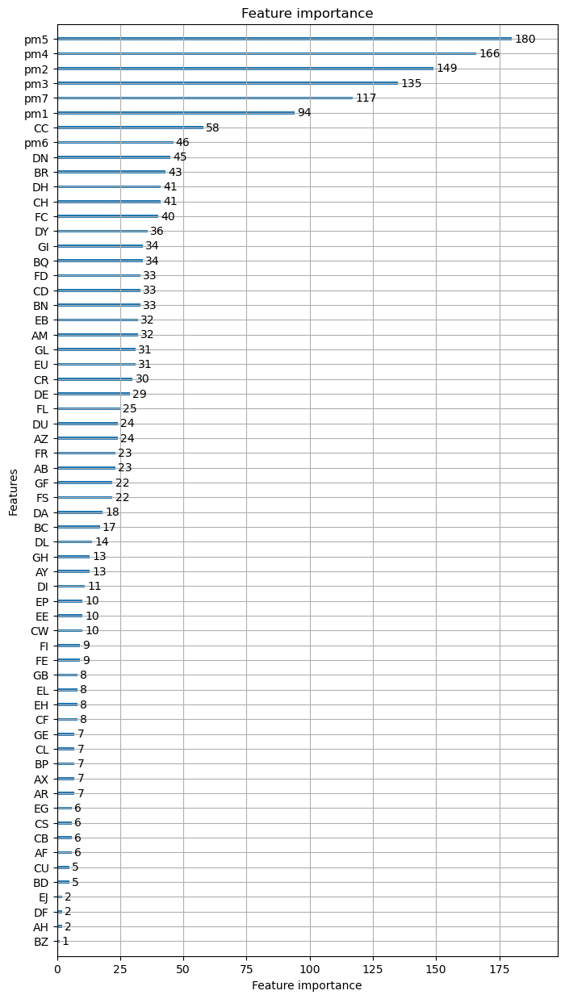

REPEAT NUMBER: 10/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.51909


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.370591
[300]	valid_0's balanced_logloss: 0.284545
[400]	valid_0's balanced_logloss: 0.231474
[500]	valid_0's balanced_logloss: 0.196326
[600]	valid_0's balanced_logloss: 0.173003
[700]	valid_0's balanced_logloss: 0.160901
[800]	valid_0's balanced_logloss: 0.153069
[900]	valid_0's balanced_logloss: 0.148672
[1000]	valid_0's balanced_logloss: 0.144309
[1100]	valid_0's balanced_logloss: 0.140047
[1200]	valid_0's balanced_logloss: 0.138126
[1300]	valid_0's balanced_logloss: 0.137375
[1400]	valid_0's balanced_logloss: 0.135062


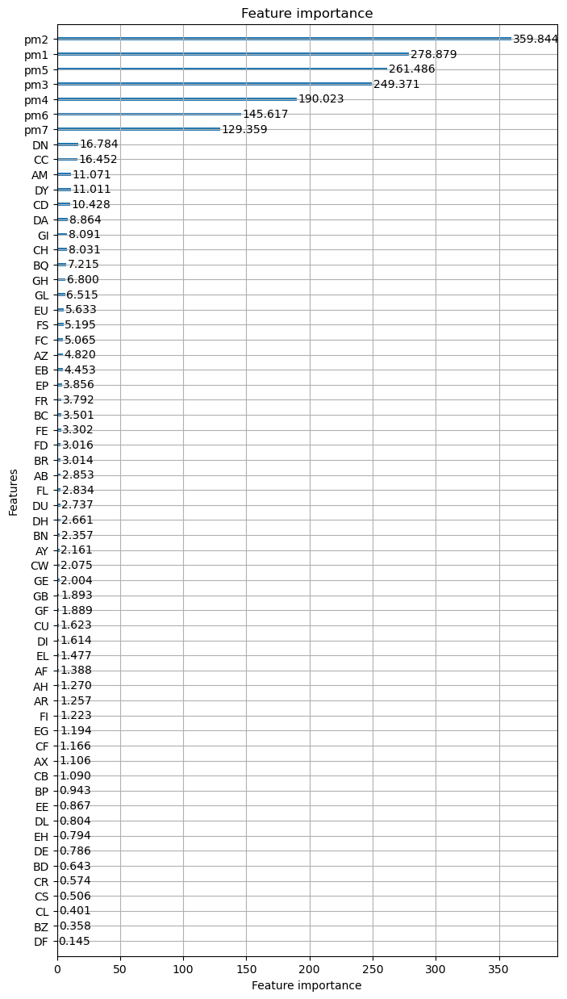

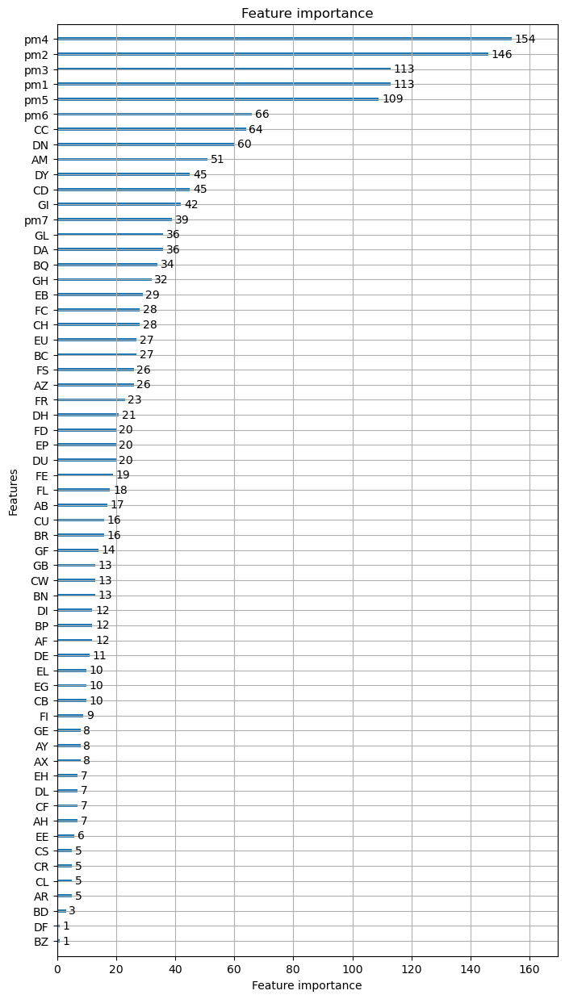

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.603257


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.45966
[300]	valid_0's balanced_logloss: 0.389969
[400]	valid_0's balanced_logloss: 0.350941
[500]	valid_0's balanced_logloss: 0.32977
[600]	valid_0's balanced_logloss: 0.315713
[700]	valid_0's balanced_logloss: 0.310144
[800]	valid_0's balanced_logloss: 0.312145
[900]	valid_0's balanced_logloss: 0.321119
[1000]	valid_0's balanced_logloss: 0.324843
[1100]	valid_0's balanced_logloss: 0.332887
[1200]	valid_0's balanced_logloss: 0.338986
[1300]	valid_0's balanced_logloss: 0.346273
[1400]	valid_0's balanced_logloss: 0.353817


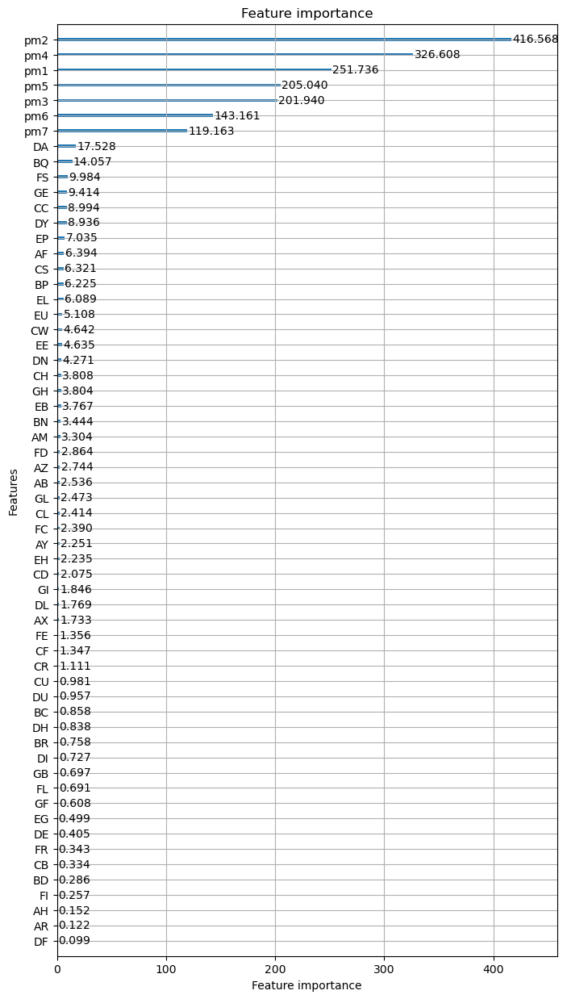

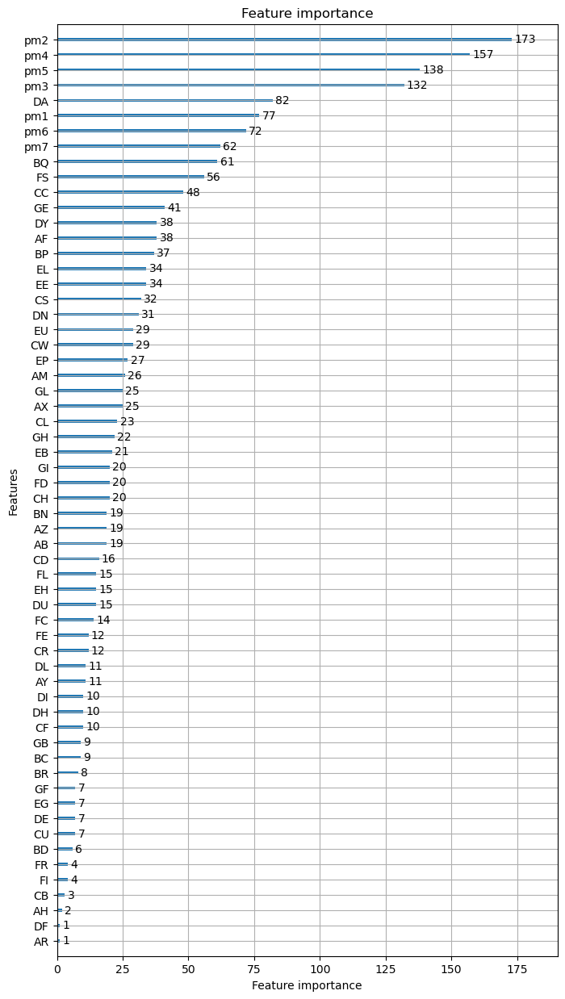

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.564709


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.411021
[300]	valid_0's balanced_logloss: 0.332589
[400]	valid_0's balanced_logloss: 0.274856
[500]	valid_0's balanced_logloss: 0.246994
[600]	valid_0's balanced_logloss: 0.22643
[700]	valid_0's balanced_logloss: 0.216624
[800]	valid_0's balanced_logloss: 0.21128
[900]	valid_0's balanced_logloss: 0.208927
[1000]	valid_0's balanced_logloss: 0.208909
[1100]	valid_0's balanced_logloss: 0.209579
[1200]	valid_0's balanced_logloss: 0.210793
[1300]	valid_0's balanced_logloss: 0.210172
[1400]	valid_0's balanced_logloss: 0.213076


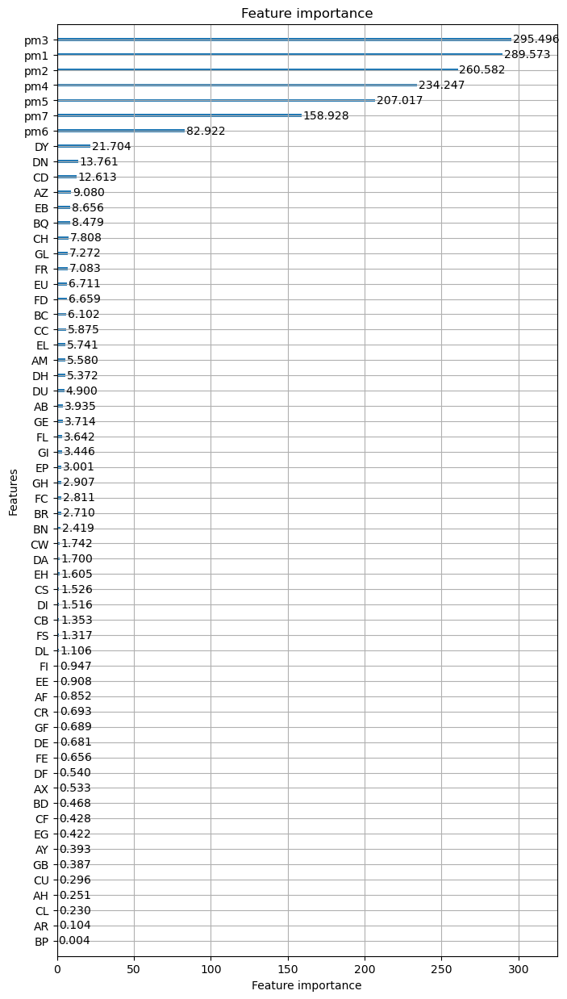

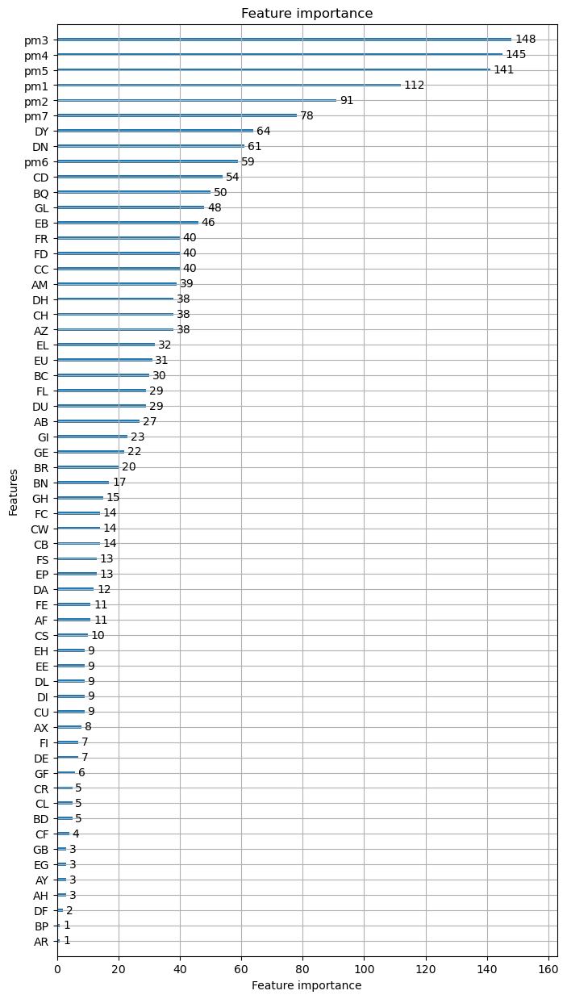

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.560668


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.410385
[300]	valid_0's balanced_logloss: 0.34022
[400]	valid_0's balanced_logloss: 0.29685
[500]	valid_0's balanced_logloss: 0.275405
[600]	valid_0's balanced_logloss: 0.261361
[700]	valid_0's balanced_logloss: 0.254156
[800]	valid_0's balanced_logloss: 0.250296
[900]	valid_0's balanced_logloss: 0.247428
[1000]	valid_0's balanced_logloss: 0.244706
[1100]	valid_0's balanced_logloss: 0.24392
[1200]	valid_0's balanced_logloss: 0.244728
[1300]	valid_0's balanced_logloss: 0.243804
[1400]	valid_0's balanced_logloss: 0.243316


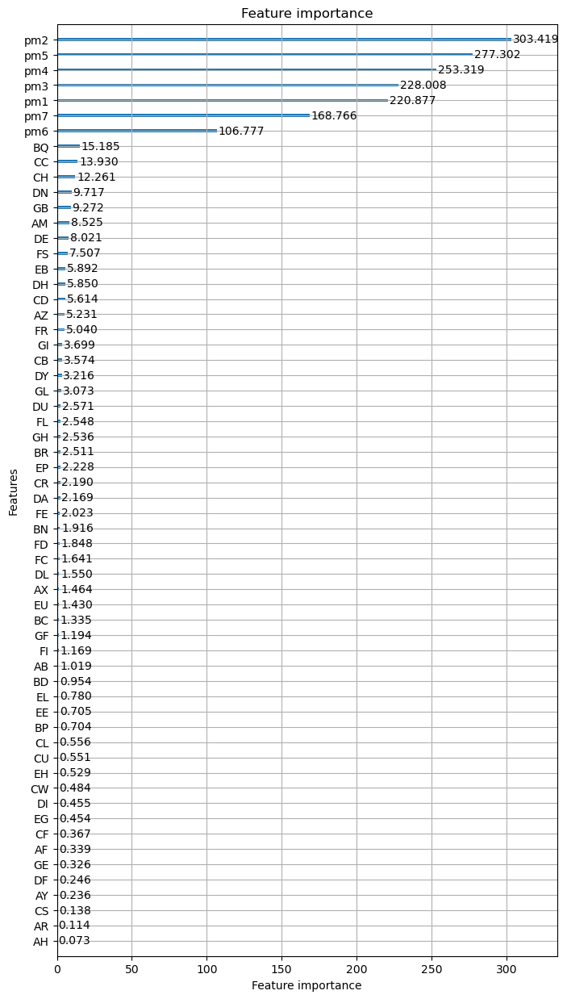

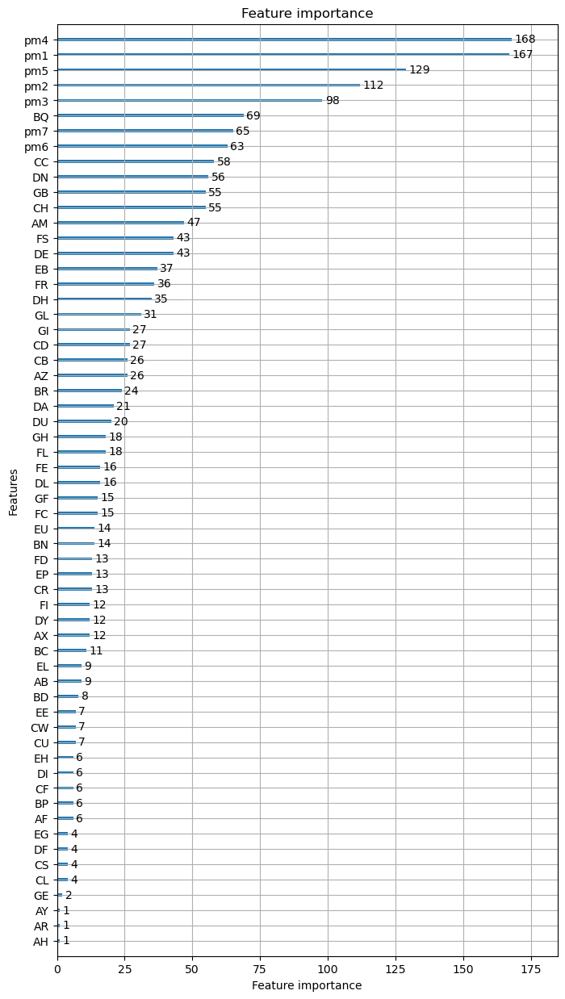

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.555001


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.422568
[300]	valid_0's balanced_logloss: 0.363053
[400]	valid_0's balanced_logloss: 0.328825
[500]	valid_0's balanced_logloss: 0.310568
[600]	valid_0's balanced_logloss: 0.302309
[700]	valid_0's balanced_logloss: 0.297876
[800]	valid_0's balanced_logloss: 0.293584
[900]	valid_0's balanced_logloss: 0.293558
[1000]	valid_0's balanced_logloss: 0.2939
[1100]	valid_0's balanced_logloss: 0.295443
[1200]	valid_0's balanced_logloss: 0.298788
[1300]	valid_0's balanced_logloss: 0.300837
[1400]	valid_0's balanced_logloss: 0.30299


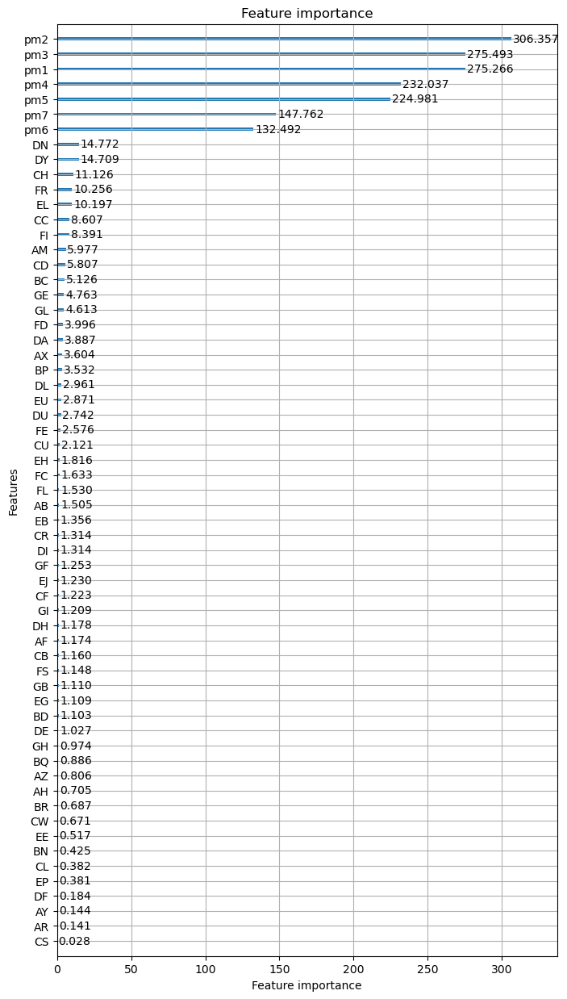

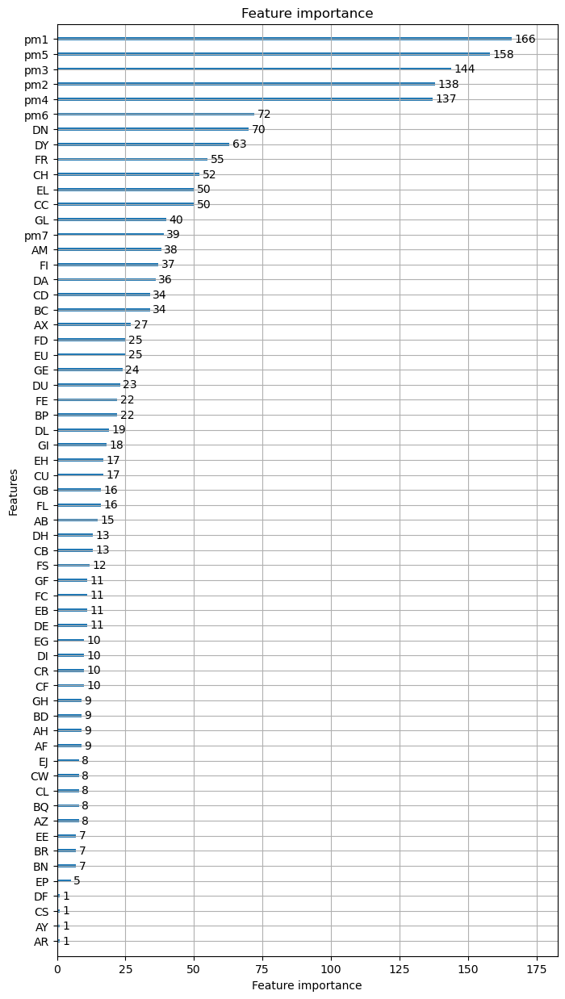

In [40]:
VERBOSE = True

models = list()
metrics = list()
oof_dfs = list()

for repeat in range(REPETITIONS):
    print(f"REPEAT NUMBER: {repeat+1}/{REPETITIONS}")
    cv_split = repeated_cv_split[f"repeat_{repeat}"]
    n_folds = len(cv_split)
    
    oof = train[["Id","Class"]].copy()
    oof["pred_proba"] = np.nan
    
    for split in cv_split:
        fold = split["fold"]
        train_idx = split["train_idx"]
        valid_idx = split["valid_idx"]
        print(f"training model for fold: {fold+1}/{n_folds}")
        
        _train,_input_cols = include_oof_preds(train, input_cols, oof_all, repeat)
    
        train_df = _train.loc[train_idx,:].reset_index(drop=True)
        valid_df = _train.loc[valid_idx,:].reset_index(drop=True)

        train_dset = lgb.Dataset(
            data=train_df.loc[:,_input_cols],
            label=train_df.loc[:,"Class"].values,
            free_raw_data=False
        )
        valid_dset = lgb.Dataset(
            data=valid_df.loc[:,_input_cols],
            label=valid_df.loc[:,"Class"].values,
            free_raw_data=False
        )
        model = lgb.train(
            params=model_params,
            train_set=train_dset,
            valid_sets=[valid_dset,],
            feval=[balanced_logloss],
            callbacks=[lgb.log_evaluation(period=100),],
        )
        
        if VERBOSE:
            lgb.plot_importance(model, importance_type="gain", figsize=(8,15))
            plt.show()
            lgb.plot_importance(model, importance_type="split", figsize=(8,15))
            plt.show()
            
        y_pred = model.predict(valid_df.loc[:,_input_cols])
        valid_loss = balanced_logloss_(y_pred, valid_df.loc[:,"Class"].values)
        oof.loc[valid_idx, "pred_proba"] = y_pred
        
        models.append(model)
        metrics.append(valid_loss)
                
    oof_dfs.append(oof)

***
## OOF analysis and calibration


In [41]:
compute_overall_metric(oof_dfs)

0.22500171315023532

In [42]:
oof_scores = oof_dfs[0].copy()
oof_scores.rename({"pred_proba":"pred_proba0"}, axis=1, inplace=True)

for i in range(1, len(oof_dfs)):
    _df = oof_dfs[i].copy()
    _df.rename({"pred_proba":f"pred_proba{i}"}, axis=1, inplace=True)
    oof_scores = oof_scores.merge(_df, on=["Id","Class"])
    
oof_scores["avg_proba"] = oof_scores.iloc[:,2:].mean(axis=1)
oof_scores

,Id,Class,pred_proba0,pred_proba1,pred_proba2,pred_proba3,pred_proba4,pred_proba5,pred_proba6,pred_proba7,pred_proba8,pred_proba9,avg_proba
0,000ff2bfdfe9,1,0.930744,0.972590,0.959354,0.957054,0.951099,0.959860,0.966368,0.946055,0.970237,0.963547,0.957691
1,007255e47698,0,0.023260,0.031551,0.026466,0.026293,0.032452,0.013950,0.037916,0.021691,0.035460,0.020401,0.026944
2,013f2bd269f5,0,0.291103,0.356765,0.170413,0.469910,0.130080,0.197656,0.215220,0.054929,0.312810,0.194473,0.239336
3,043ac50845d5,0,0.048236,0.039793,0.025776,0.102018,0.059473,0.086844,0.076180,0.026934,0.028139,0.075950,0.056934
4,044fb8a146ec,1,0.765213,0.955519,0.848812,0.729419,0.942988,0.835169,0.805058,0.909780,0.731566,0.809836,0.833336
...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,fd3dafe738fd,0,0.030415,0.019974,0.066698,0.030828,0.026561,0.039323,0.035415,0.032635,0.031105,0.014944,0.032790
613,fd895603f071,0,0.072627,0.015590,0.127355,0.097368,0.070375,0.016291,0.022165,0.072284,0.045484,0.049982,0.058952
614,fd8ef6377f76,0,0.020261,0.046431,0.018356,0.035218,0.024834,0.032578,0.027271,0.023438,0.016907,0.038021,0.028332
615,fe1942975e40,0,0.021279,0.025214,0.030184,0.060197,0.018440,0.013444,0.038109,0.039740,0.024897,0.042657,0.031416


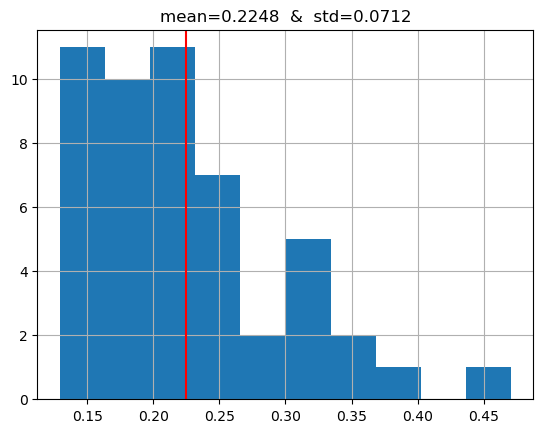

In [43]:
_metrics = metrics[:50]

metric_mean = np.mean(_metrics)
metric_median = np.median(_metrics)
metric_std = np.std(_metrics)

plt.hist(_metrics, bins=10)
plt.axvline(metric_mean, c="r")
plt.title(f"mean={metric_mean:0.4f}  &  std={metric_std:0.4f}")
plt.grid()
plt.show()

In [44]:
calib_params = optimize_calibration(oof_dfs)

best_value: 0.22253520471937777
best_params: {'alpha': 1.3837668885428576, 'beta': 3.8761434329284308, 'gamma': 0.9126778048543218}


####################################################################################################
CV repeat nbr: 1 - metric: 0.2241


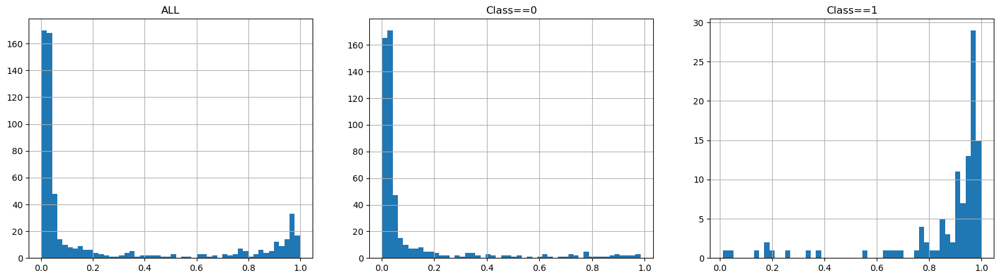

CV repeat nbr: 1 - metric: 0.2208


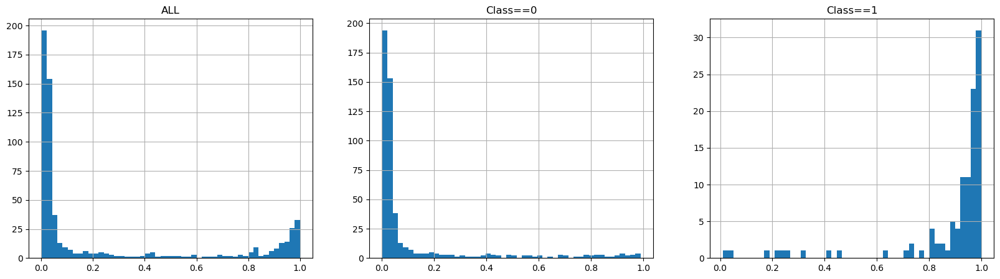

####################################################################################################
CV repeat nbr: 2 - metric: 0.2285


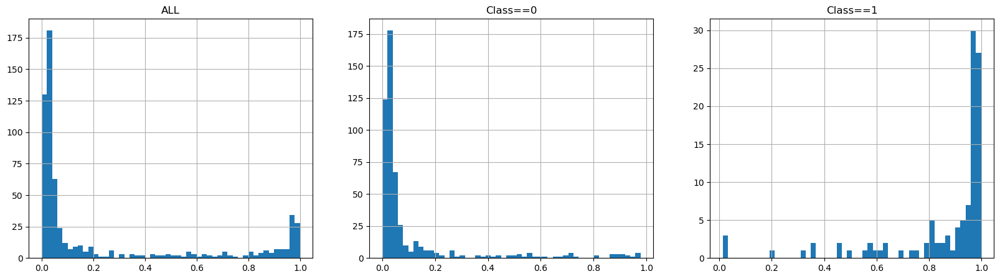

CV repeat nbr: 2 - metric: 0.2253


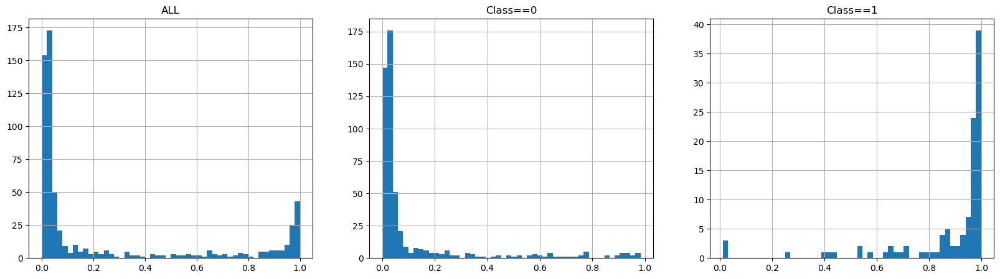

####################################################################################################
CV repeat nbr: 3 - metric: 0.2184


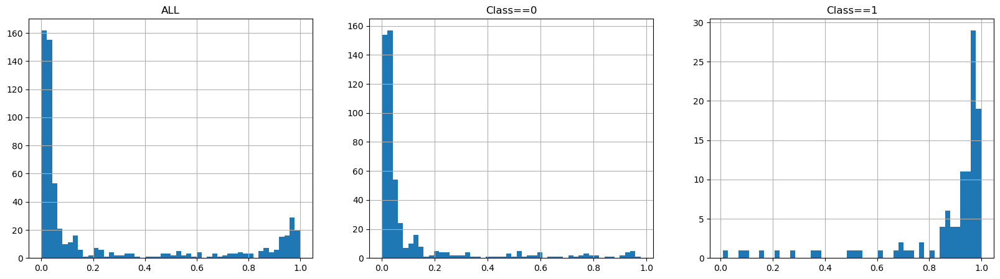

CV repeat nbr: 3 - metric: 0.2168


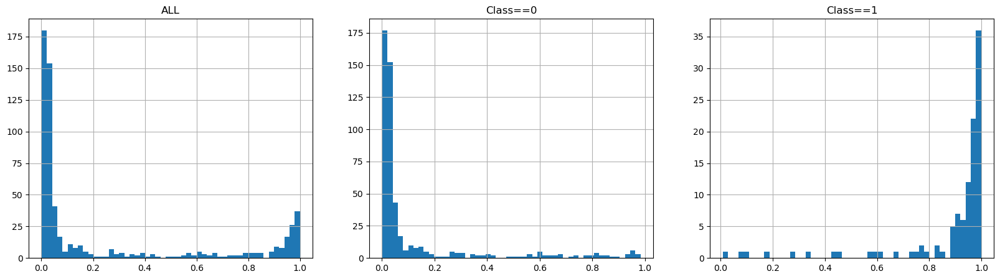

####################################################################################################
CV repeat nbr: 4 - metric: 0.2277


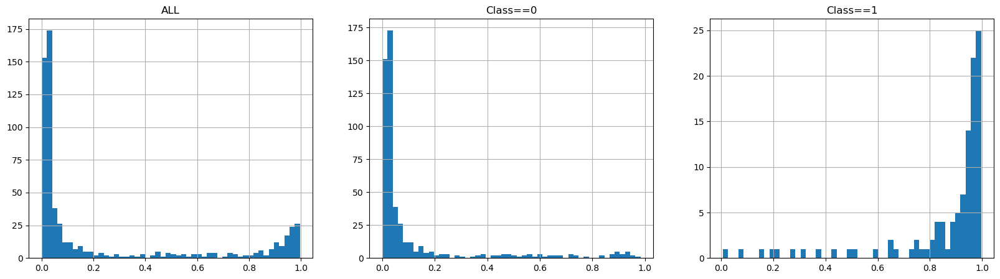

CV repeat nbr: 4 - metric: 0.2247


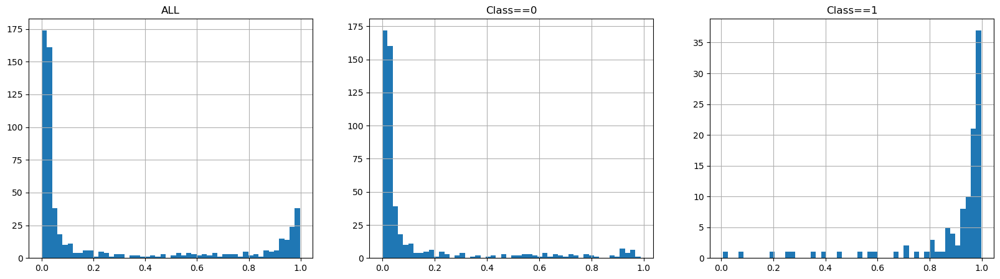

####################################################################################################
CV repeat nbr: 5 - metric: 0.2431


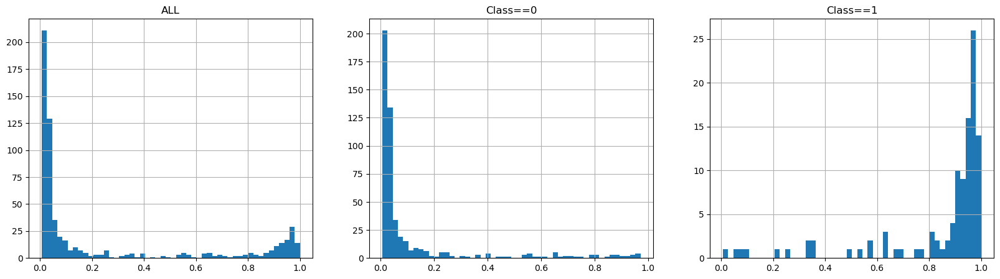

CV repeat nbr: 5 - metric: 0.2406


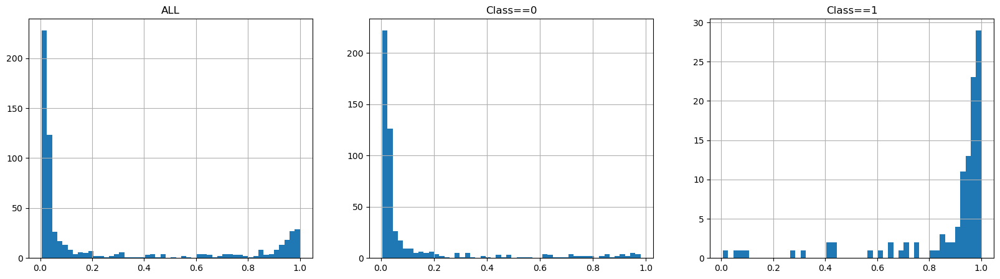

####################################################################################################
CV repeat nbr: 6 - metric: 0.2140


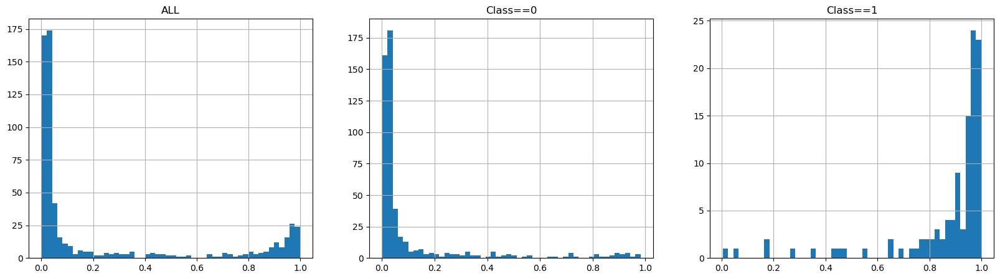

CV repeat nbr: 6 - metric: 0.2119


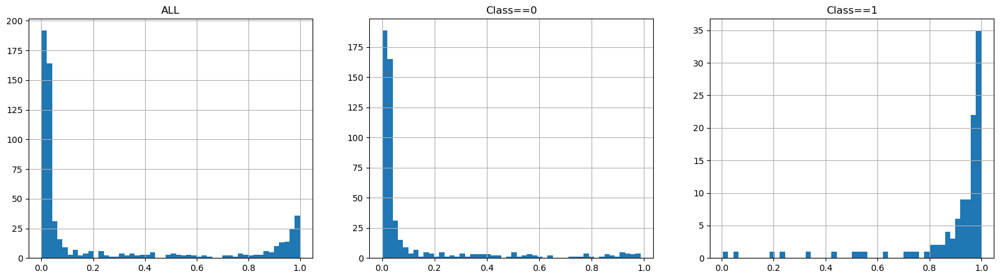

####################################################################################################
CV repeat nbr: 7 - metric: 0.2225


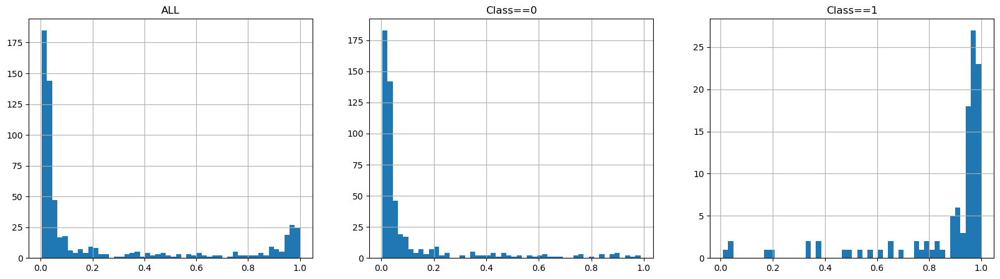

CV repeat nbr: 7 - metric: 0.2201


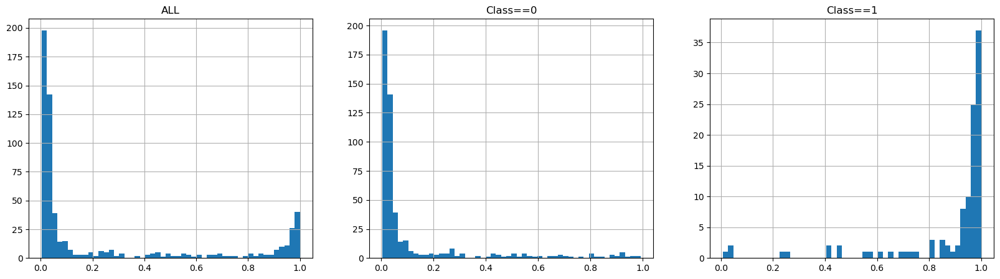

####################################################################################################
CV repeat nbr: 8 - metric: 0.2213


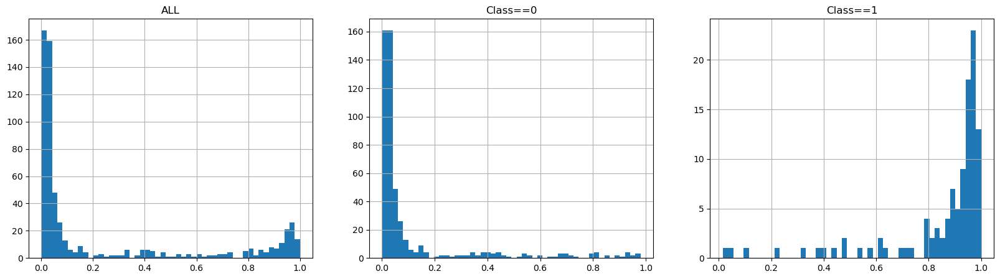

CV repeat nbr: 8 - metric: 0.2186


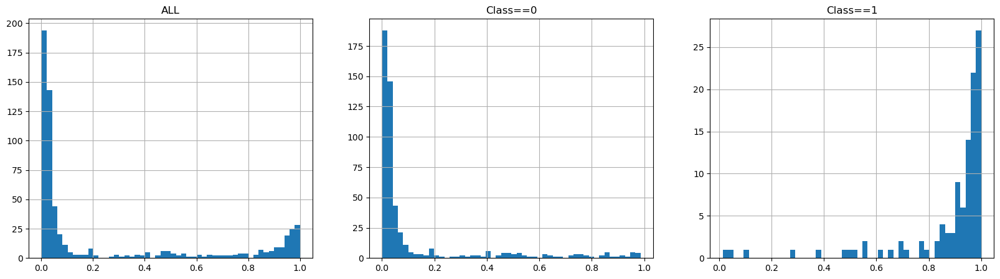

####################################################################################################
CV repeat nbr: 9 - metric: 0.1996


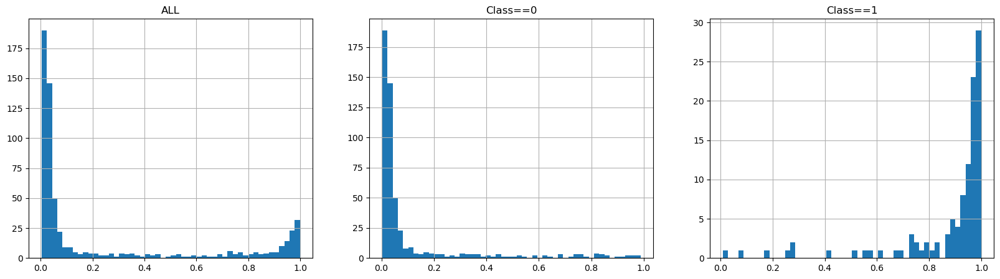

CV repeat nbr: 9 - metric: 0.1969


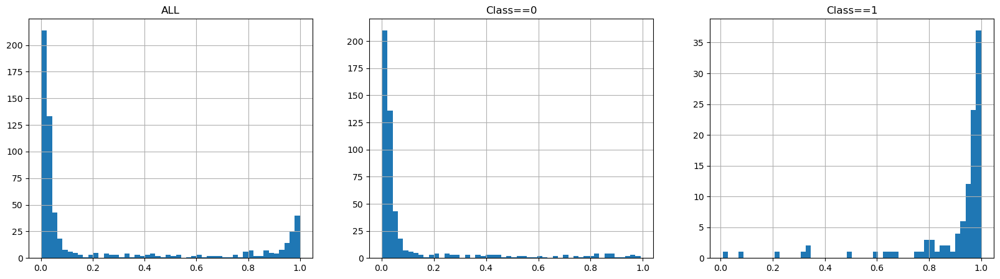

####################################################################################################
CV repeat nbr: 10 - metric: 0.2508


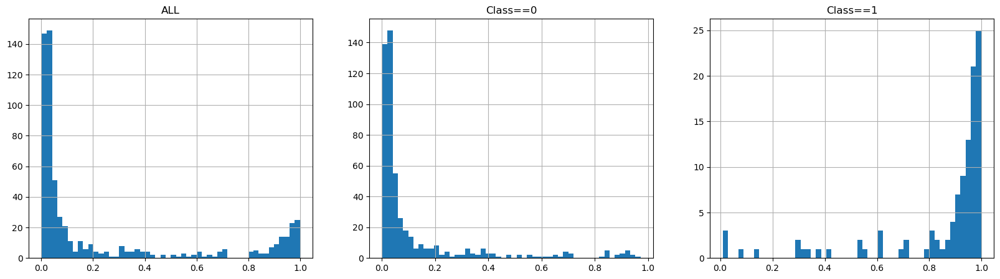

CV repeat nbr: 10 - metric: 0.2495


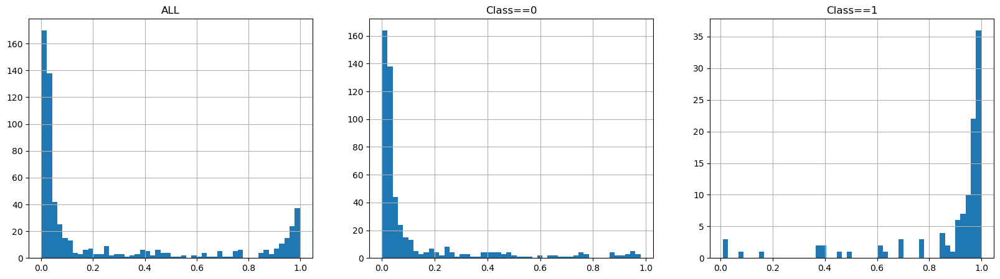

In [45]:
for i,oof in enumerate(oof_dfs):
    print("#"*100)
    oof = oof.copy()
    
    metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
    print(f"CV repeat nbr: {i+1} - metric: {metric:0.4f}")

    plt.figure(figsize=(20,5))

    plt.subplot(1,3,1)
    plt.title("ALL")
    oof.pred_proba.hist(bins=50)

    plt.subplot(1,3,2)
    plt.title("Class==0")
    oof.query("Class==0").pred_proba.hist(bins=50)

    plt.subplot(1,3,3)
    plt.title("Class==1")
    oof.query("Class==1").pred_proba.hist(bins=50)

    plt.show()
    
    calib_p1 = calibrate_probs(
        oof.pred_proba.values,
        **calib_params
    )
    oof["pred_proba"] = calib_p1
    
    metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
    print(f"CV repeat nbr: {i+1} - metric: {metric:0.4f}")

    plt.figure(figsize=(20,5))

    plt.subplot(1,3,1)
    plt.title("ALL")
    oof.pred_proba.hist(bins=50)

    plt.subplot(1,3,2)
    plt.title("Class==0")
    oof.query("Class==0").pred_proba.hist(bins=50)

    plt.subplot(1,3,3)
    plt.title("Class==1")
    oof.query("Class==1").pred_proba.hist(bins=50)

    plt.show()


***
# stacking predictions

In [46]:
input_cols = input_cols.tolist().copy()

predicted_probs_all = [
    predicted_probs_m01,
    predicted_probs_m02,
    predicted_probs_m03,
    predicted_probs_m04,
    predicted_probs_m05,
    predicted_probs_m06,
    predicted_probs_m07,
]

for i,proba in enumerate(predicted_probs_all):
    test[f"pm{i+1}"] = proba
    input_cols.append(f"pm{i+1}")

In [47]:
predicted_probs = [model.predict(test[input_cols]) for model in models]
predicted_probs = np.mean(predicted_probs, axis=0)
predicted_probs

array([0.56422188, 0.56422188, 0.56422188, 0.56422188, 0.56422186])

In [48]:
predicted_probs = calibrate_probs(predicted_probs, **calib_params)
predicted_probs = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)
predicted_probs

array([0.64178586, 0.64178586, 0.64178586, 0.64178586, 0.64178585])

In [49]:
sub = pd.read_csv("/kaggle/input/icr-identify-age-related-conditions/sample_submission.csv")
sub["class_0"] = 1-predicted_probs
sub["class_1"] = predicted_probs
sub.to_csv("submission.csv", index=False)
sub.describe()

,class_0,class_1
count,5.000000e+00,5.000000e+00
mean,3.582141e-01,6.417859e-01
std,6.572271e-09,6.572271e-09
min,3.582141e-01,6.417859e-01
25%,3.582141e-01,6.417859e-01
50%,3.582141e-01,6.417859e-01
75%,3.582141e-01,6.417859e-01
max,3.582141e-01,6.417859e-01


***